In [2]:
import seaborn as sns  
import matplotlib.pyplot as plt  
import pandas as pd 
from tqdm import tqdm  
import os 
import statsmodels.api as sm  
import numpy as np
from scipy import stats

In [3]:
path='/home2/zhenglijing/work/annovar/data.csv'
df_alldata=pd.read_csv(path,encoding='GBK')
df_alldata


,检测项目,检测套餐,性别,病历号,年龄,结果数据,结果说明
0,尿肌酐-1073,全套有机酸代谢分析(尿液),女,ASD_B22,5,118.9,正常
1,46. 阿拉伯糖醇,全套有机酸代谢分析(尿液),女,ASD_B22,5,54.67,正常
2,45. 酒石酸,全套有机酸代谢分析(尿液),女,ASD_B22,5,3.06,偏高
3,44. 柠苹酸,全套有机酸代谢分析(尿液),女,ASD_B22,5,3.07,正常
4,43. 丙三羧酸,全套有机酸代谢分析(尿液),女,ASD_B22,5,2.43,偏高
...,...,...,...,...,...,...,...
7918,解连蛋白,肠道功能健康评估（粪便）,男,ASD_076,7,254,偏高
7919,钙卫蛋白,肠道功能健康评估（粪便）,男,ASD_076,7,208,偏高
7920,分泌型免疫球蛋白,肠道功能健康评估（粪便）,男,ASD_076,7,2977,偏高
7921,组织转麸胺酶抗体,肠道功能健康评估（粪便）,男,ASD_076,7,629,偏高


In [4]:
alldata_pivotf=df_alldata[['检测项目','病历号','结果说明']].pivot_table(index='病历号', columns='检测项目', values='结果说明',aggfunc='sum')

In [5]:
alldata_pivotf=df_alldata[['检测项目','病历号','结果说明']].pivot_table(index='病历号', columns='检测项目', values='结果说明',aggfunc='sum')

In [6]:
alldata_pivotf

检测项目,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,18. 黄尿酸,...,鱿鱼,鲍鱼,鲑鱼,鳕鱼,鳗鱼,鸡肉,鸭肉,麦胶蛋白抗体,麸质,龙眼/桂圆
病历号,,,,,,,,,,,,,,,,,,,,,
ASD_051,正常,正常,正常,正常,正常,正常,正常,正常,正常,偏高,...,正常,正常,正常,正常,正常,正常,正常,正常,偏高,正常
ASD_052,正常,正常,正常,正常,正常,正常,正常,正常,正常,正常,...,正常,正常,正常,正常,正常,正常,正常,偏高,偏高,正常
ASD_053,正常,正常,正常,正常,正常,正常,正常,正常,正常,正常,...,正常,正常,正常,正常,正常,正常,正常,正常,偏高,正常
ASD_054,正常,正常,正常,正常,正常,正常,正常,正常,正常,正常,...,正常,正常,正常,正常,正常,正常,正常,正常,偏高,正常
ASD_055,正常,正常,正常,正常,正常,正常,正常,正常,正常,正常,...,正常,正常,正常,正常,正常,偏高,正常,正常,偏高,正常
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TD_085,正常,正常,正常,正常,正常,正常,正常,正常,正常,正常,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,偏高,NaN,NaN
TD_086,正常,正常,正常,正常,正常,正常,正常,正常,正常,正常,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,偏高,NaN,NaN
TD_087,偏高,正常,正常,正常,正常,正常,偏高,正常,正常,正常,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,正常,NaN,NaN


In [7]:
logitdf=alldata_pivotf[Hormone+gut].copy()
logitdf=logitdf.replace('正常',0)
logitdf=logitdf.replace('偏高',1)
logitdf=logitdf.replace('偏低',np.nan)
logitdf

NameError: name 'Hormone' is not defined

In [138]:
new_col=[]
for col in logitdf.columns:
    uni=len(logitdf.fillna(0)[col].unique())
    print(uni)
    if uni >1 :
        new_col.append(col)

2
2
2
2
2
2
2
2
2
2
1
1
1
1
1
2
2
2
2
2
2
1


In [61]:
new_col[:9]

['三氯沙', '双酚A', '单甲基酯', '单乙基酯', '单丁基酯', '单苄基酯', '单乙基己基酯', '甲酯', '乙酯']

In [71]:
new_col[9:]

['丙酯', '麦胶蛋白抗体', '组织转麸胺酶抗体', '分泌型免疫球蛋白', '钙卫蛋白', '解连蛋白', '葡萄糖醛酸酶']

In [81]:
logitdf['分泌型免疫球蛋白'].value_counts()

0.0    57
1.0     6
Name: 分泌型免疫球蛋白, dtype: int64

In [74]:
logitdf['丙酯'].unique()

array([ 0., nan,  1.])

In [77]:
logitdf['丙酯'].value_counts()

0.0    43
1.0     4
Name: 丙酯, dtype: int64

In [139]:
logitdf[X_columns].fillna(0)

检测项目,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯
病历号,,,,,,,,,
ASD_051,1.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0
ASD_052,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
ASD_053,0.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0
ASD_054,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
ASD_055,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
TD_085,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
TD_086,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
TD_087,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0


In [140]:
logitdf[X_columns].fillna(0).corr()

检测项目,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯
检测项目,,,,,,,,,
三氯沙,1.000000,-0.069338,0.171774,0.215014,0.191231,-0.030083,0.180028,-0.078125,0.169877
双酚A,-0.069338,1.000000,0.127643,0.040060,0.169721,0.289936,0.134948,0.169877,-0.061538
单甲基酯,0.171774,0.127643,1.000000,0.511531,0.674323,0.311022,0.507149,0.059959,0.127643
单乙基酯,0.215014,0.040060,0.511531,1.000000,0.582548,0.467096,0.419110,0.101762,0.291343
单丁基酯,0.191231,0.169721,0.674323,0.582548,1.000000,0.391188,0.655040,0.191231,0.169721
单苄基酯,-0.030083,0.289936,0.311022,0.467096,0.391188,1.000000,0.260541,0.099649,0.146011
单乙基己基酯,0.180028,0.134948,0.507149,0.419110,0.655040,0.260541,1.000000,0.180028,0.259100
甲酯,-0.078125,0.169877,0.059959,0.101762,0.191231,0.099649,0.180028,1.000000,-0.069338
乙酯,0.169877,-0.061538,0.127643,0.291343,0.169721,0.146011,0.259100,-0.069338,1.000000


In [141]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [142]:
rseultdict={}
for test in new_col[10:]:
    try:
        X_columns = new_col[:9]        Y_column =  test
        X = logitdf[X_columns].fillna(0)
        Y = logitdf[Y_column].fillna(0)

        X = sm.add_constant(X)

        model = sm.Logit(Y, X)
        result = model.fit(disp=0)

        params = result.params
        conf_int = result.conf_int()
        p_values = result.pvalues

        results_df = pd.DataFrame({
            'Variable': params.index,
            'Coefficient': params.values,
            'OR': np.exp(params),
            'CI_lower': np.exp(conf_int[0]),
            'CI_upper': np.exp(conf_int[1]),
            'p_value': p_values
        })

        vif_data = pd.DataFrame()
        vif_data["Variable"] = X.columns
        vif_data["VIF"] = [variance_inflation_factor(X.values, i) 
          for i in range(X.shape[1])]

        results_df = results_df.merge(vif_data, on='Variable', how='left')
        rseultdict[test]=results_df
    except:
        print(test+' error')

分泌型免疫球蛋白 error
葡萄糖醛酸酶 error


/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
/home2/zhenglijing/.local/lib/python3.7/site-packages/pandas/core/arraylike.py:364: RuntimeWarning: overflow encountered in exp
  result = getattr(ufunc, method)(*inputs, **kwargs)
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1819: RuntimeWarning: overflow encountered in exp
  return 1/(1+np.exp(-X))
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/statsmodels/discrete/discrete_model.py:1872: RuntimeWarning: divide by zero encountered in log
  return np.sum(np.log(self.cdf(q*np.dot(X,params))))
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/statsmodels/base/model.py:606: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  Conve

In [143]:
rseultdict

{'麦胶蛋白抗体':   Variable   Coefficient            OR  CI_lower   CI_upper   p_value  \
 0    const -1.023784e-16  1.000000e+00  0.433557   2.306501  1.000000   
 1      三氯沙 -1.193045e+00  3.032963e-01  0.021189   4.341282  0.379581   
 2      双酚A -3.858848e+01  1.742751e-17  0.000000        inf  1.000000   
 3     单甲基酯  6.438914e-01  1.903875e+00  0.354775  10.217010  0.452580   
 4     单乙基酯 -7.372163e-01  4.784439e-01  0.087669   2.611040  0.394507   
 5     单丁基酯 -9.073545e-01  4.035905e-01  0.056073   2.904902  0.367580   
 6     单苄基酯 -8.699615e-01  4.189677e-01  0.069688   2.518865  0.341826   
 7   单乙基己基酯  6.388277e-01  1.894259e+00  0.359306   9.986514  0.451347   
 8       甲酯 -2.490588e+01  1.525856e-11  0.000000        inf  0.999864   
 9       乙酯  1.265195e+00  3.543782e+00  0.331424  37.892272  0.295330   
 
         VIF  
 0  3.136364  
 1  1.118920  
 2  1.160527  
 3  1.964762  
 4  1.919787  
 5  2.803445  
 6  1.469158  
 7  1.880486  
 8  1.103621  
 9  1.173539  ,
 '组织转麸胺酶

In [225]:
Hormone

['三氯沙',
 '双酚A',
 '单甲基酯',
 '单乙基酯',
 '单丁基酯',
 '单苄基酯',
 '单乙基己基酯',
 '甲酯',
 '乙酯',
 '丙酯',
 '丁酯',
 '壬基苯酯',
 '辛基苯酯',
 '丁基苯酯',
 '尿肌酐-1055']

In [145]:
dfx4_dict={}
for i in Hormone[:-1]:
    for j in gut:
        testdf=alldata_pivotf[[i,j]]
        i_no_j_no =len(alldata_pivotf[ (alldata_pivotf[i]!='正常')&(alldata_pivotf[j]=='偏高') ] )
        i_no_j_yes=len(alldata_pivotf[ (alldata_pivotf[i]!='正常')&(alldata_pivotf[j]=='正常') ] )
        
        i_yes_j_no =len(alldata_pivotf[ (alldata_pivotf[i]=='正常')&(alldata_pivotf[j]=='偏高') ] )
        i_yes_j_yes=len(alldata_pivotf[ (alldata_pivotf[i]=='正常')&(alldata_pivotf[j]=='正常') ] )
        
        
        dfx4_dict[i+'_p_'+j]=pd.DataFrame([
            [i_no_j_no ,i_no_j_yes ],
            [i_yes_j_no,i_yes_j_yes]
        ],columns=['gut_high','gut_norm'],index=['Hormone_high','Hormone_norm'])

In [146]:
dfx4_dict['三氯沙_p_麦胶蛋白抗体']

,gut_high,gut_norm
Hormone_high,12,15
Hormone_norm,12,30


In [147]:
dfx4_dict

{'三氯沙_p_麦胶蛋白抗体':               gut_high  gut_norm
 Hormone_high        12        15
 Hormone_norm        12        30,
 '三氯沙_p_组织转麸胺酶抗体':               gut_high  gut_norm
 Hormone_high        15        12
 Hormone_norm        21        21,
 '三氯沙_p_分泌型免疫球蛋白':               gut_high  gut_norm
 Hormone_high         5        18
 Hormone_norm         1        39,
 '三氯沙_p_钙卫蛋白':               gut_high  gut_norm
 Hormone_high        13        14
 Hormone_norm        13        29,
 '三氯沙_p_解连蛋白':               gut_high  gut_norm
 Hormone_high         6        21
 Hormone_norm        20        22,
 '三氯沙_p_葡萄糖醛酸酶':               gut_high  gut_norm
 Hormone_high         3        24
 Hormone_norm         1        41,
 '三氯沙_p_胰弹性蛋白酶':               gut_high  gut_norm
 Hormone_high         0        15
 Hormone_norm         0        28,
 '双酚A_p_麦胶蛋白抗体':               gut_high  gut_norm
 Hormone_high        11        15
 Hormone_norm        13        30,
 '双酚A_p_组织转麸胺酶抗体':               gut_high  gut_n

In [148]:
import numpy as np
from scipy.stats import norm

def calculate_or_ci(contingency_table, confidence=0.95):
    a, b = contingency_table[0]
    c, d = contingency_table[1]
    odds_ratio = (a * d) / (b * c)
    
    log_or = np.log(odds_ratio)
    se_log_or = np.sqrt(1/a + 1/b + 1/c + 1/d)
    
    z_score = norm.ppf(1 - (1 - confidence)/2)
    ci_lower = np.exp(log_or - z_score * se_log_or)
    ci_upper = np.exp(log_or + z_score * se_log_or)
    
    return odds_ratio, (ci_lower, ci_upper)

In [149]:
import pandas as pd
from scipy.stats import fisher_exact

results = {}

for key, value in dfx4_dict.items():
    contingency_table = [
        [value.loc['Hormone_high']['gut_high'], value.loc['Hormone_high']['gut_norm']],
        [value.loc['Hormone_norm']['gut_high'], value.loc['Hormone_norm']['gut_norm']]
    ]
    
    odds_ratio, p_value = fisher_exact(contingency_table)
    odds_ratio2, (ci_lower, ci_upper) = calculate_or_ci(contingency_table)
    results[key] = {
        'contingency_table': contingency_table,
        'odds_ratio': odds_ratio,
        'p_value': p_value,
        'odds_ratio2': odds_ratio2,
        'ci_lower': ci_lower,
        'ci_upper': ci_upper
    }

for key, result in results.items():
    print(f"【{key}】")
    print("列联表：")
    print(pd.DataFrame(result['contingency_table'], 
                       index=['Hormone_high', 'Hormone_norm'], 
                       columns=['gut_high', 'gut_norm']))
    print(f"OR 值（odds ratio）: {result['odds_ratio']:.4f}")
    print(f"OR 值（odds ratio2）: {result['odds_ratio2']:.4f}")
    print(f"OR 值（ci_lower）: {result['ci_lower']:.4f}")
    print(f"OR 值（ci_upper）: {result['ci_upper']:.4f}")
    print(f"P 值: {result['p_value']:.4f}")
    print("-" * 50)

【三氯沙_p_麦胶蛋白抗体】
列联表：
              gut_high  gut_norm
Hormone_high        12        15
Hormone_norm        12        30
OR 值（odds ratio）: 2.0000
OR 值（odds ratio2）: 2.0000
OR 值（ci_lower）: 0.7269
OR 值（ci_upper）: 5.5029
P 值: 0.2033
--------------------------------------------------
【三氯沙_p_组织转麸胺酶抗体】
列联表：
              gut_high  gut_norm
Hormone_high        15        12
Hormone_norm        21        21
OR 值（odds ratio）: 1.2500
OR 值（odds ratio2）: 1.2500
OR 值（ci_lower）: 0.4736
OR 值（ci_upper）: 3.2994
P 值: 0.8055
--------------------------------------------------
【三氯沙_p_分泌型免疫球蛋白】
列联表：
              gut_high  gut_norm
Hormone_high         5        18
Hormone_norm         1        39
OR 值（odds ratio）: 10.8333
OR 值（odds ratio2）: 10.8333
OR 值（ci_lower）: 1.1784
OR 值（ci_upper）: 99.5948
P 值: 0.0213
--------------------------------------------------
【三氯沙_p_钙卫蛋白】
列联表：
              gut_high  gut_norm
Hormone_high        13        14
Hormone_norm        13        29
OR 值（odds ratio）: 2.0714
OR 值（odds rati

/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in long_scalars
  import sys
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in long_scalars
  # This is added back by InteractiveShellApp.init_path()
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: divide by zero encountered in long_scalars
  import sys
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in double_scalars
  from ipykernel import kernelapp as app


In [150]:
results

{'三氯沙_p_麦胶蛋白抗体': {'contingency_table': [[12, 15], [12, 30]],
  'odds_ratio': 2.0,
  'p_value': 0.2032862892120046,
  'odds_ratio2': 2.0,
  'ci_lower': 0.7268945435791864,
  'ci_upper': 5.502861502170911},
 '三氯沙_p_组织转麸胺酶抗体': {'contingency_table': [[15, 12], [21, 21]],
  'odds_ratio': 1.25,
  'p_value': 0.8054662454433156,
  'odds_ratio2': 1.25,
  'ci_lower': 0.4735676960383735,
  'ci_upper': 3.299422686705787},
 '三氯沙_p_分泌型免疫球蛋白': {'contingency_table': [[5, 18], [1, 39]],
  'odds_ratio': 10.833333333333334,
  'p_value': 0.021295104941501608,
  'odds_ratio2': 10.833333333333334,
  'ci_lower': 1.1783857074181532,
  'ci_upper': 99.5948188885027},
 '三氯沙_p_钙卫蛋白': {'contingency_table': [[13, 14], [13, 29]],
  'odds_ratio': 2.0714285714285716,
  'p_value': 0.20423332990247461,
  'odds_ratio2': 2.0714285714285716,
  'ci_lower': 0.7628569424272372,
  'ci_upper': 5.62466707437729},
 '三氯沙_p_解连蛋白': {'contingency_table': [[6, 21], [20, 22]],
  'odds_ratio': 0.3142857142857143,
  'p_value': 0.04328063

In [151]:
import pandas as pd

filtered_data = {k: v for k, v in results.items() if v['odds_ratio'] > 1 and v['p_value'] < 0.05}

dfr = pd.DataFrame([
    {'项目': k, 'OR': v['odds_ratio'], 'P': v['p_value'],'lowCI':v['ci_lower'],'highCI':v['ci_upper'],}
    for k, v in filtered_data.items()
])

dfr=dfr.set_index('项目')
dfr

,OR,P,lowCI,highCI
项目,,,,
三氯沙_p_分泌型免疫球蛋白,10.833333,0.021295,1.178386,99.594819
双酚A_p_分泌型免疫球蛋白,11.764706,0.016989,1.276789,108.403413
双酚A_p_葡萄糖醛酸酶,inf,0.017293,NaN,inf
单乙基酯_p_钙卫蛋白,7.111111,0.009745,1.480254,34.161645
单苄基酯_p_分泌型免疫球蛋白,inf,0.029434,NaN,inf
甲酯_p_分泌型免疫球蛋白,10.833333,0.021295,1.178386,99.594819
乙酯_p_分泌型免疫球蛋白,11.764706,0.016989,1.276789,108.403413
丙酯_p_分泌型免疫球蛋白,11.764706,0.016989,1.276789,108.403413
丙酯_p_钙卫蛋白,3.013889,0.041644,1.087779,8.350526


In [152]:
dfr.index 

Index(['三氯沙_p_分泌型免疫球蛋白', '双酚A_p_分泌型免疫球蛋白', '双酚A_p_葡萄糖醛酸酶', '单乙基酯_p_钙卫蛋白',
       '单苄基酯_p_分泌型免疫球蛋白', '甲酯_p_分泌型免疫球蛋白', '乙酯_p_分泌型免疫球蛋白', '丙酯_p_分泌型免疫球蛋白',
       '丙酯_p_钙卫蛋白', '丁酯_p_分泌型免疫球蛋白', '壬基苯酯_p_分泌型免疫球蛋白', '辛基苯酯_p_分泌型免疫球蛋白',
       '丁基苯酯_p_分泌型免疫球蛋白'],
      dtype='object', name='项目')

In [153]:
for i in list(dfr.index):
    print(i)

三氯沙_p_分泌型免疫球蛋白
双酚A_p_分泌型免疫球蛋白
双酚A_p_葡萄糖醛酸酶
单乙基酯_p_钙卫蛋白
单苄基酯_p_分泌型免疫球蛋白
甲酯_p_分泌型免疫球蛋白
乙酯_p_分泌型免疫球蛋白
丙酯_p_分泌型免疫球蛋白
丙酯_p_钙卫蛋白
丁酯_p_分泌型免疫球蛋白
壬基苯酯_p_分泌型免疫球蛋白
辛基苯酯_p_分泌型免疫球蛋白
丁基苯酯_p_分泌型免疫球蛋白


In [154]:
dfx4_dict[i].loc[['Hormone_high','Hormone_norm']]

,gut_high,gut_norm
Hormone_high,5,13
Hormone_norm,1,44


In [155]:
dfr

,OR,P,lowCI,highCI
项目,,,,
三氯沙_p_分泌型免疫球蛋白,10.833333,0.021295,1.178386,99.594819
双酚A_p_分泌型免疫球蛋白,11.764706,0.016989,1.276789,108.403413
双酚A_p_葡萄糖醛酸酶,inf,0.017293,NaN,inf
单乙基酯_p_钙卫蛋白,7.111111,0.009745,1.480254,34.161645
单苄基酯_p_分泌型免疫球蛋白,inf,0.029434,NaN,inf
甲酯_p_分泌型免疫球蛋白,10.833333,0.021295,1.178386,99.594819
乙酯_p_分泌型免疫球蛋白,11.764706,0.016989,1.276789,108.403413
丙酯_p_分泌型免疫球蛋白,11.764706,0.016989,1.276789,108.403413
丙酯_p_钙卫蛋白,3.013889,0.041644,1.087779,8.350526


In [156]:
strls111=[]
for i in dfr.index:
    if '分泌型免疫球蛋白' in i:
        strls111.append(i.split('_p_')[0])

In [157]:
alldata_pivot[['病历号','分泌型免疫球蛋白']]

,病历号,分泌型免疫球蛋白
0,ASD_051,1530.0
1,ASD_052,626.0
2,ASD_053,500.0
3,ASD_054,1403.0
4,ASD_055,758.0
...,...,...
64,TD_085,1284.0
65,TD_086,1222.0
66,TD_087,1048.0
67,TD_088,1089.0


In [158]:
dfforbox=pd.merge(alldata_pivotf[strls111+['分泌型免疫球蛋白']].reset_index(),alldata_pivot[['病历号','分泌型免疫球蛋白']],
        on='病历号')

In [159]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

font_path = '/home2/zhenglijing/fonts/SourceHanSansCN-Normal.otf'font = FontProperties(fname=font_path)

In [160]:
dfforbox[strls111+['分泌型免疫球蛋白_y']].melt('分泌型免疫球蛋白_y')

,分泌型免疫球蛋白_y,variable,value
0,1530.0,三氯沙,偏高
1,626.0,三氯沙,正常
2,500.0,三氯沙,正常
3,1403.0,三氯沙,正常
4,758.0,三氯沙,正常
...,...,...,...
685,1284.0,丁基苯酯,正常
686,1222.0,丁基苯酯,正常
687,1048.0,丁基苯酯,正常
688,1089.0,丁基苯酯,正常


In [163]:
plt.figure(figsize=(12,5))
dfforbox=pd.merge(alldata_pivotf[Hormone+['分泌型免疫球蛋白']].reset_index(),alldata_pivot[['病历号','分泌型免疫球蛋白']],
        on='病历号')
dfforbox2=dfforbox[Hormone+['分泌型免疫球蛋白_y']].melt('分泌型免疫球蛋白_y')
dfforbox2['type']=dfforbox2['检测项目']+'\n'+dfforbox2['value']

orderls=[]
for i in Hormone:
    orderls.extend([i+'\n'+'偏高',i+'\n'+'正常',])
sns.stripplot(data=dfforbox2,
           x='type',y='分泌型免疫球蛋白_y',palette=['skyblue','navy']*6,order=orderls)
plt.xticks(fontproperties=font,)
plt.ylabel('分泌型免疫球蛋白',fontproperties=font,)
plt.xlabel('',fontproperties=font,)
plt.hlines(2040,-100,100,)
plt.xlim(-.50,len(Hormone)+.5)

KeyError: '检测项目'

<Figure size 1200x500 with 0 Axes>

(-0.5, 15.5)

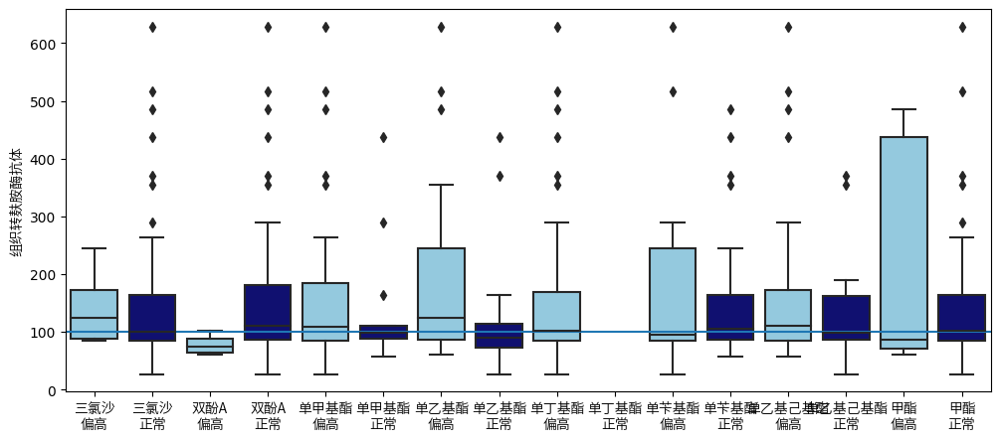

In [262]:
plt.figure(figsize=(12,5))
dfforbox=pd.merge(alldata_pivotf[Hormone+['组织转麸胺酶抗体']].reset_index(),alldata_pivot[['病历号','组织转麸胺酶抗体']],
        on='病历号')
dfforbox2=dfforbox[Hormone+['组织转麸胺酶抗体_y']].melt('组织转麸胺酶抗体_y')
dfforbox2['type']=dfforbox2['检测项目']+'\n'+dfforbox2['value']

orderls=[]
for i in Hormone:
    orderls.extend([i+'\n'+'偏高',i+'\n'+'正常',])
sns.boxplot(data=dfforbox2,
           x='type',y='组织转麸胺酶抗体_y',palette=['skyblue','navy']*6,order=orderls)
plt.xticks(fontproperties=font,)
plt.ylabel('组织转麸胺酶抗体',fontproperties=font,)
plt.xlabel('',fontproperties=font,)
plt.hlines(100,-100,100,)
plt.xlim(-.50,len(Hormone)+.5)

(-0.5, 15.5)

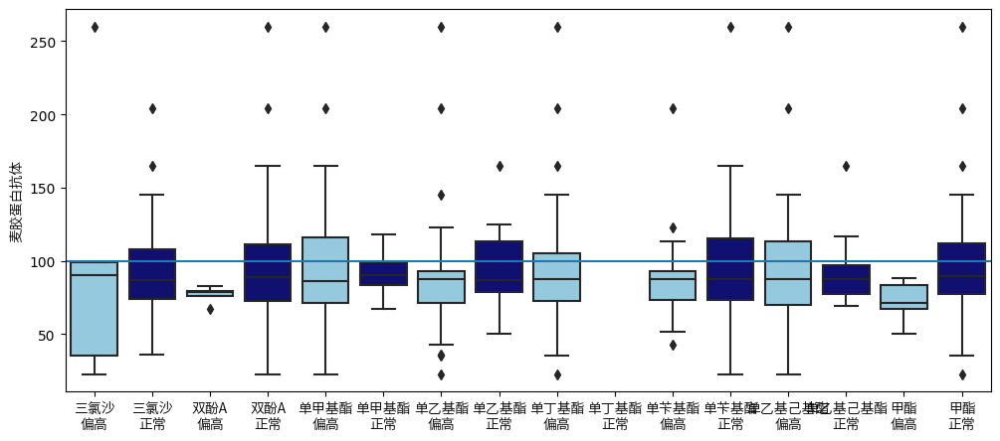

In [261]:
plt.figure(figsize=(12,5))
dfforbox=pd.merge(alldata_pivotf[Hormone+['麦胶蛋白抗体']].reset_index(),alldata_pivot[['病历号','麦胶蛋白抗体']],
        on='病历号')
dfforbox2=dfforbox[Hormone+['麦胶蛋白抗体_y']].melt('麦胶蛋白抗体_y')
dfforbox2['type']=dfforbox2['检测项目']+'\n'+dfforbox2['value']

orderls=[]
for i in Hormone:
    orderls.extend([i+'\n'+'偏高',i+'\n'+'正常',])
sns.boxplot(data=dfforbox2,
           x='type',y='麦胶蛋白抗体_y',palette=['skyblue','navy']*6,order=orderls)
plt.xticks(fontproperties=font,)
plt.ylabel('麦胶蛋白抗体',fontproperties=font,)
plt.xlabel('',fontproperties=font,)
plt.hlines(100,-100,100,)
plt.xlim(-.50,len(Hormone)+.5)

(-0.5, 15.5)

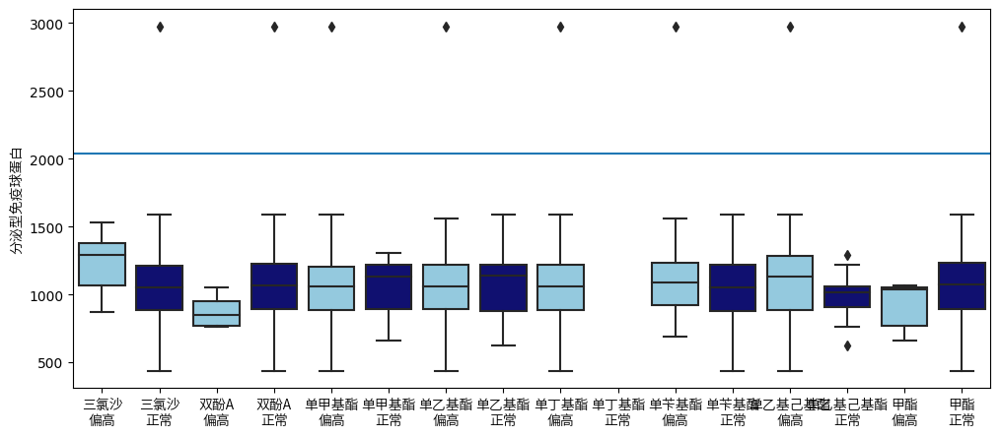

In [259]:
plt.figure(figsize=(12,5))
dfforbox=pd.merge(alldata_pivotf[Hormone+['分泌型免疫球蛋白']].reset_index(),alldata_pivot[['病历号','分泌型免疫球蛋白']],
        on='病历号')
dfforbox2=dfforbox[Hormone+['分泌型免疫球蛋白_y']].melt('分泌型免疫球蛋白_y')
dfforbox2['type']=dfforbox2['检测项目']+'\n'+dfforbox2['value']

orderls=[]
for i in Hormone:
    orderls.extend([i+'\n'+'偏高',i+'\n'+'正常',])
sns.boxplot(data=dfforbox2,
           x='type',y='分泌型免疫球蛋白_y',palette=['skyblue','navy']*6,order=orderls)
plt.xticks(fontproperties=font,)
plt.ylabel('分泌型免疫球蛋白',fontproperties=font,)
plt.xlabel('',fontproperties=font,)
plt.hlines(2040,-100,100,)
plt.xlim(-.50,len(Hormone)+.5)

In [247]:
dfforbox2

,分泌型免疫球蛋白_y,检测项目,value,type
0,1530.0,三氯沙,偏高,三氯沙\n偏高
1,626.0,三氯沙,正常,三氯沙\n正常
2,500.0,三氯沙,正常,三氯沙\n正常
3,1403.0,三氯沙,正常,三氯沙\n正常
4,758.0,三氯沙,正常,三氯沙\n正常
...,...,...,...,...
685,1284.0,丁基苯酯,正常,丁基苯酯\n正常
686,1222.0,丁基苯酯,正常,丁基苯酯\n正常
687,1048.0,丁基苯酯,正常,丁基苯酯\n正常
688,1089.0,丁基苯酯,正常,丁基苯酯\n正常


In [162]:
sns.swarmplot(data=dfforbox[strls111+['分泌型免疫球蛋白_y']].melt('分泌型免疫球蛋白_y'),
           x='检测项目',hue='value',y='分泌型免疫球蛋白_y')
plt.legend(prop=font,ncol=3)
plt.xticks(fontproperties=font,)
plt.ylabel('分泌型免疫球蛋白',fontproperties=font,)
plt.xlabel('',fontproperties=font,)
plt.hlines(2040,-100,100,)
plt.xlim(-.50,len(strls111)-.5)

ValueError: Could not interpret value `检测项目` for parameter `x`

In [ ]:
sns.stripplot(data=dfforbox[strls111+['分泌型免疫球蛋白_y']].melt('分泌型免疫球蛋白_y'),
           x='检测项目',hue='value',y='分泌型免疫球蛋白_y')
plt.legend(prop=font,ncol=3)
plt.xticks(fontproperties=font,)
plt.ylabel('分泌型免疫球蛋白',fontproperties=font,)
plt.xlabel('',fontproperties=font,)
plt.hlines(2040,-100,100,)
plt.xlim(-.50,len(strls111)-.5)

/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:19: RuntimeWarning: invalid value encountered in double_scalars
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:40: UserWarning: Glyph 19977 (\N{CJK UNIFIED IDEOGRAPH-4E09}) missing from current font.
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:40: UserWarning: Glyph 27695 (\N{CJK UNIFIED IDEOGRAPH-6C2F}) missing from current font.
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:40: UserWarning: Glyph 27801 (\N{CJK UNIFIED IDEOGRAPH-6C99}) missing from current font.
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:40: UserWarning: Glyph 20998 (\N{CJK UNIFIED IDEOGRAPH-5206}) missing from current font.
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:40: UserWarning: Glyph

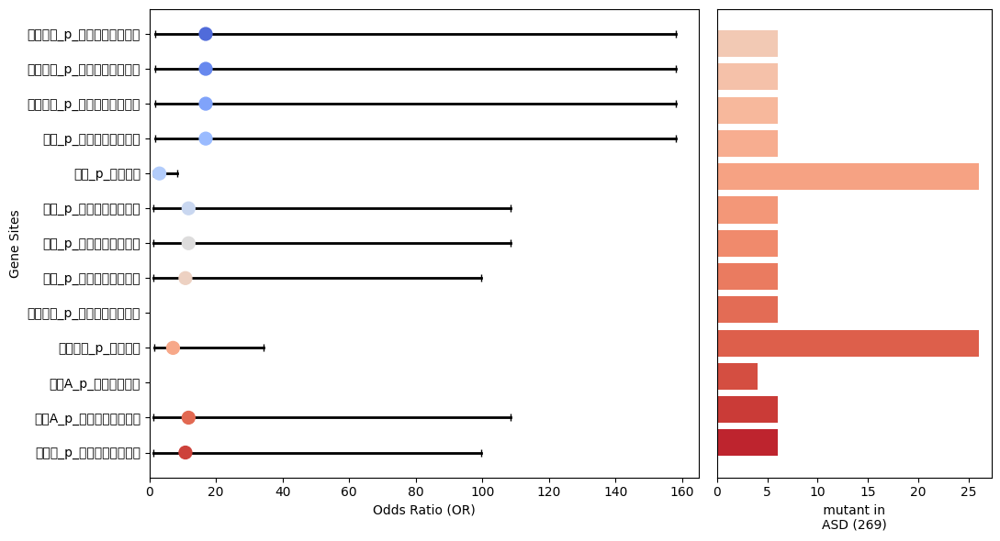

In [213]:
plt.rcParams['font.family'] = 'Arial'
labels = dfr.index 
mut_asd=[dfx4_dict[i]['gut_high'].sum() for i in list(dfr.index) ]
ors = dfr['OR']
ci_low = dfr['lowCI']
ci_high = dfr['highCI']
plt.subplots(1,2,figsize=(11, 6),gridspec_kw={'width_ratios':[2,1]})
plt.subplot(1,2,1)
colors = sns.color_palette('coolwarm', len(ors))[::-1]
plt.scatter(ors, range(len(ors)), c=colors, s=100, zorder=3)

for i in range(len(ors)):
    plt.plot([ci_low[i], ci_high[i]], [i, i], color='black', linewidth=2)
    plt.plot([ors[i], ors[i]], [i-0.1, i+0.1], color='black', linewidth=2)plt.errorbar(ors, range(len(ors)), xerr=[[ors[i]-ci_low[i] for i in range(len(ors))], [ci_high[i]-ors[i] for i in range(len(ors))]], fmt='none', ecolor='black', capsize=3, elinewidth=1)

plt.xlabel('Odds Ratio (OR)')
plt.ylabel('Gene Sites')

plt.xlim(0, 150 * 1.1)

plt.yticks(range(len(ors)), labels)
    
plt.subplot(1,2,2)
for i in range(len(ors)):
    plt.barh(y=i,width=mut_asd[i],color=sns.color_palette('coolwarm',32)[::-1][i])
plt.xlabel(' mutant in \nASD (269)')
plt.yticks([])
plt.tight_layout()
plt.show()

In [164]:
testdf

检测项目,丁基苯酯,胰弹性蛋白酶
病历号,,
ASD_051,正常,偏低
ASD_052,正常,偏低
ASD_053,正常,偏低
ASD_054,正常,正常
ASD_055,正常,正常
...,...,...
TD_085,正常,正常
TD_086,正常,正常
TD_087,正常,正常


In [164]:
alldata_pivot

,Unnamed: 0,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,...,鱿鱼,鲍鱼,鲑鱼,鳕鱼,鳗鱼,鸡肉,鸭肉,麦胶蛋白抗体,麸质,龙眼/桂圆
0,0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,...,47.1,18.2,24.6,31.4,41.3,33.5,32.4,22.8,135.0,17.9
1,1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,...,45.3,34.7,39.2,36.5,40.7,38.0,41.0,165.0,124.0,46.2
2,2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,...,33.4,30.5,23.5,33.0,36.0,33.5,44.6,69.4,285.0,30.0
3,3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,...,49.2,24.7,23.4,31.0,45.0,31.5,42.9,81.8,289.0,39.0
4,4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,...,42.7,34.4,41.6,39.0,39.5,84.4,38.5,82.6,171.0,36.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,64,TD_085,1.04,20.93,3.58,0.55,0.76,3.82,0.48,0.21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,118.0,NaN,NaN
65,65,TD_086,1.42,7.87,1.79,0.26,0.51,4.25,0.31,0.28,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.0,NaN,NaN
66,66,TD_087,4.54,21.94,13.79,0.58,0.92,10.99,0.75,0.31,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78.5,NaN,NaN
67,67,TD_088,1.13,16.98,15.91,0.71,0.86,5.86,0.45,0.24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.8,NaN,NaN


In [168]:
alldata_pivot=alldata_pivot.set_index('病历号').replace('/','0').astype(float)

In [169]:
alldata_pivot=alldata_pivot.reset_index()

In [228]:
alldata_pivot

,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,鱿鱼,鲍鱼,鲑鱼,鳕鱼,鳗鱼,鸡肉,鸭肉,麦胶蛋白抗体,麸质,龙眼/桂圆
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,47.1,18.2,24.6,31.4,41.3,33.5,32.4,22.8,135.0,17.9
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,45.3,34.7,39.2,36.5,40.7,38.0,41.0,165.0,124.0,46.2
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,33.4,30.5,23.5,33.0,36.0,33.5,44.6,69.4,285.0,30.0
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,49.2,24.7,23.4,31.0,45.0,31.5,42.9,81.8,289.0,39.0
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,42.7,34.4,41.6,39.0,39.5,84.4,38.5,82.6,171.0,36.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,TD_085,1.04,20.93,3.58,0.55,0.76,3.82,0.48,0.21,0.98,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,118.0,NaN,NaN
65,TD_086,1.42,7.87,1.79,0.26,0.51,4.25,0.31,0.28,0.93,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,101.0,NaN,NaN
66,TD_087,4.54,21.94,13.79,0.58,0.92,10.99,0.75,0.31,1.15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,78.5,NaN,NaN
67,TD_088,1.13,16.98,15.91,0.71,0.86,5.86,0.45,0.24,0.98,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,92.8,NaN,NaN


In [11]:
alldata_pivot=pd.read_csv('zhibiao69_pivot.csv',index_col=0)

In [8]:
gut=[
'麦胶蛋白抗体'
,'组织转麸胺酶抗体'
,'分泌型免疫球蛋白'
,'钙卫蛋白'
,'解连蛋白'
,'葡萄糖醛酸酶'
,'胰弹性蛋白酶']

gut_english = ['Anti-gliadin antibodies', 'Anti-tissue transglutaminase antibodies', 
       'Secretory immunoglobulin', 'Calprotectin', 'Zonulin', 
       'Glucuronidase', 'Elastase']

organic_acid=['尿肌酐-1073'
,'46. 阿拉伯糖醇'
,'45. 酒石酸'
,'44. 柠苹酸'
,'43. 丙三羧酸'
,'42. 二羟基苯丙酸'
,'41. 吲哚乙酸'
,'40. 4-羟基苯乙酸'
,'39. 4-羟基苯甲酸'
,'38. 苯丙酸'
,'37. 苯乙酸'
,'36. 马尿酸'
,'35. 苯甲酸'
,'34. 乳清酸'
,'33. 焦谷氨酸'
,'32. α-羟丁酸'
,'31. 葡萄糖二酸'
,'30. 苯基乙醛酸'
,'29. 杏仁酸'
,'28. 2-甲基马尿酸'
,'1. 己二酸'
,'2. 辛二酸'
,'3. 乙基丙二酸'
,'4. 丙酮酸'
,'5. 乳酸'
,'6. β-羟基丁酸'
,'7. 柠檬酸'
,'8. 顺式乌头酸'
,'9. 异柠檬酸'
,'10. α-酮戊二酸'
,'11. 琥珀酸'
,'12. 富马酸'
,'13. 苹果酸'
,'14. 羟甲基戊二酸'
,'15. α-酮异戊酸'
,'16. α-酮异己酸'
,'17. α-酮-β-甲基戊酸'
,'18. 黄尿酸'
,'19. β-羟基异戊酸'
,'20. 甲基丙二酸'
,'22. 高香草酸'
,'23. 香草基扁桃酸'
,'24. 5-羟吲哚乙酸'
,'25. 犬尿喹啉酸'
,'26. 吡啶甲酸'
,'27. 喹啉酸'
,'21. 亚胺甲基谷氨酸'
]

organic_acid_english = ['Urinary creatinine', 'Arabitol', 'Tartaric acid', 'Citric acid',
                 'Tricarboxylic acid', 'Dihydroxyphenylacetic acid', 'Indole-3-acetic acid',
                 '4-Hydroxyphenylacetic acid', '4-Hydroxybenzoic acid', 'Phenylpropanoic acid',
                 'Phenylacetic acid', 'Hippuric acid', 'Benzoic acid', 'Lactic acid',
                 'Fumaric acid', 'α-Hydroxybutyric acid', 'Glucaric acid',
                 'Phenylacetaldehyde acid', 'Mandelic acid', '2-Methylhippuric acid',
                 'Hexanedioic acid', 'Octanedioic acid', 'Ethylmalonic acid',
                 'Pyruvic acid', 'Lactic acid', 'β-Hydroxybutyric acid',
                 'Citric acid', 'Cis-aconitic acid', 'Isocitric acid',
                 'α-Ketoglutaric acid', 'Succinic acid', 'Fumaric acid',
                 'Malic acid', 'Hydroxymethyl glutaric acid',
                 'α-Ketoisovaleric acid', 'α-Ketoisocaproic acid',
                 'α-Keto-β-methylvaleric acid', 'Uric acid',
                 'β-Hydroxyisovaleric acid', 'Methylmalonic acid',
                 'Vanillic acid', 'Vanilloylmandelic acid',
                 '5-Hydroxyindole-3-acetic acid', 'Kynurenic acid',
                 'Pyridinecarboxylic acid', 'Quinolinic acid',
                 'Imidazole methyl glutamic acid']

cytokine=['干扰素α'
,'肿瘤坏死因子'
,'干扰素γ'
,'白介素12'
,'白介素1β'
,'白介素17'
,'白介素10'
,'白介素8'
,'白介素6'
,'白介素5'
,'白介素4'
,'白介素2'
]

cytokine_english = [
    'IFN-α', 'TNF', 'IFN-γ',
    'IL-12', 'IL-1β', 'IL-17',
    'IL-10', 'IL-8', 'IL-6',
    'IL-5', 'IL-4', 'IL-2'
]

oxidative=[
'8-羟基脱氧鸟苷'
,'丙二醛'
,'谷胱甘肽'
,'含硫化合物'
,'谷胱甘肽硫转移酶'
,'谷胱甘肽过氧化物酶'
,'超氧化物歧化酶'
,'尿肌酐-1131'
,'花生四烯酸过氧化物'
,'硝化酪氨酸']


oxidative_english = [
    '8-hydroxy-2\'-deoxyguanosine (8-OHdG)', 
    'Malondialdehyde (MDA)', 
    'Glutathione (GSH)', 
    'Sulfur-containing compounds', 
    'Glutathione S-transferase (GST)', 
    'Glutathione peroxidase (GPx)', 
    'Superoxide dismutase (SOD)', 
    'Urine creatinine',  
    'Arachidonic acid peroxide', 
    '3-Nitrotyrosine'  
]

Hormone=[
'三氯沙'
,'双酚A'
,'单甲基酯'
,'单乙基酯'
,'单丁基酯'
,'单苄基酯'
,'单乙基己基酯'
,'甲酯'
,'乙酯'
,'丙酯'
,'丁酯'
,'壬基苯酯'
,'辛基苯酯'
,'丁基苯酯'
,'尿肌酐-1055'
]

Hormone_english = ['Triclosan', 'Bisphenol A', 'Monomethyl ester', 'Monoethyl ester', 'Monobutyl ester', 'Monobenzyl ester', 
            'Monooctyl ester', 'Methyl ester', 'Ethyl ester', 'Propyl ester', 'Butyl ester', 
            'Nonylphenol ester', 'Octylphenol ester', 'Butylphenol ester', 'Urinary creatinine']

foodallergy=['牛奶'
,'玉米'
,'虾'
,'鳕鱼'
,'猪肉'
,'羊肉'
,'鸡肉'
,'牛肉'
,'蛋黄'
,'蛋白'
,'羊奶'
,'芒果'
,'香蕉'
,'苹果'
,'番茄'
,'土豆'
,'韭菜'
,'芹菜'
,'花生'
,'大豆/毛豆'
,'小麦'
,'鳗鱼'
,'鱿鱼'
,'蛤'
,'蟹'
,'鲍鱼'
,'鸭肉'
,'酸奶'
,'巧达芝士'
,'菠萝'
,'薏仁'
,'燕麦'
,'米'
,'麸质'
,'荞麦'
,'金枪鱼'
,'鱼翅'
,'鲑鱼'
,'牡蛎'
,'海带'
,'生姜'
,'大蒜'
,'辣椒'
,'可可豆'
,'芝麻'
,'核桃'
,'杏仁'
,'葵花籽'
,'绿豆'
,'花豆'
,'包心菜'
,'绿花椰菜'
,'竹笋'
,'芦笋'
,'茶'
,'咖啡'
,'香草'
,'蜂蜜'
,'酵母'
,'胡椒'
,'菠菜'
,'青椒/彩椒'
,'豌豆'
,'洋葱'
,'莴苣'
,'青葱'
,'茄子'
,'小黄瓜'
,'白花椰菜'
,'胡萝卜'
,'龙眼/桂圆'
,'柠檬'
,'奇异果'
,'番石榴'
,'葡萄柚'
,'葡萄'
,'蘑菇'
,'芋头'
,'地瓜'
,'四季豆'
,'酪梨'
,'椰子'
,'西瓜'
,'草莓'
,'樱桃'
,'梨子'
,'桃子'
,'木瓜'
,'柑橘类'
,'橄榄'
,'免疫球蛋白E'
            ]

foodallergy_english= ['Milk', 'Corn', 'Shrimp', 'Cod', 'Pork', 'Lamb', 'Chicken', 'Beef', 'Egg yolk', 'Egg white', 
                'Sheep milk', 'Mango', 'Banana', 'Apple', 'Tomato', 'Potato', 'Garlic chives', 
                'Celery', 'Peanut', 'Soybean/Edamame', 'Wheat', 'Eel', 'Squid', 'Clam', 'Crab', 
                'Abalone', 'Duck', 'Yogurt', 'Cheddar cheese', 'Pineapple', 'Coixseed', 
                'Oats', 'Rice', 'Gluten', 'Buckwheat', 'Tuna', 'Shark fin', 'Salmon', 'Oyster', 
                'Kelp', 'Ginger', 'Garlic', 'Chili', 'Cocoa bean', 'Sesame', 'Walnut', 
                'Almond', 'Sunflower seed', 'Mung bean', 'Scarlet runner bean', 'Cabbage', 
                'Broccoli', 'Bamboo shoots', 'Asparagus', 'Tea', 'Coffee', 'Vanilla', 
                'Honey', 'Yeast', 'Pepper', 'Spinach', 'Bell pepper', 'Pea', 'Onion', 
                'Lettuce', 'Green onion', 'Eggplant', 'Cucumber', 'Cauliflower', 'Carrot', 
                'Longan', 'Lemon', 'Kiwi', 'Guava', 'Grapefruit', 'Grape', 'Mushroom', 
                'Taro', 'Sweet potato', 'Green bean', 'Avocado', 'Coconut', 'Watermelon', 
                'Strawberry', 'Cherry', 'Pear', 'Peach', 'Papaya', 'Citrus fruits', 
                'Olive', 'Immunoglobulin E']

VD=['维生素D'
,'维生素D3'
,'维生素D2']

VD_english=['Vitamin D', 'Vitamin D3', 'Vitamin D2']


eng_chi_dict=dict(zip(gut+organic_acid+cytokine+oxidative+foodallergy+VD+Hormone
,gut_english+organic_acid_english+cytokine_english+oxidative_english+foodallergy_english+VD_english+Hormone_english))

In [9]:
chi_eng_dict=dict(zip(gut_english+organic_acid_english+cytokine_english+oxidative_english+foodallergy_english+VD_english+Hormone_english
                      ,gut+organic_acid+cytokine+oxidative+foodallergy+VD+Hormone
,))

In [10]:
chi_eng_dict['Zonulin']

'解连蛋白'

In [175]:
Hormone

['三氯沙',
 '双酚A',
 '单甲基酯',
 '单乙基酯',
 '单丁基酯',
 '单苄基酯',
 '单乙基己基酯',
 '甲酯',
 '乙酯',
 '丙酯',
 '丁酯',
 '壬基苯酯',
 '辛基苯酯',
 '丁基苯酯',
 '尿肌酐-1055']

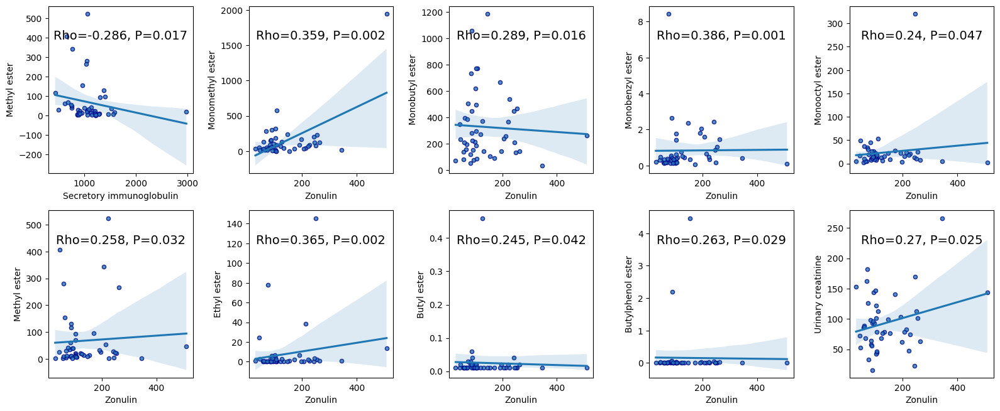

In [176]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns=Hormone
metabolites = gut
plt.figure(figsize=(16, 16))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(0),alldata_pivot[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(5,5,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=alldata_pivot,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])

            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

In [12]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns=Hormone
metabolites = gut
plt.figure(figsize=(26, 26))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(alldata_pivot[metabolite]),
                            alldata_pivot[ados_col]  .fillna(alldata_pivot[ados_col]))
        if p < 0.05:
            
            plt.subplot(6,10,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=alldata_pivot,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])

            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

NameError: name 'alldata_pivot' is not defined

<Figure size 2600x2600 with 0 Axes>

麦胶蛋白抗体 乙酯
组织转麸胺酶抗体 辛基苯酯
钙卫蛋白 单乙基酯
解连蛋白 三氯沙
解连蛋白 单乙基酯
解连蛋白 壬基苯酯
解连蛋白 辛基苯酯


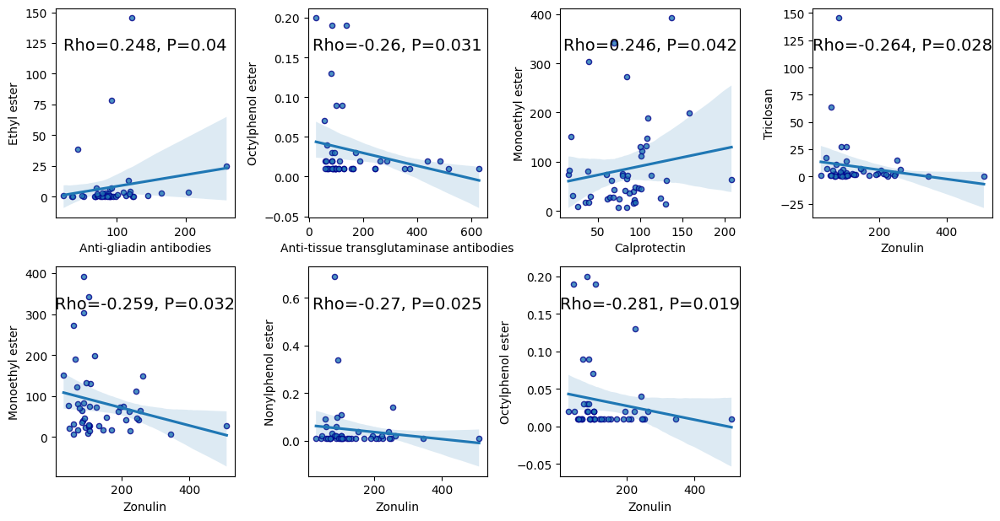

In [34]:
plt.figure(figsize=(12, 12))

count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(alldata_pivot[metabolite].mean()),
                            alldata_pivot[ados_col]  .fillna(alldata_pivot[ados_col].mean()))
        if p < 0.05:
            print(metabolite,ados_col)
            plt.subplot(4,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=alldata_pivot,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])

            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats

plt.figure(figsize=(12, 12))

count = 1
for j, metabolite in enumerate(metabolites):
    for i, ados_col in enumerate(ados_columns):
        r, p = stats.spearmanr(alldata_pivot[metabolite].fillna(alldata_pivot[metabolite].mean()),
                               alldata_pivot[ados_col].fillna(alldata_pivot[ados_col].mean()))
        if p < 0.05:
            print(metabolite, ados_col)
            plt.subplot(4, 4, count)
            count += 1

            sns.regplot(
                x=metabolite, 
                y=ados_col, 
                data=alldata_pivot,
                scatter_kws={'s': 20, 'edgecolor': '                line_kws={'color': '                ci=95,                scatter=True,                lowess=False,                truncate=True,                x_jitter=None,                y_jitter=None,                label=None,                color='                marker='o',                fit_reg=True,            )
            sns.despine()
            plt.xlabel(eng_chi_dict[metabolite])
            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=12, transform=plt.gca().transAxes, ha='center')

plt.tight_layout()
plt.show()

NameError: name 'metabolites' is not defined

<Figure size 1200x1200 with 0 Axes>

In [29]:
r

nan

In [26]:
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(0),
                            alldata_pivot[ados_col]  .fillna(0))
        if p < 0.05:
            print(ados_col,metabolite)

甲酯 分泌型免疫球蛋白
单甲基酯 解连蛋白
单丁基酯 解连蛋白
单苄基酯 解连蛋白
单乙基己基酯 解连蛋白
甲酯 解连蛋白
乙酯 解连蛋白
丁酯 解连蛋白
丁基苯酯 解连蛋白
尿肌酐-1055 解连蛋白


In [28]:
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot.dropna(subset=[metabolite])[metabolite],
                            alldata_pivot.dropna(subset=[metabolite])[ados_col]    )
        if p < 0.05:
            print(ados_col,metabolite)

In [20]:
r,p

(nan, nan)

Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Urinary creatinine
Tartaric acid
Tricarboxylic acid
Tricarboxylic acid
4-Hydroxyphenylacetic acid
4-Hydroxyphenylacetic acid
4-Hydroxyphenylacetic acid
4-Hydroxyphenylacetic acid
4-Hydroxyphenylacetic acid
Phenylpropanoic acid
Phenylpropanoic acid
Hippuric acid
Benzoic acid
Benzoic acid
Fumaric acid
Fumaric acid
Glucaric acid
Phenylacetaldehyde acid
Phenylacetaldehyde acid
Mandelic acid
Mandelic acid
Mandelic acid
Hexanedioic acid
Hexanedioic acid
Hexanedioic acid
Hexanedioic acid
Octanedioic acid
Ethylmalonic acid
β-Hydroxybutyric acid
β-Hydroxybutyric acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconitic acid
Cis-aconiti

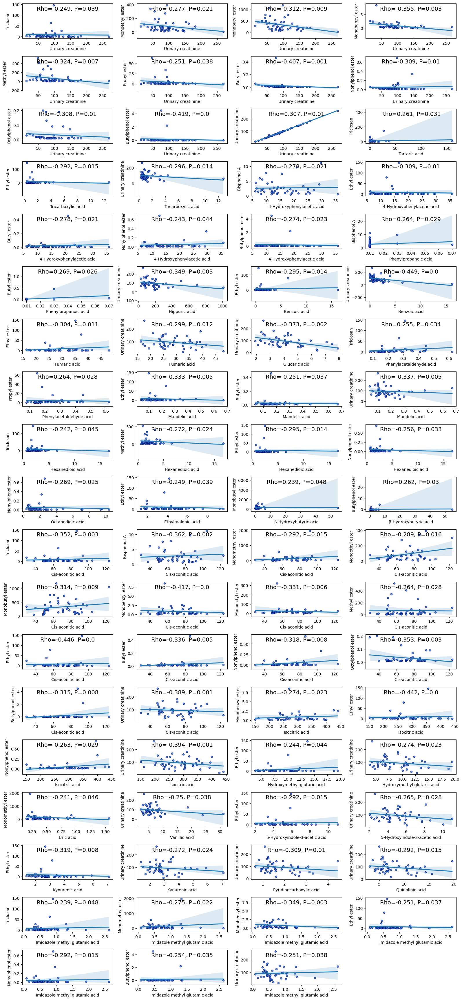

In [177]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns=Hormone
metabolites = organic_acid
plt.figure(figsize=(16, 36))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(0),alldata_pivot[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(20,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=alldata_pivot,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])

            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

In [178]:
heatdf=alldata_pivot[organic_acid+Hormone]

In [179]:
heatdf.head()

,尿肌酐-1073,46. 阿拉伯糖醇,45. 酒石酸,44. 柠苹酸,43. 丙三羧酸,42. 二羟基苯丙酸,41. 吲哚乙酸,40. 4-羟基苯乙酸,39. 4-羟基苯甲酸,38. 苯丙酸,...,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
0,97.64,68.75,27.05,3.91,1.15,0.37,0.77,12.65,0.42,0.01,...,0.12,45.28,35.22,0.59,6.55,0.03,0.69,0.03,0.01,97.93
1,58.14,50.98,0.08,5.71,12.73,0.19,1.06,6.52,0.26,0.01,...,0.49,9.73,61.30,3.14,2.63,0.02,0.02,0.02,0.02,57.95
2,181.60,69.64,0.23,3.56,0.82,0.02,2.76,15.33,0.69,0.01,...,0.32,34.00,30.03,0.16,0.73,0.01,0.01,0.01,0.01,182.16
3,142.60,95.00,9.86,1.87,0.59,0.16,0.73,9.19,0.33,0.01,...,0.06,27.94,95.90,2.32,0.08,0.01,0.01,0.01,0.01,140.85
4,145.00,398.50,5.73,2.84,1.33,0.07,1.50,29.59,0.64,0.01,...,0.17,26.12,38.72,0.35,2.94,0.01,0.34,0.01,0.01,144.06


In [180]:
plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize=(2.5,18))
heatdf=result[organic_acid+Hormone]\
.replace('/', 0).astype(float).corr(method='spearman')
sns.heatmap(heatdf.iloc[:-4,-4:]
           ,cmap='coolwarm',center=0,vmax=1,lw=0.6)

plt.xticks([i+.5 for i in range(4)],
           ['Communication','social_interaction','stereotyped_behavior','ASD_total'])

plt.yticks([i+.5 for i in range(len(organic_acid_english))],
           organic_acid_english)

plt.show()

TypeError: unhashable type: 'list'

<Figure size 250x1800 with 0 Axes>

In [181]:
allheatdf=pd.DataFrame()
for i in gut+organic_acid+cytokine+oxidative+foodallergy+VD:
    for j in Hormone:
        r,p=stats.spearmanr(alldata_pivot[i].fillna(np.mean(alldata_pivot[i])),
                            alldata_pivot[j].fillna(np.mean(alldata_pivot[j])))
        if p<0.05:
            allheatdf.loc[i,j]=r
allheatdf

,乙酯,辛基苯酯,单乙基酯,三氯沙,壬基苯酯,单丁基酯,单苄基酯,尿肌酐-1055,双酚A,单乙基己基酯,单甲基酯,丙酯,丁酯,丁基苯酯,甲酯
麦胶蛋白抗体,0.248388,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
组织转麸胺酶抗体,NaN,-0.259946,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
钙卫蛋白,NaN,NaN,0.245881,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
解连蛋白,NaN,-0.281370,-0.259169,-0.26442,-0.270344,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
尿肌酐-1073,NaN,NaN,NaN,NaN,NaN,-0.279959,-0.243329,0.777143,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
柑橘类,NaN,-0.256485,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
免疫球蛋白E,NaN,NaN,NaN,NaN,0.335293,NaN,0.257401,NaN,NaN,NaN,NaN,NaN,NaN,0.277949,NaN
维生素D,NaN,0.311759,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.320911,NaN,NaN
维生素D3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.268162,NaN,NaN


In [14]:
allheatdf2=pd.DataFrame()
for i in gut+organic_acid+cytokine+oxidative+foodallergy+VD:
    for j in Hormone:
        r,p=stats.spearmanr(alldata_pivot[i].fillna(np.mean(alldata_pivot[i])),
                            alldata_pivot[j].fillna(np.mean(alldata_pivot[j])))
        if p<2:
            allheatdf2.loc[i,j]=r
allheatdf2

,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
麦胶蛋白抗体,0.001365,0.063359,0.128602,-0.008868,0.131424,0.039628,-0.049819,-0.122751,0.248388,-0.023670,-0.051512,-0.070029,0.036815,0.021549,0.143422
组织转麸胺酶抗体,-0.010317,-0.147079,0.068004,0.092733,0.013577,-0.098029,0.020021,-0.041900,0.009881,0.054827,-0.148913,-0.101000,-0.259946,-0.170844,0.122746
分泌型免疫球蛋白,0.232766,-0.032130,0.110578,-0.036271,0.016993,0.109086,0.136076,-0.090018,0.167161,0.130303,0.146582,0.192212,0.187933,0.127819,0.177659
钙卫蛋白,0.152153,0.010291,0.199937,0.245881,0.184230,0.116927,0.065366,-0.025485,0.131851,0.191608,0.140511,0.051886,0.124747,0.189987,-0.090722
解连蛋白,-0.264420,-0.099036,0.045000,-0.259169,-0.005219,0.135711,-0.187426,-0.135128,-0.055280,-0.236813,-0.218895,-0.270344,-0.281370,-0.229356,0.023419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
橄榄,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181
免疫球蛋白E,0.072518,0.066236,-0.018195,0.039262,0.035682,0.257401,-0.064274,0.094986,0.039012,0.193418,0.202963,0.335293,0.142546,0.277949,0.022185
维生素D,0.222153,0.068495,-0.070569,0.085937,-0.011811,0.184128,0.159105,0.006612,-0.035263,0.068176,0.320911,0.198949,0.311759,0.201230,-0.174404
维生素D3,0.138733,0.166561,0.094008,0.041771,0.114778,0.100574,0.081102,0.048748,0.078619,0.072918,0.268162,0.128034,0.169618,0.131986,-0.133110


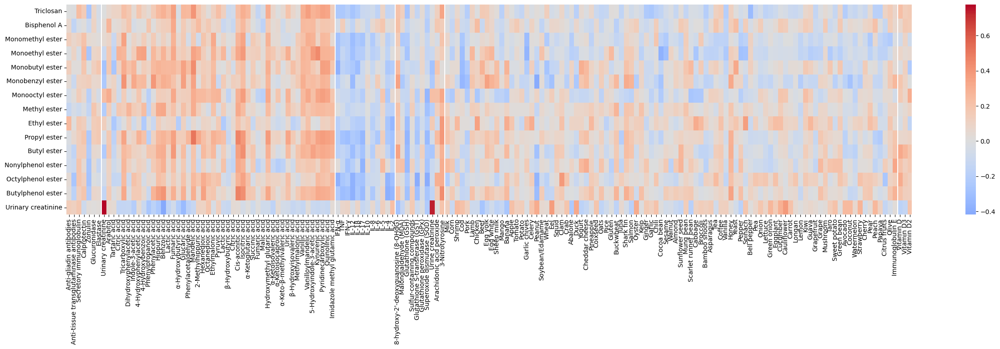

In [184]:
plt.figure(figsize=(30,6))
sns.heatmap(allheatdf2.T,cmap='coolwarm',center=0,)

plt.xticks([i+0.5 for i in range(len(allheatdf2.T.columns))],
           [eng_chi_dict[i] for i in allheatdf2.T.columns])
plt.yticks([i+0.5 for i in range(len(allheatdf2.T.index))],
           [eng_chi_dict[i] for i in allheatdf2.T.index])
lenth=0
for xiangmu in  [gut,organic_acid,cytokine,oxidative,foodallergy,VD]:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')
plt.show()

In [185]:
Mitochondrion_acids = [
    "己二酸",
    "辛二酸",
    "癸二酸",
    "乙基丙二酸",
    "甲基琥珀酸",
    "丙酮酸",
    "乳酸",
    "β-羟基丁酸",
    "柠檬酸",
    "顺式乌头酸",
    "异柠檬酸",
    "α-酮戊二酸",
    "琥珀酸",
    "富马酸",
    "苹果酸",
    "草酰乙酸",
    "羟甲基戊二酸"
]

In [186]:
allheatdf2

,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
麦胶蛋白抗体,0.001365,0.063359,0.128602,-0.008868,0.131424,0.039628,-0.049819,-0.122751,0.248388,-0.023670,-0.051512,-0.070029,0.036815,0.021549,0.143422
组织转麸胺酶抗体,-0.010317,-0.147079,0.068004,0.092733,0.013577,-0.098029,0.020021,-0.041900,0.009881,0.054827,-0.148913,-0.101000,-0.259946,-0.170844,0.122746
分泌型免疫球蛋白,0.232766,-0.032130,0.110578,-0.036271,0.016993,0.109086,0.136076,-0.090018,0.167161,0.130303,0.146582,0.192212,0.187933,0.127819,0.177659
钙卫蛋白,0.152153,0.010291,0.199937,0.245881,0.184230,0.116927,0.065366,-0.025485,0.131851,0.191608,0.140511,0.051886,0.124747,0.189987,-0.090722
解连蛋白,-0.264420,-0.099036,0.045000,-0.259169,-0.005219,0.135711,-0.187426,-0.135128,-0.055280,-0.236813,-0.218895,-0.270344,-0.281370,-0.229356,0.023419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
橄榄,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181
免疫球蛋白E,0.072518,0.066236,-0.018195,0.039262,0.035682,0.257401,-0.064274,0.094986,0.039012,0.193418,0.202963,0.335293,0.142546,0.277949,0.022185
维生素D,0.222153,0.068495,-0.070569,0.085937,-0.011811,0.184128,0.159105,0.006612,-0.035263,0.068176,0.320911,0.198949,0.311759,0.201230,-0.174404
维生素D3,0.138733,0.166561,0.094008,0.041771,0.114778,0.100574,0.081102,0.048748,0.078619,0.072918,0.268162,0.128034,0.169618,0.131986,-0.133110


In [187]:
strls=[]
for i in Mitochondrion_acids:
    strls.extend([j for j in  allheatdf2.T.columns if i in j])

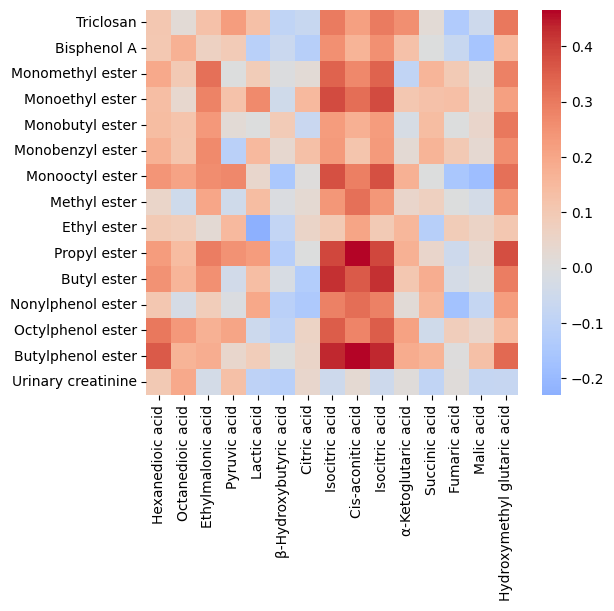

In [253]:
strls1=[]
for i in Mitochondrion_acids:
    strls1.extend([j for j in  allheatdf2.T.columns if i in j])

plt.figure(figsize=(6,5))
plot=allheatdf2.T[strls1]
sns.heatmap(plot,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plot.index))],
           [eng_chi_dict[i] for i in plot.index],rotation=0)
    
plt.xticks([i+0.5 for i in range(len(plot.columns))],
           [eng_chi_dict[i] for i in plot.columns],rotation=90)
lenth=0
'''for xiangmu in  oxidative:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')'''
plt.show()

In [255]:
plot.columns

Index(['1. 己二酸', '2. 辛二酸', '3. 乙基丙二酸', '4. 丙酮酸', '5. 乳酸', '6. β-羟基丁酸',
       '7. 柠檬酸', '9. 异柠檬酸', '8. 顺式乌头酸', '9. 异柠檬酸', '10. α-酮戊二酸', '11. 琥珀酸',
       '12. 富马酸', '13. 苹果酸', '14. 羟甲基戊二酸'],
      dtype='object')

In [254]:
[eng_chi_dict[i] for i in plot.columns]

['Hexanedioic acid',
 'Octanedioic acid',
 'Ethylmalonic acid',
 'Pyruvic acid',
 'Lactic acid',
 'β-Hydroxybutyric acid',
 'Citric acid',
 'Isocitric acid',
 'Cis-aconitic acid',
 'Isocitric acid',
 'α-Ketoglutaric acid',
 'Succinic acid',
 'Fumaric acid',
 'Malic acid',
 'Hydroxymethyl glutaric acid']

In [190]:
nerve_acids= [
    "高香草酸",
    "香草基扁桃酸", 
    "3-甲氧基-4-羟基苯乙二醇",
    "5-羟吲哚乙酸",
    "犬尿喹啉酸",
    "吡啶甲酸",
    "喹啉酸",
    "N-乙酰天冬氨酸"
]

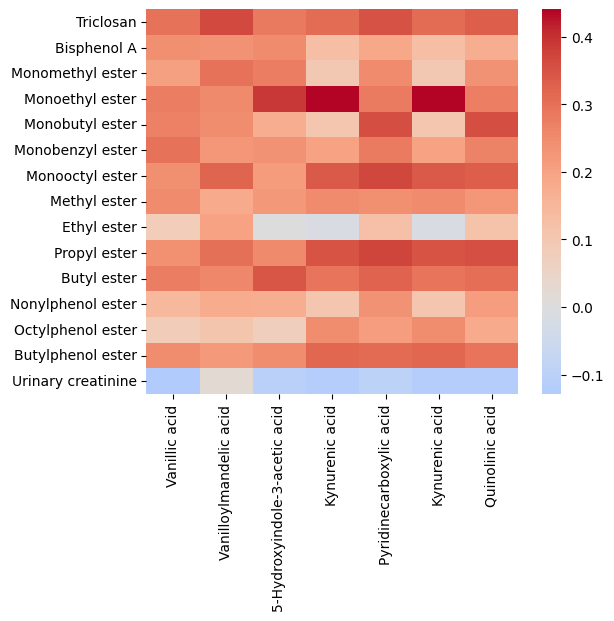

In [261]:
strls2=[]
for i in nerve_acids:
    strls2.extend([j for j in  allheatdf2.T.columns if i in j])

plt.figure(figsize=(6,5))
plot=allheatdf2.T[strls2]
sns.heatmap(plot,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plot.index))],
           [eng_chi_dict[i] for i in plot.index],rotation=0)
    
plt.xticks([i+0.5 for i in range(len(plot.columns))],
           [eng_chi_dict[i] for i in plot.columns],rotation=90)
lenth=0
'''for xiangmu in  oxidative:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')'''
plt.show()

In [262]:
plot.columns

Index(['22. 高香草酸', '23. 香草基扁桃酸', '24. 5-羟吲哚乙酸', '25. 犬尿喹啉酸', '26. 吡啶甲酸',
       '25. 犬尿喹啉酸', '27. 喹啉酸'],
      dtype='object')

In [263]:
liver_acid = [
    "2-甲基马尿酸",
    "杏仁酸",
    "苯基乙醛酸",
    "反,反-粘糠酸",
    "葡萄糖二酸",
    "巯基尿酸",
    "a-羟丁酸",
    "焦谷氨酸"
]

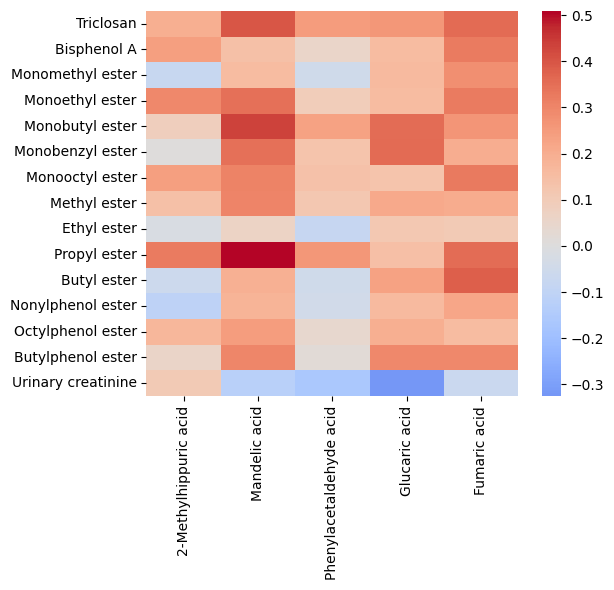

In [264]:
strls3=[]
for i in liver_acid:
    strls3.extend([j for j in  allheatdf2.T.columns if i in j])

plt.figure(figsize=(6,5))
plot=allheatdf2.T[strls3]
sns.heatmap(plot,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plot.index))],
           [eng_chi_dict[i] for i in plot.index],rotation=0)
    
plt.xticks([i+0.5 for i in range(len(plot.columns))],
           [eng_chi_dict[i] for i in plot.columns],rotation=90)
lenth=0
'''for xiangmu in  oxidative:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')'''
plt.show()

In [260]:
plot.columns


Index(['28. 2-甲基马尿酸', '29. 杏仁酸', '30. 苯基乙醛酸', '31. 葡萄糖二酸', '33. 焦谷氨酸'], dtype='object')

In [265]:
gut_acids = [
    "苯甲酸",
    "马尿酸", 
    "苯乙酸",
    "苯丙酸",
    "4-羟基苯甲酸",
    "4-羟基苯乙酸",
    "吲哚乙酸",
    "二羟基苯丙酸",
    "对甲酚",
    "丙三羧酸"
]

/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/seaborn/utils.py:80: UserWarning: Glyph 32679 (\N{CJK UNIFIED IDEOGRAPH-7FA7}) missing from current font.
  fig.canvas.draw()


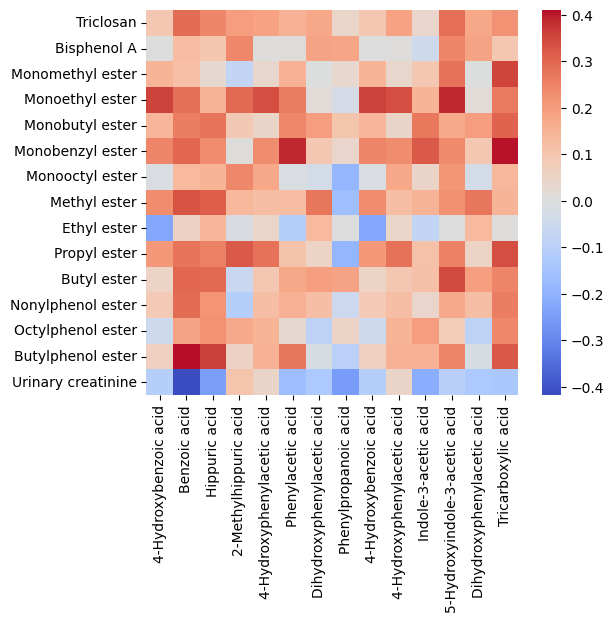

In [266]:
strls4=[]
for i in gut_acids:
    strls4.extend([j for j in  allheatdf2.T.columns if i in j])

plt.figure(figsize=(6,5))
plot=allheatdf2.T[strls4]
sns.heatmap(plot,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plot.index))],
           [eng_chi_dict[i] for i in plot.index],rotation=0)
    
plt.xticks([i+0.5 for i in range(len(plot.columns))],
           [eng_chi_dict[i] for i in plot.columns],rotation=90)
lenth=0
'''for xiangmu in  oxidative:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')'''
plt.show()

In [268]:
plot.columns

Index(['39. 4-羟基苯甲酸', '35. 苯甲酸', '36. 马尿酸', '28. 2-甲基马尿酸', '40. 4-羟基苯乙酸',
       '37. 苯乙酸', '42. 二羟基苯丙酸', '38. 苯丙酸', '39. 4-羟基苯甲酸', '40. 4-羟基苯乙酸',
       '41. 吲哚乙酸', '24. 5-羟吲哚乙酸', '42. 二羟基苯丙酸', '43. 丙三羧酸'],
      dtype='object')

In [269]:
yeast_acids=['柠苹酸',
 '酒石酸',
'阿拉伯糖醇']

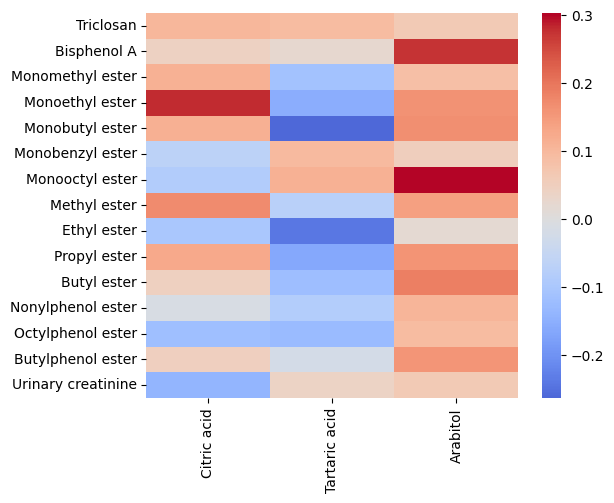

In [271]:
strls5=[]
for i in yeast_acids:
    strls5.extend([j for j in  allheatdf2.T.columns if i in j])

plt.figure(figsize=(6,5))
plot=allheatdf2.T[strls5]
sns.heatmap(plot,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plot.index))],
           [eng_chi_dict[i] for i in plot.index],rotation=0)
    
plt.xticks([i+0.5 for i in range(len(plot.columns))],
           [eng_chi_dict[i] for i in plot.columns],rotation=90)
lenth=0
'''for xiangmu in  oxidative:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')'''
plt.show()

/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/seaborn/utils.py:80: UserWarning: Glyph 40614 (\N{CJK UNIFIED IDEOGRAPH-9EA6}) missing from current font.
  fig.canvas.draw()
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/seaborn/utils.py:80: UserWarning: Glyph 33014 (\N{CJK UNIFIED IDEOGRAPH-80F6}) missing from current font.
  fig.canvas.draw()
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/seaborn/utils.py:80: UserWarning: Glyph 34507 (\N{CJK UNIFIED IDEOGRAPH-86CB}) missing from current font.
  fig.canvas.draw()
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/seaborn/utils.py:80: UserWarning: Glyph 30333 (\N{CJK UNIFIED IDEOGRAPH-767D}) missing from current font.
  fig.canvas.draw()
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/seaborn/utils.py:80: UserWarning: Glyph 25239 (\N{CJK UNIFIED IDEOGRAPH-6297}) missing from current font.
  fig.canvas.draw()
/home2/zhenglij

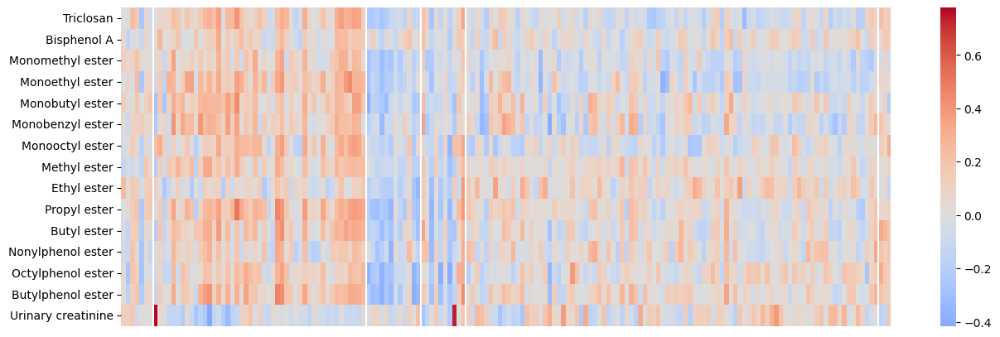

In [199]:
plt.figure(figsize=(15,5))
sns.heatmap(allheatdf2.T,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(allheatdf2.T.index))],
           [eng_chi_dict[i] for i in allheatdf2.T.index],rotation=0)
lenth=0
for xiangmu in  [gut,organic_acid,cytokine,oxidative,foodallergy,VD]:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')
plt.show()

In [200]:
allheatdf2.T[gut+strls1+strls2+strls3+strls4+strls5+cytokine+oxidative+foodallergy+VD]

,麦胶蛋白抗体,组织转麸胺酶抗体,分泌型免疫球蛋白,钙卫蛋白,解连蛋白,葡萄糖醛酸酶,胰弹性蛋白酶,1. 己二酸,2. 辛二酸,3. 乙基丙二酸,...,樱桃,梨子,桃子,木瓜,柑橘类,橄榄,免疫球蛋白E,维生素D,维生素D3,维生素D2
三氯沙,0.001365,-0.010317,0.232766,0.152153,-0.264420,0.084457,-0.050372,0.105240,0.020717,0.125811,...,-0.110070,0.039092,-0.188482,-0.189853,0.096755,0.156062,0.072518,0.222153,0.138733,0.161369
双酚A,0.063359,-0.147079,-0.032130,0.010291,-0.099036,0.099630,-0.037630,0.103429,0.169831,0.067623,...,0.078070,0.109468,0.211454,0.004264,-0.117720,0.143065,0.066236,0.068495,0.166561,0.147299
单甲基酯,0.128602,0.068004,0.110578,0.199937,0.045000,0.032826,0.014422,0.192165,0.099405,0.318926,...,-0.089743,-0.233640,0.062747,-0.138629,-0.190293,-0.224611,-0.018195,-0.070569,0.094008,-0.085672
单乙基酯,-0.008868,0.092733,-0.036271,0.245881,-0.259169,0.083749,0.100176,0.136801,0.039121,0.279549,...,-0.048747,-0.171278,-0.074694,-0.165737,-0.167126,-0.085434,0.039262,0.085937,0.041771,0.062093
单丁基酯,0.131424,0.013577,0.016993,0.184230,-0.005219,0.125461,0.187155,0.139884,0.116267,0.232710,...,0.149593,-0.004013,0.018081,-0.100687,0.027110,0.152308,0.035682,-0.011811,0.114778,-0.222034
单苄基酯,0.039628,-0.098029,0.109086,0.116927,0.135711,0.064777,0.070616,0.173390,0.112938,0.266359,...,0.087108,0.070269,-0.129020,-0.134323,0.029325,0.168768,0.257401,0.184128,0.100574,0.000445
单乙基己基酯,-0.049819,0.020021,0.136076,0.065366,-0.187426,0.059736,-0.051235,0.243181,0.209924,0.262054,...,0.039878,0.055953,-0.042933,-0.053239,0.042295,0.041018,-0.064274,0.159105,0.081102,0.301822
甲酯,-0.122751,-0.041900,-0.090018,-0.025485,-0.135128,0.184965,0.070607,0.048083,-0.050115,0.202419,...,0.053398,0.170936,-0.005791,-0.125973,-0.042317,0.088261,0.094986,0.006612,0.048748,0.092695
乙酯,0.248388,0.009881,0.167161,0.131851,-0.055280,0.143146,0.159922,0.093939,0.083621,0.024330,...,0.059944,0.222654,0.153222,-0.066557,-0.061175,0.176584,0.039012,-0.035263,0.078619,-0.150060
丙酯,-0.023670,0.054827,0.130303,0.191608,-0.236813,0.138028,0.170442,0.225653,0.143310,0.290680,...,-0.064891,0.002759,-0.192142,-0.226517,0.034885,0.109969,0.193418,0.068176,0.072918,0.092662


In [209]:
VD

['维生素D', '维生素D3', '维生素D2']

In [211]:
len(plot.columns)

167

In [214]:
allheatdf2.T[gut+strls1+strls2+strls3+strls4+strls5+cytokine+oxidative+foodallergy+VD]

,麦胶蛋白抗体,组织转麸胺酶抗体,分泌型免疫球蛋白,钙卫蛋白,解连蛋白,葡萄糖醛酸酶,胰弹性蛋白酶,1. 己二酸,2. 辛二酸,3. 乙基丙二酸,...,樱桃,梨子,桃子,木瓜,柑橘类,橄榄,免疫球蛋白E,维生素D,维生素D3,维生素D2
三氯沙,0.001365,-0.010317,0.232766,0.152153,-0.264420,0.084457,-0.050372,0.105240,0.020717,0.125811,...,-0.110070,0.039092,-0.188482,-0.189853,0.096755,0.156062,0.072518,0.222153,0.138733,0.161369
双酚A,0.063359,-0.147079,-0.032130,0.010291,-0.099036,0.099630,-0.037630,0.103429,0.169831,0.067623,...,0.078070,0.109468,0.211454,0.004264,-0.117720,0.143065,0.066236,0.068495,0.166561,0.147299
单甲基酯,0.128602,0.068004,0.110578,0.199937,0.045000,0.032826,0.014422,0.192165,0.099405,0.318926,...,-0.089743,-0.233640,0.062747,-0.138629,-0.190293,-0.224611,-0.018195,-0.070569,0.094008,-0.085672
单乙基酯,-0.008868,0.092733,-0.036271,0.245881,-0.259169,0.083749,0.100176,0.136801,0.039121,0.279549,...,-0.048747,-0.171278,-0.074694,-0.165737,-0.167126,-0.085434,0.039262,0.085937,0.041771,0.062093
单丁基酯,0.131424,0.013577,0.016993,0.184230,-0.005219,0.125461,0.187155,0.139884,0.116267,0.232710,...,0.149593,-0.004013,0.018081,-0.100687,0.027110,0.152308,0.035682,-0.011811,0.114778,-0.222034
单苄基酯,0.039628,-0.098029,0.109086,0.116927,0.135711,0.064777,0.070616,0.173390,0.112938,0.266359,...,0.087108,0.070269,-0.129020,-0.134323,0.029325,0.168768,0.257401,0.184128,0.100574,0.000445
单乙基己基酯,-0.049819,0.020021,0.136076,0.065366,-0.187426,0.059736,-0.051235,0.243181,0.209924,0.262054,...,0.039878,0.055953,-0.042933,-0.053239,0.042295,0.041018,-0.064274,0.159105,0.081102,0.301822
甲酯,-0.122751,-0.041900,-0.090018,-0.025485,-0.135128,0.184965,0.070607,0.048083,-0.050115,0.202419,...,0.053398,0.170936,-0.005791,-0.125973,-0.042317,0.088261,0.094986,0.006612,0.048748,0.092695
乙酯,0.248388,0.009881,0.167161,0.131851,-0.055280,0.143146,0.159922,0.093939,0.083621,0.024330,...,0.059944,0.222654,0.153222,-0.066557,-0.061175,0.176584,0.039012,-0.035263,0.078619,-0.150060
丙酯,-0.023670,0.054827,0.130303,0.191608,-0.236813,0.138028,0.170442,0.225653,0.143310,0.290680,...,-0.064891,0.002759,-0.192142,-0.226517,0.034885,0.109969,0.193418,0.068176,0.072918,0.092662


麦胶蛋白抗体 7 7
1. 己二酸 22 15
22. 高香草酸 29 7
28. 2-甲基马尿酸 34 5
39. 4-羟基苯甲酸 48 14
44. 柠苹酸 51 3
干扰素α 63 12
8-羟基脱氧鸟苷 73 10
牛奶 164 91
维生素D 167 3


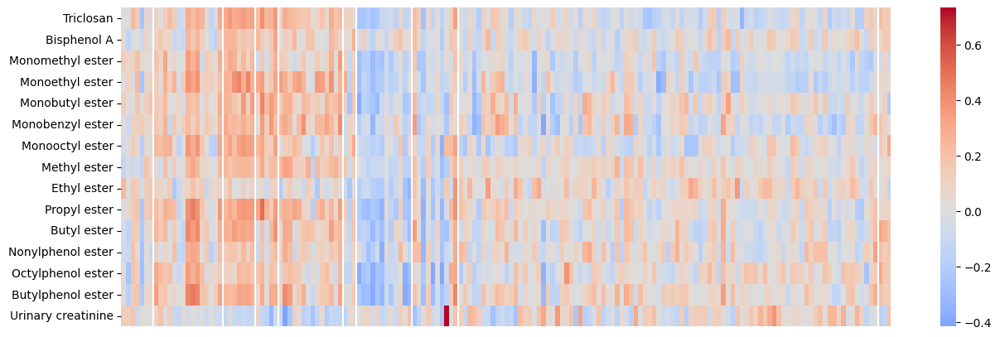

In [224]:
plt.figure(figsize=(15,5))
plot=allheatdf2.T[gut+strls1+strls2+strls3+strls4+strls5+cytokine+oxidative+foodallergy+VD]
sns.heatmap(plot ,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plot.index))],
           [eng_chi_dict[i] for i in plot.index],rotation=0)
lenth=0
for xiangmu in  [gut,strls1,strls2,strls3,strls4,strls5,cytokine,oxidative,foodallergy,VD]:
    lenth=lenth+len(xiangmu)
    print(str(xiangmu[0]),lenth,len(xiangmu))
    plt.vlines(lenth,0,20,color='white')
plt.show()

In [41]:
oxidative

['8-羟基脱氧鸟苷',
 '丙二醛',
 '谷胱甘肽',
 '含硫化合物',
 '谷胱甘肽硫转移酶',
 '谷胱甘肽过氧化物酶',
 '超氧化物歧化酶',
 '尿肌酐-1131',
 '花生四烯酸过氧化物',
 '硝化酪氨酸']

In [43]:
allheatdf2

,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
麦胶蛋白抗体,0.001365,0.063359,0.128602,-0.008868,0.131424,0.039628,-0.049819,-0.122751,0.248388,-0.023670,-0.051512,-0.070029,0.036815,0.021549,0.143422
组织转麸胺酶抗体,-0.010317,-0.147079,0.068004,0.092733,0.013577,-0.098029,0.020021,-0.041900,0.009881,0.054827,-0.148913,-0.101000,-0.259946,-0.170844,0.122746
分泌型免疫球蛋白,0.232766,-0.032130,0.110578,-0.036271,0.016993,0.109086,0.136076,-0.090018,0.167161,0.130303,0.146582,0.192212,0.187933,0.127819,0.177659
钙卫蛋白,0.152153,0.010291,0.199937,0.245881,0.184230,0.116927,0.065366,-0.025485,0.131851,0.191608,0.140511,0.051886,0.124747,0.189987,-0.090722
解连蛋白,-0.264420,-0.099036,0.045000,-0.259169,-0.005219,0.135711,-0.187426,-0.135128,-0.055280,-0.236813,-0.218895,-0.270344,-0.281370,-0.229356,0.023419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
橄榄,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181
免疫球蛋白E,0.072518,0.066236,-0.018195,0.039262,0.035682,0.257401,-0.064274,0.094986,0.039012,0.193418,0.202963,0.335293,0.142546,0.277949,0.022185
维生素D,0.222153,0.068495,-0.070569,0.085937,-0.011811,0.184128,0.159105,0.006612,-0.035263,0.068176,0.320911,0.198949,0.311759,0.201230,-0.174404
维生素D3,0.138733,0.166561,0.094008,0.041771,0.114778,0.100574,0.081102,0.048748,0.078619,0.072918,0.268162,0.128034,0.169618,0.131986,-0.133110


In [54]:
plotheatmapdf4=allheatdf2.loc[[
'8-羟基脱氧鸟苷',
'丙二醛',
'花生四烯酸过氧化物',
'硝化酪氨酸',
 '谷胱甘肽',
 '含硫化合物',
 '谷胱甘肽硫转移酶',
 '谷胱甘肽过氧化物酶',
 '超氧化物歧化酶',
 '尿肌酐-1131'
]].T
plotheatmapdf4

,8-羟基脱氧鸟苷,丙二醛,花生四烯酸过氧化物,硝化酪氨酸,谷胱甘肽,含硫化合物,谷胱甘肽硫转移酶,谷胱甘肽过氧化物酶,超氧化物歧化酶,尿肌酐-1131
三氯沙,0.207283,0.124010,0.117351,0.339642,-0.275344,0.055631,-0.136511,0.041259,-0.165392,-0.013344
双酚A,0.213208,0.058699,0.173542,0.146416,-0.132174,-0.036908,-0.019589,0.017403,-0.205907,0.019194
单甲基酯,0.155092,-0.235380,-0.046617,0.196114,-0.224879,-0.030072,-0.080589,0.013084,-0.124440,0.034738
单乙基酯,0.085313,-0.077345,0.068810,0.143142,-0.266981,-0.014144,-0.047952,0.069144,-0.136120,-0.103972
单丁基酯,0.244573,-0.128605,0.184367,0.013730,-0.084078,-0.118643,-0.103644,0.081254,-0.110974,-0.277875
单苄基酯,0.350071,-0.241443,0.102253,0.032646,-0.126978,0.047092,-0.050214,0.034400,-0.032393,-0.234270
单乙基己基酯,0.086985,-0.115975,0.216515,0.329169,-0.124696,0.090838,-0.197333,0.081161,-0.348988,0.221120
甲酯,0.202896,-0.038008,0.127591,0.236407,-0.187955,0.137292,-0.120966,-0.033281,-0.287349,-0.193115
乙酯,0.185258,0.008051,-0.092288,0.380855,-0.302649,0.024324,-0.232491,-0.082352,-0.198851,0.157926
丙酯,0.132063,0.070827,0.236959,0.390275,-0.352236,-0.003836,-0.262177,0.004857,-0.331509,-0.057600


In [67]:
plotheatmapdf4

,8-羟基脱氧鸟苷,丙二醛,花生四烯酸过氧化物,硝化酪氨酸,谷胱甘肽,含硫化合物,谷胱甘肽硫转移酶,谷胱甘肽过氧化物酶,超氧化物歧化酶,尿肌酐-1131
三氯沙,0.207283,0.124010,0.117351,0.339642,-0.275344,0.055631,-0.136511,0.041259,-0.165392,-0.013344
双酚A,0.213208,0.058699,0.173542,0.146416,-0.132174,-0.036908,-0.019589,0.017403,-0.205907,0.019194
单甲基酯,0.155092,-0.235380,-0.046617,0.196114,-0.224879,-0.030072,-0.080589,0.013084,-0.124440,0.034738
单乙基酯,0.085313,-0.077345,0.068810,0.143142,-0.266981,-0.014144,-0.047952,0.069144,-0.136120,-0.103972
单丁基酯,0.244573,-0.128605,0.184367,0.013730,-0.084078,-0.118643,-0.103644,0.081254,-0.110974,-0.277875
单苄基酯,0.350071,-0.241443,0.102253,0.032646,-0.126978,0.047092,-0.050214,0.034400,-0.032393,-0.234270
单乙基己基酯,0.086985,-0.115975,0.216515,0.329169,-0.124696,0.090838,-0.197333,0.081161,-0.348988,0.221120
甲酯,0.202896,-0.038008,0.127591,0.236407,-0.187955,0.137292,-0.120966,-0.033281,-0.287349,-0.193115
乙酯,0.185258,0.008051,-0.092288,0.380855,-0.302649,0.024324,-0.232491,-0.082352,-0.198851,0.157926
丙酯,0.132063,0.070827,0.236959,0.390275,-0.352236,-0.003836,-0.262177,0.004857,-0.331509,-0.057600


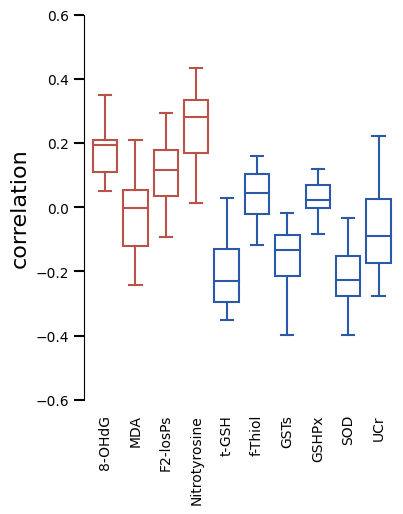

In [83]:
plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize=(4,5))

clsls=[
'8-羟基脱氧鸟苷',
'丙二醛',
'花生四烯酸过氧化物',
'硝化酪氨酸',
 '谷胱甘肽',
 '含硫化合物',
 '谷胱甘肽硫转移酶',
 '谷胱甘肽过氧化物酶',
 '超氧化物歧化酶',
 '尿肌酐-1131'
]
clslseng=[
'8-OHdG',
'MDA',
'F2-losPs',
'Nitrotyrosine',
't-GSH',
'f-Thiol',
'GSTs',
'GSHPx',
'SOD',
'UCr'
]
data=[ plotheatmapdf4[i].tolist() for i in clsls
]
    
colors =['#b95248','#b95248','#b95248','#b95248','#2a59a7','#2a59a7','#2a59a7','#2a59a7','#2a59a7','#2a59a7']

for i, d in enumerate(data):
    plt.boxplot(d, positions=[i + 1], widths=0.8, patch_artist=True,
                boxprops=dict(facecolor='white',edgecolor =colors[i],linewidth=1.5),
                medianprops=dict(color=colors[i],linewidth=1.5),
                whiskerprops={'color': colors[i],'linewidth':1.5},
                capprops={'color': colors[i],'linewidth':1.5},
                flierprops=dict(marker='o', color='black', markersize=0))
    
plt.xticks([i+1 for i in range(len(plotheatmapdf4.columns))],
           [clslseng[i] for i,j in enumerate(plotheatmapdf4.columns)],rotation=90)
plt.ylabel('DNA score')

'''u_statistic, p_value = stats.mannwhitneyu(data[0],data[1])
plt.text(1.5, .8, f'$P = {p_value:.2e}$', ha='center')'''

plt.ylim(-.6,.6)
plt.xlim(0.3,len(clsls)+0.5)
plt.tick_params(which='both', width=1.5, length=7, left=True, bottom=False)
plt.xlabel('')
plt.ylabel('correlation', fontsize=16)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.show()

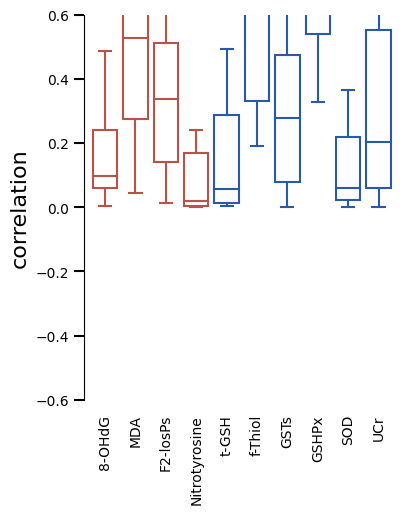

In [247]:
plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize=(4,5))

clsls=[
'8-羟基脱氧鸟苷',
'丙二醛',
'花生四烯酸过氧化物',
'硝化酪氨酸',
 '谷胱甘肽',
 '含硫化合物',
 '谷胱甘肽硫转移酶',
 '谷胱甘肽过氧化物酶',
 '超氧化物歧化酶',
 '尿肌酐-1131'
]
clslseng=[
'8-OHdG',
'MDA',
'F2-losPs',
'Nitrotyrosine',
't-GSH',
'f-Thiol',
'GSTs',
'GSHPx',
'SOD',
'UCr'
]
data=[ p_values_df[i].tolist() for i in clsls
]
    
colors =['#b95248','#b95248','#b95248','#b95248','#2a59a7','#2a59a7','#2a59a7','#2a59a7','#2a59a7','#2a59a7']

for i, d in enumerate(data):
    plt.boxplot(d, positions=[i + 1], widths=0.8, patch_artist=True,
                boxprops=dict(facecolor='white',edgecolor =colors[i],linewidth=1.5),
                medianprops=dict(color=colors[i],linewidth=1.5),
                whiskerprops={'color': colors[i],'linewidth':1.5},
                capprops={'color': colors[i],'linewidth':1.5},
                flierprops=dict(marker='o', color='black', markersize=0))
    
plt.xticks([i+1 for i in range(len(p_values_df.columns))],
           [clslseng[i] for i,j in enumerate(p_values_df.columns)],rotation=90)
plt.ylabel('DNA score')

'''u_statistic, p_value = stats.mannwhitneyu(data[0],data[1])
plt.text(1.5, .8, f'$P = {p_value:.2e}$', ha='center')'''

plt.ylim(-.6,.6)
plt.xlim(0.3,len(clsls)+0.5)
plt.tick_params(which='both', width=1.5, length=7, left=True, bottom=False)
plt.xlabel('')
plt.ylabel('correlation', fontsize=16)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.show()

In [241]:
p_values_df['8-羟基脱氧鸟苷']

KeyError: '8-羟基脱氧鸟苷'

In [232]:
results = []

for col in oxidative:
    for other_col in Hormone:
        if other_col not in oxidative:            if col in alldata_pivot.columns and other_col in alldata_pivot.columns:
                corr, p_value = stats.spearmanr(alldata_pivot[col]      .fillna(np.mean(alldata_pivot[col])),
                                                alldata_pivot[other_col].fillna(np.mean(alldata_pivot[other_col])))
                results.append({'Variable1': col, 'Variable2': other_col, 'p_value': p_value})

In [243]:
p_values_df = pd.DataFrame(results)
p_values_df = p_values_df.pivot_table(index='Variable2',columns='Variable1',values='p_value')

In [248]:
p_values_df

Variable1,8-羟基脱氧鸟苷,丙二醛,含硫化合物,尿肌酐-1131,硝化酪氨酸,花生四烯酸过氧化物,谷胱甘肽,谷胱甘肽硫转移酶,谷胱甘肽过氧化物酶,超氧化物歧化酶
Variable2,,,,,,,,,,
丁基苯酯,0.108069,0.712229,0.240586,2.043814e-01,0.000207,0.258512,0.016974,0.012258,0.680394,0.031366
丁酯,0.003450,0.746152,0.759211,3.329345e-02,0.019995,0.394768,0.005580,0.272800,0.328784,0.040870
三氯沙,0.087454,0.310004,0.649817,9.133438e-01,0.004302,0.336902,0.022030,0.263365,0.736414,0.174424
丙酯,0.279385,0.563052,0.975047,6.382739e-01,0.000916,0.049951,0.002996,0.029537,0.968407,0.005393
乙酯,0.127515,0.947649,0.842743,1.949688e-01,0.001245,0.450723,0.011483,0.054560,0.501131,0.101419
单丁基酯,0.042833,0.292279,0.331571,2.079082e-02,0.910848,0.129388,0.492169,0.396724,0.506875,0.363989
单乙基己基酯,0.477271,0.342635,0.457903,6.786810e-02,0.005749,0.073951,0.307314,0.104110,0.507362,0.003293
单乙基酯,0.485809,0.527593,0.908167,3.952219e-01,0.240654,0.574249,0.026581,0.695601,0.572386,0.264746
单甲基酯,0.203206,0.051542,0.806233,7.768928e-01,0.106308,0.703678,0.063207,0.510366,0.915023,0.308318


([<matplotlib.axis.XTick at 0x7f9aea320650>,
 [Text(0.5, 0, "8-hydroxy-2'-deoxyguanosine (8-OHdG)"),
  Text(1.5, 0, 'Malondialdehyde (MDA)'),
  Text(2.5, 0, 'Arachidonic acid peroxide'),
  Text(3.5, 0, '3-Nitrotyrosine'),
  Text(4.5, 0, 'Glutathione (GSH)'),
  Text(5.5, 0, 'Sulfur-containing compounds'),
  Text(6.5, 0, 'Glutathione S-transferase (GST)'),
  Text(7.5, 0, 'Glutathione peroxidase (GPx)'),
  Text(8.5, 0, 'Superoxide dismutase (SOD)'),
  Text(9.5, 0, 'Urine creatinine')])

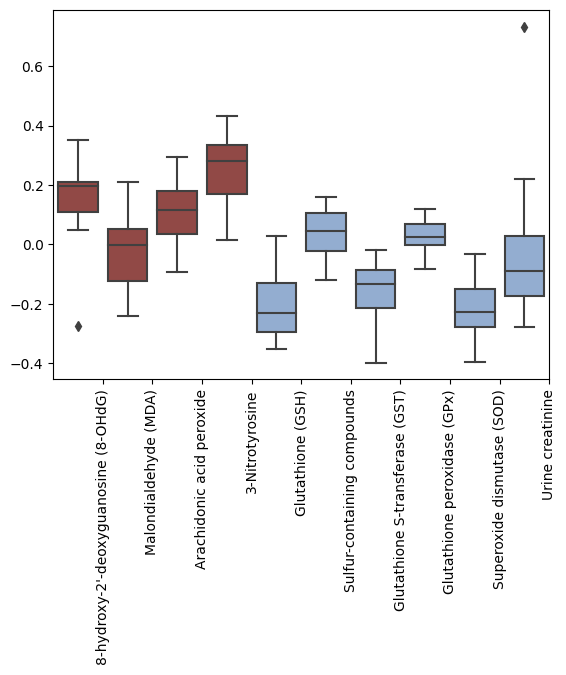

In [66]:
sns.boxplot(plotheatmapdf4,palette=['#9d3e3a','#9d3e3a','#9d3e3a','#9d3e3a','#89abda','#89abda','#89abda','#89abda','#89abda','#89abda'])
plt.xticks([i+0.5 for i in range(len(plotheatmapdf4.columns))],
           [eng_chi_dict[i] for i in plotheatmapdf4.columns],rotation=90)


### hormones and foodallergy

In [15]:
plotheatmapdf5=allheatdf2.loc[foodallergy]
plotheatmapdf5

,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
牛奶,-0.019301,-0.018833,0.072779,-0.001140,0.000433,0.129521,-0.163638,0.106067,0.176912,0.194308,-0.071829,0.240133,-0.200937,0.035940,0.132994
玉米,-0.090553,-0.136325,-0.073554,-0.184500,0.037506,0.071100,-0.233498,-0.029184,0.034612,0.126977,0.095052,0.177797,-0.001680,0.163429,-0.113431
虾,0.065770,0.118497,-0.013179,0.027726,0.045305,-0.117985,0.086733,0.033927,0.250198,0.045876,0.060350,-0.134507,0.133784,-0.010160,0.249324
鳕鱼,-0.056010,-0.095147,-0.250167,-0.305387,-0.321963,-0.346379,0.032171,0.055131,0.015527,0.018833,-0.133317,0.014192,-0.178826,-0.136865,0.211153
猪肉,-0.199723,-0.118609,-0.101280,-0.062655,-0.228299,-0.292016,-0.227980,-0.034018,0.015026,-0.199643,-0.124753,-0.146030,-0.075250,-0.118136,0.123099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
桃子,-0.188482,0.211454,0.062747,-0.074694,0.018081,-0.129020,-0.042933,-0.005791,0.153222,-0.192142,-0.087423,-0.146288,0.123937,-0.004218,0.258806
木瓜,-0.189853,0.004264,-0.138629,-0.165737,-0.100687,-0.134323,-0.053239,-0.125973,-0.066557,-0.226517,-0.147822,-0.078232,0.067509,-0.058804,0.112361
柑橘类,0.096755,-0.117720,-0.190293,-0.167126,0.027110,0.029325,0.042295,-0.042317,-0.061175,0.034885,-0.071133,0.146876,-0.256485,-0.012920,-0.135639
橄榄,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181


In [25]:
list6=['牛奶','羊奶','酸奶','蛋黄','蛋白','小麦','麸质','大豆','核桃','杏仁','葵花籽']

In [26]:
plotheatmapdf5

,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
牛奶,-0.019301,-0.018833,0.072779,-0.001140,0.000433,0.129521,-0.163638,0.106067,0.176912,0.194308,-0.071829,0.240133,-0.200937,0.035940,0.132994
玉米,-0.090553,-0.136325,-0.073554,-0.184500,0.037506,0.071100,-0.233498,-0.029184,0.034612,0.126977,0.095052,0.177797,-0.001680,0.163429,-0.113431
虾,0.065770,0.118497,-0.013179,0.027726,0.045305,-0.117985,0.086733,0.033927,0.250198,0.045876,0.060350,-0.134507,0.133784,-0.010160,0.249324
鳕鱼,-0.056010,-0.095147,-0.250167,-0.305387,-0.321963,-0.346379,0.032171,0.055131,0.015527,0.018833,-0.133317,0.014192,-0.178826,-0.136865,0.211153
猪肉,-0.199723,-0.118609,-0.101280,-0.062655,-0.228299,-0.292016,-0.227980,-0.034018,0.015026,-0.199643,-0.124753,-0.146030,-0.075250,-0.118136,0.123099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
桃子,-0.188482,0.211454,0.062747,-0.074694,0.018081,-0.129020,-0.042933,-0.005791,0.153222,-0.192142,-0.087423,-0.146288,0.123937,-0.004218,0.258806
木瓜,-0.189853,0.004264,-0.138629,-0.165737,-0.100687,-0.134323,-0.053239,-0.125973,-0.066557,-0.226517,-0.147822,-0.078232,0.067509,-0.058804,0.112361
柑橘类,0.096755,-0.117720,-0.190293,-0.167126,0.027110,0.029325,0.042295,-0.042317,-0.061175,0.034885,-0.071133,0.146876,-0.256485,-0.012920,-0.135639
橄榄,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181


In [27]:
filtered_df = plotheatmapdf5[plotheatmapdf5.index.isin(list6)]
filtered_df

,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
牛奶,-0.019301,-0.018833,0.072779,-0.001140,0.000433,0.129521,-0.163638,0.106067,0.176912,0.194308,-0.071829,0.240133,-0.200937,0.035940,0.132994
蛋黄,0.148512,0.133019,0.031601,0.224583,0.117763,0.354246,0.021957,0.135114,0.024693,0.195402,0.225083,0.102162,0.034200,0.228125,-0.146537
蛋白,0.058450,0.077021,0.088968,0.264118,0.065779,0.284263,-0.054242,0.061378,-0.055133,0.134729,0.165489,0.048520,-0.024919,0.171889,-0.073212
羊奶,0.023611,-0.068621,-0.033677,-0.062588,0.226527,0.238869,-0.176023,0.047266,0.144471,0.198782,0.034044,0.256294,-0.159269,0.097734,-0.158671
小麦,0.128495,-0.013293,-0.230835,0.032514,-0.266858,-0.193726,0.042090,0.015185,-0.031329,0.065393,-0.149633,0.015978,-0.174576,-0.150414,0.035478
酸奶,0.052795,-0.022824,0.016964,-0.026631,0.298889,0.184842,-0.128753,0.085227,0.100438,0.178940,-0.020296,0.253338,-0.015215,0.095502,-0.173852
麸质,0.013373,-0.004492,-0.054721,0.246562,-0.103992,0.115042,0.038008,0.125219,-0.057550,0.057823,-0.011708,-0.192059,-0.128096,0.040496,-0.006407
核桃,-0.023815,-0.042067,-0.058278,0.103194,0.015162,-0.000844,0.023644,0.069222,-0.029846,0.002371,0.039489,-0.172604,-0.072501,0.108133,-0.047721
杏仁,-0.119010,0.015870,-0.079552,0.008299,0.100345,0.105910,-0.097450,0.117218,-0.079896,0.072074,0.016410,0.156699,-0.120508,0.149354,-0.102990
葵花籽,0.021764,0.160702,-0.142733,-0.128231,0.065803,0.061170,-0.031100,0.077180,-0.020430,0.105774,0.267598,0.268802,0.014721,0.117535,-0.140702


In [ ]:
list6=['牛奶','羊奶','酸奶','蛋黄','蛋白','小麦','麸质','大豆','核桃','杏仁','花生','葵花籽']

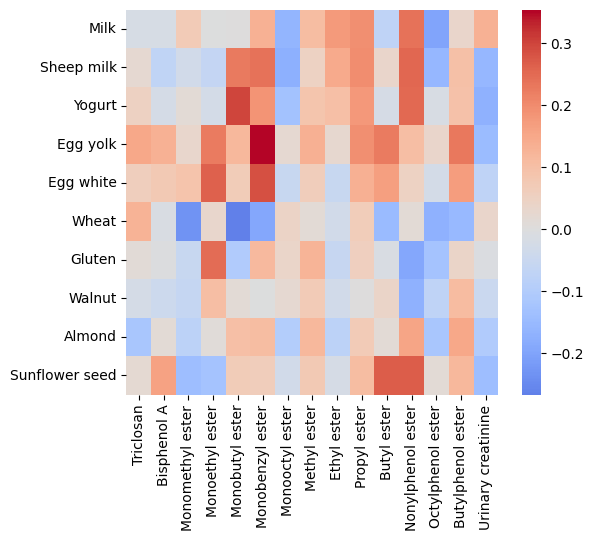

In [29]:
strlsc=[]
for i in list6:
    strlsc.extend([j for j in  filtered_df.index if i in j])

plt.figure(figsize=(6,5))
plot=filtered_df.loc[strlsc]
sns.heatmap(plot,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plot.index))],
           [eng_chi_dict[i] for i in plot.index],rotation=0)
    
plt.xticks([i+0.5 for i in range(len(plot.columns))],
           [eng_chi_dict[i] for i in plot.columns],rotation=90)
lenth=0
'''for xiangmu in  oxidative:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')'''
plt.show()

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


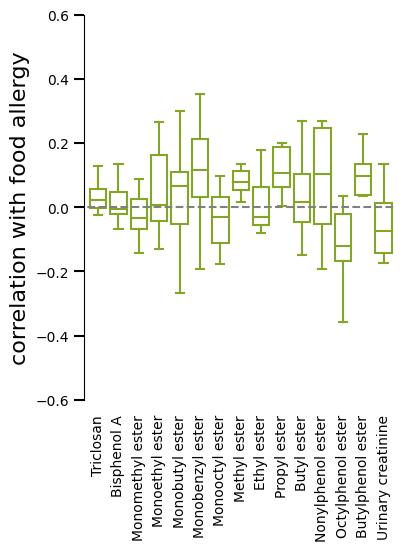

In [19]:
plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize=(4,5))

clsls=Hormone
clslseng=Hormone_english
data=[ filtered_df[i].tolist() for i in clsls
]
    
colors =['#84a628']*17

for i, d in enumerate(data):
    plt.boxplot(d, positions=[i + 1], widths=0.8, patch_artist=True,
                boxprops=dict(facecolor='white',edgecolor =colors[i],linewidth=1.5),
                medianprops=dict(color=colors[i],linewidth=1.5),
                whiskerprops={'color': colors[i],'linewidth':1.5},
                capprops={'color': colors[i],'linewidth':1.5},
                flierprops=dict(marker='o', color='black', markersize=0))
    
plt.xticks([i+1 for i in range(len(filtered_df.columns))],
           [clslseng[i] for i,j in enumerate(filtered_df.columns)],rotation=90)
plt.ylabel('DNA score')

'''u_statistic, p_value = stats.mannwhitneyu(data[0],data[1])
plt.text(1.5, .8, f'$P = {p_value:.2e}$', ha='center')'''

plt.ylim(-.6,.6)
plt.xlim(0.3,len(clsls)+0.5)
plt.tick_params(which='both', width=1.5, length=7, left=True, bottom=False)
plt.xlabel('')
plt.ylabel('correlation with food allergy', fontsize=16)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.hlines(0,-10,25,color='grey',ls='--')
plt.show()

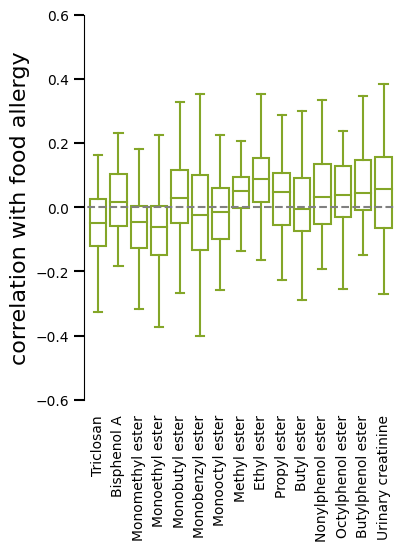

In [120]:
plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize=(4,5))

clsls=Hormone
clslseng=Hormone_english
data=[ plotheatmapdf5[i].tolist() for i in clsls
]
    
colors =['#84a628']*17

for i, d in enumerate(data):
    plt.boxplot(d, positions=[i + 1], widths=0.8, patch_artist=True,
                boxprops=dict(facecolor='white',edgecolor =colors[i],linewidth=1.5),
                medianprops=dict(color=colors[i],linewidth=1.5),
                whiskerprops={'color': colors[i],'linewidth':1.5},
                capprops={'color': colors[i],'linewidth':1.5},
                flierprops=dict(marker='o', color='black', markersize=0))
    
plt.xticks([i+1 for i in range(len(plotheatmapdf5.columns))],
           [clslseng[i] for i,j in enumerate(plotheatmapdf5.columns)],rotation=90)
plt.ylabel('DNA score')

'''u_statistic, p_value = stats.mannwhitneyu(data[0],data[1])
plt.text(1.5, .8, f'$P = {p_value:.2e}$', ha='center')'''

plt.ylim(-.6,.6)
plt.xlim(0.3,len(clsls)+0.5)
plt.tick_params(which='both', width=1.5, length=7, left=True, bottom=False)
plt.xlabel('')
plt.ylabel('correlation with food allergy', fontsize=16)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.hlines(0,-10,25,color='grey',ls='--')
plt.show()

<AxesSubplot:>

/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/IPython/core/events.py:89: UserWarning: Glyph 19977 (\N{CJK UNIFIED IDEOGRAPH-4E09}) missing from current font.
  func(*args, **kwargs)
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/IPython/core/events.py:89: UserWarning: Glyph 27695 (\N{CJK UNIFIED IDEOGRAPH-6C2F}) missing from current font.
  func(*args, **kwargs)
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/IPython/core/events.py:89: UserWarning: Glyph 27801 (\N{CJK UNIFIED IDEOGRAPH-6C99}) missing from current font.
  func(*args, **kwargs)
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/IPython/core/events.py:89: UserWarning: Glyph 21452 (\N{CJK UNIFIED IDEOGRAPH-53CC}) missing from current font.
  func(*args, **kwargs)
/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/IPython/core/events.py:89: UserWarning: Glyph 37210 (\N{CJK UNIFIED IDEOGRAPH-915A}) missing from cur

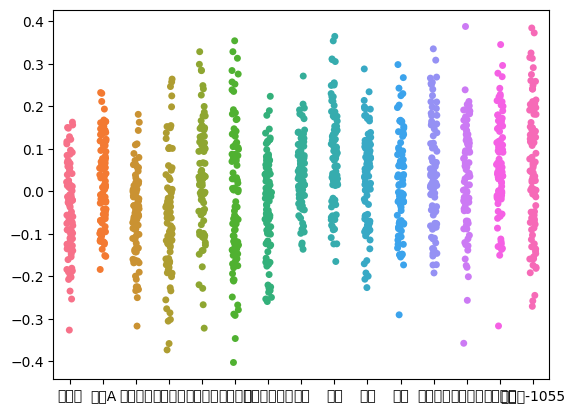

In [98]:
sns.stripplot(data=plotheatmapdf5)

In [103]:
plotheatmapdf5

,三氯沙,双酚A,单甲基酯,单乙基酯,单丁基酯,单苄基酯,单乙基己基酯,甲酯,乙酯,丙酯,丁酯,壬基苯酯,辛基苯酯,丁基苯酯,尿肌酐-1055
牛奶,-0.019301,-0.018833,0.072779,-0.001140,0.000433,0.129521,-0.163638,0.106067,0.176912,0.194308,-0.071829,0.240133,-0.200937,0.035940,0.132994
玉米,-0.090553,-0.136325,-0.073554,-0.184500,0.037506,0.071100,-0.233498,-0.029184,0.034612,0.126977,0.095052,0.177797,-0.001680,0.163429,-0.113431
虾,0.065770,0.118497,-0.013179,0.027726,0.045305,-0.117985,0.086733,0.033927,0.250198,0.045876,0.060350,-0.134507,0.133784,-0.010160,0.249324
鳕鱼,-0.056010,-0.095147,-0.250167,-0.305387,-0.321963,-0.346379,0.032171,0.055131,0.015527,0.018833,-0.133317,0.014192,-0.178826,-0.136865,0.211153
猪肉,-0.199723,-0.118609,-0.101280,-0.062655,-0.228299,-0.292016,-0.227980,-0.034018,0.015026,-0.199643,-0.124753,-0.146030,-0.075250,-0.118136,0.123099
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
桃子,-0.188482,0.211454,0.062747,-0.074694,0.018081,-0.129020,-0.042933,-0.005791,0.153222,-0.192142,-0.087423,-0.146288,0.123937,-0.004218,0.258806
木瓜,-0.189853,0.004264,-0.138629,-0.165737,-0.100687,-0.134323,-0.053239,-0.125973,-0.066557,-0.226517,-0.147822,-0.078232,0.067509,-0.058804,0.112361
柑橘类,0.096755,-0.117720,-0.190293,-0.167126,0.027110,0.029325,0.042295,-0.042317,-0.061175,0.034885,-0.071133,0.146876,-0.256485,-0.012920,-0.135639
橄榄,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181


In [108]:
len(Hormone_english)

15

In [111]:
[i-1 for i in range(len(plotheatmapdf5.columns))]

[-1, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

/home2/zhenglijing/program/ENTER/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: The palette list has more values (26) than needed (15), which may not be intended.
  # Remove the CWD from sys.path while we load stuff.


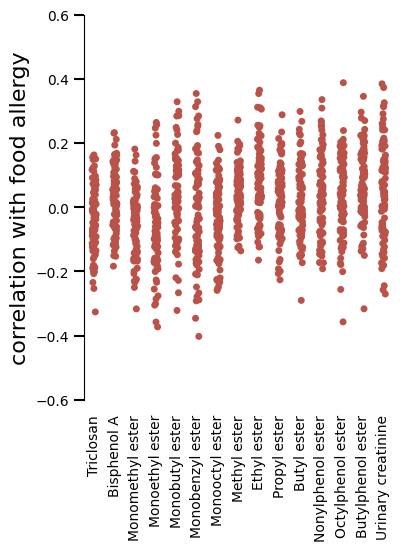

In [115]:
plt.rcParams['font.family'] = 'Arial'
plt.figure(figsize=(4,5))

clsls=Hormone
clslseng=Hormone_english

sns.stripplot(data=plotheatmapdf5,palette=['#b95248','#b95248','#b95248','#b95248','#b95248','#b95248','#b95248','#b95248',
         '#b95248','#b95248','#b95248','#b95248',
         '#b95248','#b95248','#b95248','#b95248',
         '#b95248','#b95248','#b95248','#b95248','#2a59a7','#2a59a7','#2a59a7','#2a59a7','#2a59a7','#2a59a7'])
    
plt.xticks([i for i in range(len(plotheatmapdf5.columns))],
           [clslseng[i] for i,j in enumerate(plotheatmapdf5.columns)],rotation=90)
plt.ylabel('DNA score')

'''u_statistic, p_value = stats.mannwhitneyu(data[0],data[1])
plt.text(1.5, .8, f'$P = {p_value:.2e}$', ha='center')'''

plt.ylim(-.6,.6)
plt.xlim(-0.5,len(clsls)-0.5)
plt.tick_params(which='both', width=1.5, length=7, left=True, bottom=False)
plt.xlabel('')
plt.ylabel('correlation with food allergy', fontsize=16)

plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['bottom'].set_visible(False)
plt.show()

In [109]:
Hormone_english

['Triclosan',
 'Bisphenol A',
 'Monomethyl ester',
 'Monoethyl ester',
 'Monobutyl ester',
 'Monobenzyl ester',
 'Monooctyl ester',
 'Methyl ester',
 'Ethyl ester',
 'Propyl ester',
 'Butyl ester',
 'Nonylphenol ester',
 'Octylphenol ester',
 'Butylphenol ester',
 'Urinary creatinine']

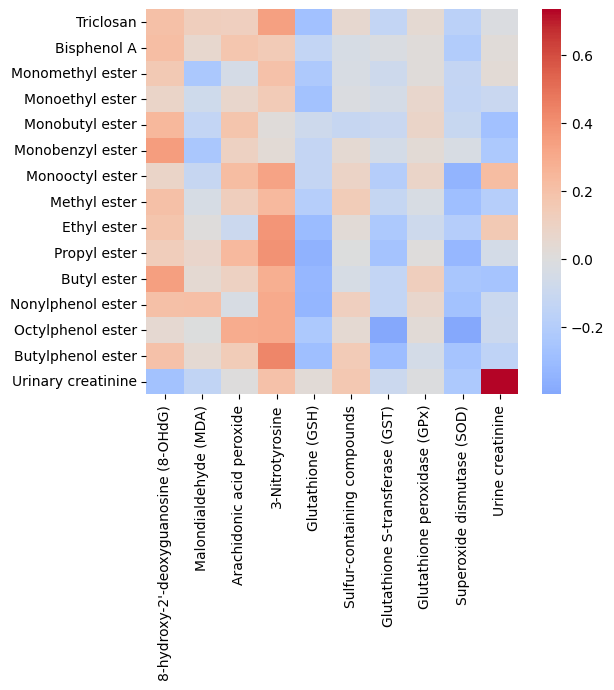

In [57]:
plt.figure(figsize=(6,5))
sns.heatmap(plotheatmapdf4,cmap='coolwarm',center=0,)

plt.xticks([])
plt.yticks([i+0.5 for i in range(len(plotheatmapdf4.index))],
           [eng_chi_dict[i] for i in plotheatmapdf4.index],rotation=0)
    
plt.xticks([i+0.5 for i in range(len(plotheatmapdf4.columns))],
           [eng_chi_dict[i] for i in plotheatmapdf4.columns],rotation=90)
lenth=0
'''for xiangmu in  oxidative:
    lenth=lenth+len(xiangmu)
    plt.vlines(lenth,0,20,color='white')'''
plt.show()

In [56]:
dfcluster=allheatdf2.copy()
dfcluster.index  =[eng_chi_dict[i] for i in dfcluster.index]
dfcluster.columns=[eng_chi_dict[i] for i in dfcluster.columns]

In [158]:
sns.color_palette('1')

ValueError: '1' is not a valid palette name

In [ ]:
'gut','organic_acid','cytokine','oxidative','foodallergy','VD','Hormone'

In [169]:
ls2=[]
strls=['gut','organic_acid','cytokine','oxidative','foodallergy','VD','Hormone']
for j,i in enumerate([gut,organic_acid,cytokine,oxidative,foodallergy,VD,Hormone]):
    ls2.extend([strls[j]]*len(i))

In [173]:
typedf=pd.DataFrame([gut+organic_acid+cytokine+oxidative+foodallergy+VD+Hormone,
              ls2,
             
             ]
            ).T

In [175]:
typedf[2]=typedf[0].map(eng_chi_dict)

In [182]:
typedict=dict(zip(typedf[2],typedf[1]))

In [238]:
colordict=dict(zip(['gut','organic_acid','cytokine','oxidative','foodallergy','VD','Hormone'],
                   sns.color_palette('deep',8)))
                  

In [198]:
from matplotlib.lines import Line2D

In [245]:
sns.color_palette('tab20',15)

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745)]

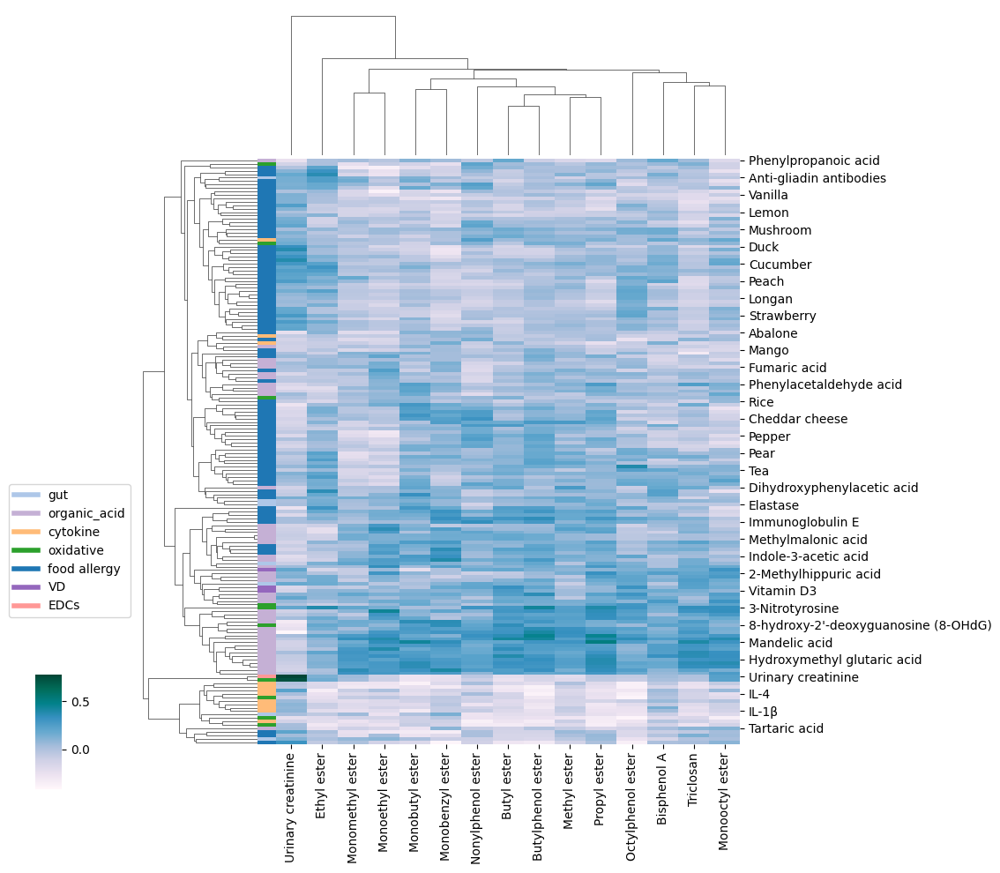

In [254]:
colordict=dict(zip(['gut','organic_acid','cytokine','oxidative','foodallergy','VD','Hormone'],
                   [sns.color_palette('tab20',15)[1],
                    sns.color_palette('tab20',15)[9],
                    sns.color_palette('tab20',15)[3],
                    sns.color_palette('tab20',15)[4],
                    sns.color_palette('tab20',15)[0],
                    sns.color_palette('tab20',15)[8],
                    sns.color_palette('tab20',15)[7],
                    
                       
                       
                   ]))
                  
g=sns.clustermap(dfcluster,cmap='PuBuGn',row_colors=dfcluster.index.map(typedict).map(colordict),
              cbar_pos=(-0.1, 0.1, 0.03, 0.13))
legend_elements = [
    Line2D([0], [0], color=sns.color_palette('tab20',15)[1], lw=4, label='gut'),
    Line2D([0], [0], color=sns.color_palette('tab20',15)[9], lw=4, label='organic_acid'),
    Line2D([0], [0], color=sns.color_palette('tab20',15)[3], lw=4, label='cytokine'),
    Line2D([0], [0], color=sns.color_palette('tab20',15)[4], lw=4, label='oxidative'),
    Line2D([0], [0], color=sns.color_palette('tab20',15)[0], lw=4, label='food allergy'),
    Line2D([0], [0], color=sns.color_palette('tab20',15)[8], lw=4, label='VD'),
    Line2D([0], [0], color=sns.color_palette('tab20',15)[7], lw=4, label='EDCs'),
]

plt.legend(handles=legend_elements,loc=[-1,1.5])


In [265]:
from scipy.cluster.hierarchy import fcluster

In [280]:
row_linkage = g.dendrogram_row.linkage
row_clusters = fcluster(row_linkage, .7, criterion='distance')

In [281]:
len(set(row_clusters))

7

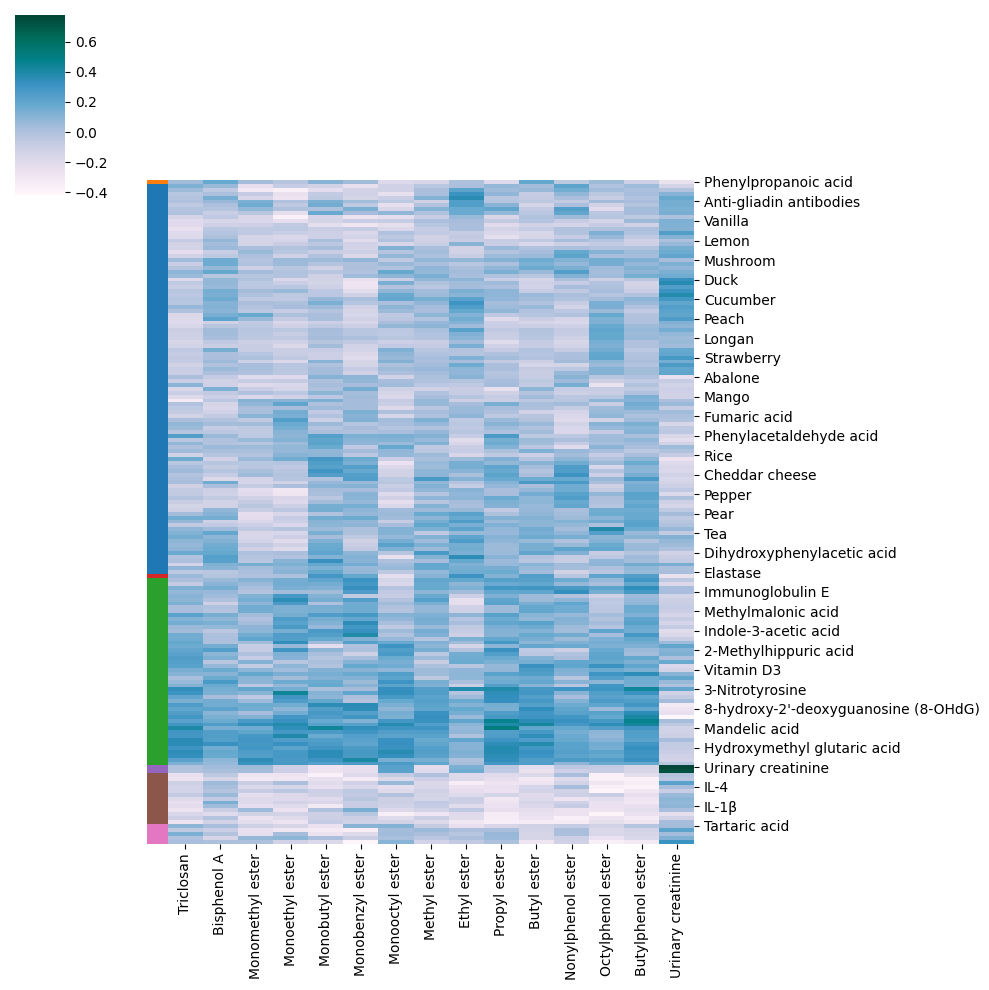

In [292]:
reordered_ind = g.dendrogram_row.reordered_ind
lencl=len(set(row_clusters))
cluster_colors22 = dict(zip(range(1,lencl+1),sns.color_palette('tab10')))
row_colors22 = [cluster_colors22[c] for c in row_clusters]
row_colors22 = [row_colors22[i] for i in reordered_ind]

sns.clustermap(dfcluster.iloc[g.dendrogram_row.reordered_ind],cmap="PuBuGn",
                  row_colors=row_colors22, col_cluster=False, row_cluster=False,
                  )

In [284]:
dfcluster_plot=dfcluster.copy()
dfcluster_plot

,Triclosan,Bisphenol A,Monomethyl ester,Monoethyl ester,Monobutyl ester,Monobenzyl ester,Monooctyl ester,Methyl ester,Ethyl ester,Propyl ester,Butyl ester,Nonylphenol ester,Octylphenol ester,Butylphenol ester,Urinary creatinine
Anti-gliadin antibodies,0.001365,0.063359,0.128602,-0.008868,0.131424,0.039628,-0.049819,-0.122751,0.248388,-0.023670,-0.051512,-0.070029,0.036815,0.021549,0.143422
Anti-tissue transglutaminase antibodies,-0.010317,-0.147079,0.068004,0.092733,0.013577,-0.098029,0.020021,-0.041900,0.009881,0.054827,-0.148913,-0.101000,-0.259946,-0.170844,0.122746
Secretory immunoglobulin,0.232766,-0.032130,0.110578,-0.036271,0.016993,0.109086,0.136076,-0.090018,0.167161,0.130303,0.146582,0.192212,0.187933,0.127819,0.177659
Calprotectin,0.152153,0.010291,0.199937,0.245881,0.184230,0.116927,0.065366,-0.025485,0.131851,0.191608,0.140511,0.051886,0.124747,0.189987,-0.090722
Zonulin,-0.264420,-0.099036,0.045000,-0.259169,-0.005219,0.135711,-0.187426,-0.135128,-0.055280,-0.236813,-0.218895,-0.270344,-0.281370,-0.229356,0.023419
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Olive,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181
Immunoglobulin E,0.072518,0.066236,-0.018195,0.039262,0.035682,0.257401,-0.064274,0.094986,0.039012,0.193418,0.202963,0.335293,0.142546,0.277949,0.022185
Vitamin D,0.222153,0.068495,-0.070569,0.085937,-0.011811,0.184128,0.159105,0.006612,-0.035263,0.068176,0.320911,0.198949,0.311759,0.201230,-0.174404
Vitamin D3,0.138733,0.166561,0.094008,0.041771,0.114778,0.100574,0.081102,0.048748,0.078619,0.072918,0.268162,0.128034,0.169618,0.131986,-0.133110


In [285]:
dfcluster_plot['cluster'] = row_clusters
dfcluster_plot

,Triclosan,Bisphenol A,Monomethyl ester,Monoethyl ester,Monobutyl ester,Monobenzyl ester,Monooctyl ester,Methyl ester,Ethyl ester,Propyl ester,Butyl ester,Nonylphenol ester,Octylphenol ester,Butylphenol ester,Urinary creatinine,cluster
Anti-gliadin antibodies,0.001365,0.063359,0.128602,-0.008868,0.131424,0.039628,-0.049819,-0.122751,0.248388,-0.023670,-0.051512,-0.070029,0.036815,0.021549,0.143422,1
Anti-tissue transglutaminase antibodies,-0.010317,-0.147079,0.068004,0.092733,0.013577,-0.098029,0.020021,-0.041900,0.009881,0.054827,-0.148913,-0.101000,-0.259946,-0.170844,0.122746,7
Secretory immunoglobulin,0.232766,-0.032130,0.110578,-0.036271,0.016993,0.109086,0.136076,-0.090018,0.167161,0.130303,0.146582,0.192212,0.187933,0.127819,0.177659,3
Calprotectin,0.152153,0.010291,0.199937,0.245881,0.184230,0.116927,0.065366,-0.025485,0.131851,0.191608,0.140511,0.051886,0.124747,0.189987,-0.090722,3
Zonulin,-0.264420,-0.099036,0.045000,-0.259169,-0.005219,0.135711,-0.187426,-0.135128,-0.055280,-0.236813,-0.218895,-0.270344,-0.281370,-0.229356,0.023419,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Olive,0.156062,0.143065,-0.224611,-0.085434,0.152308,0.168768,0.041018,0.088261,0.176584,0.109969,0.114570,0.053114,0.096223,0.179557,-0.056181,1
Immunoglobulin E,0.072518,0.066236,-0.018195,0.039262,0.035682,0.257401,-0.064274,0.094986,0.039012,0.193418,0.202963,0.335293,0.142546,0.277949,0.022185,3
Vitamin D,0.222153,0.068495,-0.070569,0.085937,-0.011811,0.184128,0.159105,0.006612,-0.035263,0.068176,0.320911,0.198949,0.311759,0.201230,-0.174404,3
Vitamin D3,0.138733,0.166561,0.094008,0.041771,0.114778,0.100574,0.081102,0.048748,0.078619,0.072918,0.268162,0.128034,0.169618,0.131986,-0.133110,3


In [288]:
dfcluster_plot['cluster'] .value_counts()

1    100
3     48
6     13
7      5
5      2
2      1
4      1
Name: cluster, dtype: int64

In [291]:
dfcluster_plot.iloc[g.dendrogram_row.reordered_ind].iloc[-20:]

,Triclosan,Bisphenol A,Monomethyl ester,Monoethyl ester,Monobutyl ester,Monobenzyl ester,Monooctyl ester,Methyl ester,Ethyl ester,Propyl ester,Butyl ester,Nonylphenol ester,Octylphenol ester,Butylphenol ester,Urinary creatinine,cluster
Urinary creatinine,-0.005720,0.041990,0.048007,-0.104871,-0.279959,-0.243329,0.230225,-0.212323,0.130763,-0.047190,-0.224680,-0.047271,-0.069034,-0.139574,0.777143,5
Urine creatinine,-0.013344,0.019194,0.034738,-0.103972,-0.277875,-0.234270,0.221120,-0.193115,0.157926,-0.057600,-0.256625,-0.101166,-0.088758,-0.154694,0.733152,5
IFN-α,-0.245762,-0.049921,-0.280248,-0.279186,-0.374329,-0.186509,-0.068975,-0.000093,-0.185740,-0.195302,-0.177729,0.025569,-0.370844,-0.223954,-0.013427,6
IL-12,-0.266647,-0.150435,-0.310290,-0.292710,-0.245850,-0.326022,-0.178392,-0.102286,-0.174986,-0.232666,-0.313575,-0.196420,-0.366607,-0.377972,-0.043981,6
IL-2,-0.113333,0.045136,-0.092849,0.010251,-0.211836,-0.114822,0.062066,-0.177936,-0.344926,-0.280982,-0.290551,-0.133144,-0.294481,-0.345461,0.224075,6
IL-4,-0.133769,0.012511,-0.177600,-0.154391,-0.238291,-0.166548,-0.232976,-0.162420,-0.259905,-0.245745,-0.143322,0.029624,-0.359632,-0.383072,0.022917,6
Glutathione S-transferase (GST),-0.136511,-0.019589,-0.080589,-0.047952,-0.103644,-0.050214,-0.197333,-0.120966,-0.232491,-0.262177,-0.133870,-0.132294,-0.397901,-0.300022,-0.094662,6
IL-8,-0.074012,0.058207,-0.222721,-0.183707,-0.115213,-0.067277,-0.012304,-0.141233,-0.195887,-0.138579,-0.202221,-0.112261,-0.089422,-0.236862,0.055002,6
IFN-γ,-0.195903,-0.064416,-0.186580,-0.188710,-0.202004,-0.038326,-0.108776,-0.148771,-0.090931,-0.302045,-0.187153,-0.274958,-0.213537,-0.285059,0.091144,6
TNF,-0.240824,0.139655,-0.194536,-0.128839,-0.161729,-0.078302,-0.108038,-0.064748,-0.102325,-0.279065,-0.142095,-0.115032,-0.256452,-0.309025,0.072895,6


In [293]:
dfcluster_plot.iloc[g.dendrogram_row.reordered_ind].iloc[-20:].index.tolist()

['Urinary creatinine',
 'Urine creatinine',
 'IFN-α',
 'IL-12',
 'IL-2',
 'IL-4',
 'Glutathione S-transferase (GST)',
 'IL-8',
 'IFN-γ',
 'TNF',
 'IL-1β',
 'Zonulin',
 'Superoxide dismutase (SOD)',
 'IL-17',
 'Glutathione (GSH)',
 'Tartaric acid',
 'Cod',
 'Wheat',
 'Anti-tissue transglutaminase antibodies',
 'Peanut']

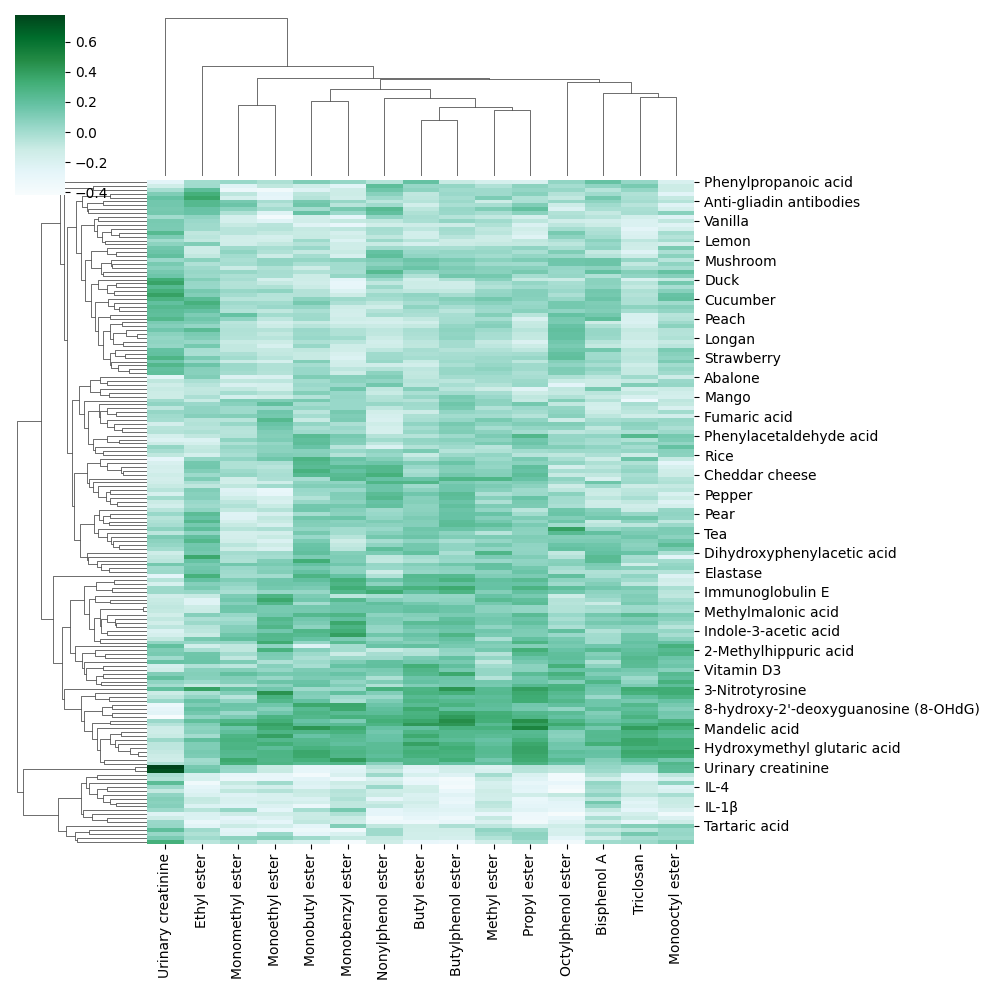

In [242]:
sns.clustermap(dfcluster,cmap='BuGn')

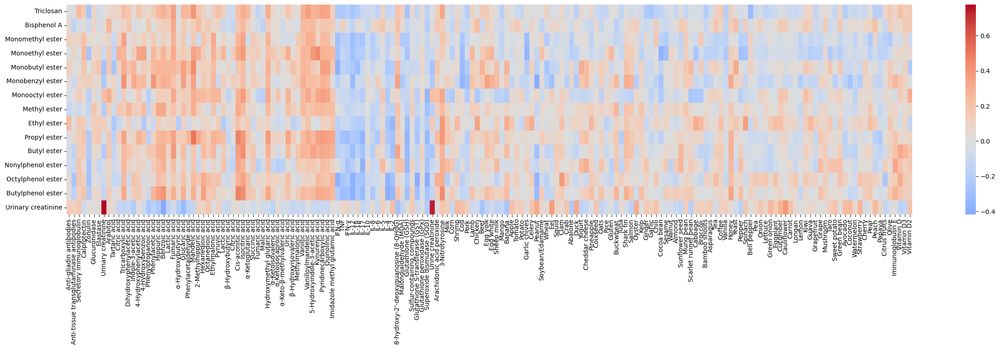

In [143]:
plt.figure(figsize=(30,6))
sns.heatmap(allheatdf2.T,cmap='coolwarm',center=0,)

plt.xticks([i+0.5 for i in range(len(allheatdf2.T.columns))],
           [eng_chi_dict[i] for i in allheatdf2.T.columns])
plt.yticks([i+0.5 for i in range(len(allheatdf2.T.index))],
           [eng_chi_dict[i] for i in allheatdf2.T.index])
plt.show()

In [97]:
allheatdf=pd.DataFrame()
for i in gut+organic_acid+cytokine+oxidative+foodallergy+VD:
    for j in Hormone:
        r,p=stats.spearmanr(alldata_pivot[i].fillna(0),alldata_pivot[j].fillna(0))
        if p<0.05:
            allheatdf.loc[i,j]=r

In [98]:
allheatdf

,甲酯,单甲基酯,单丁基酯,单苄基酯,单乙基己基酯,乙酯,丁酯,丁基苯酯,尿肌酐-1055,三氯沙,单乙基酯,丙酯,壬基苯酯,辛基苯酯,双酚A
分泌型免疫球蛋白,-0.285729,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
解连蛋白,0.258481,0.359162,0.289441,0.385755,0.240095,0.365196,0.245256,0.262832,0.270089,NaN,NaN,NaN,NaN,NaN,NaN
尿肌酐-1073,-0.323749,NaN,-0.312384,-0.354807,NaN,NaN,-0.407075,-0.418564,0.306701,-0.248597,-0.276802,-0.250807,-0.309347,-0.307541,NaN
45. 酒石酸,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.260571,NaN,NaN,NaN,NaN,NaN
43. 丙三羧酸,NaN,NaN,NaN,NaN,NaN,-0.292145,NaN,NaN,-0.295739,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
橄榄,0.389046,0.462241,0.371741,0.299431,0.433827,0.310701,0.420170,0.408939,0.318980,0.379762,0.364331,0.373686,0.449598,0.424555,0.429856
免疫球蛋白E,0.363664,0.484054,0.359127,0.290283,0.417952,0.285673,0.399496,0.390035,0.338288,0.388855,0.362160,0.357903,0.469270,0.407126,0.424846
维生素D,0.384970,0.486462,0.359433,0.296779,0.459575,0.310546,0.437270,0.413163,0.324480,0.410834,0.378199,0.375812,0.473582,0.446473,0.443258
维生素D3,0.383460,0.488918,0.365585,0.298371,0.451794,0.320585,0.436484,0.412711,0.318205,0.406052,0.379903,0.374028,0.463049,0.445057,0.433014


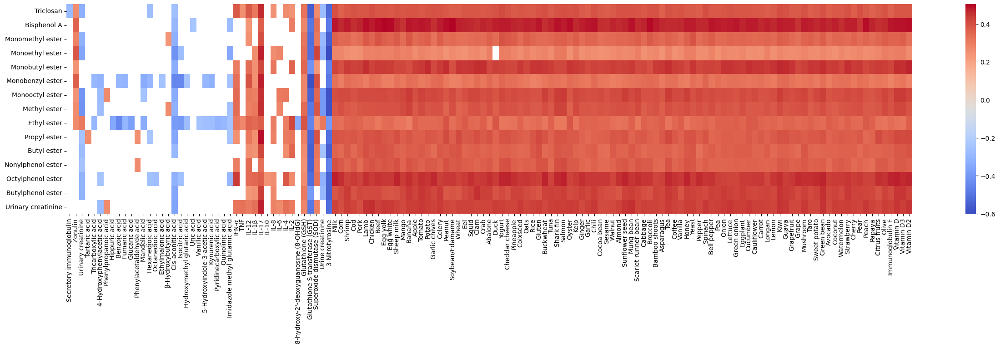

In [100]:
plt.figure(figsize=(30,6))
sns.heatmap(allheatdf.T,cmap='coolwarm')

plt.xticks([i+.5 for i in range(len(allheatdf.T.columns))],
           [eng_chi_dict[i] for i in allheatdf.T.columns])
plt.yticks([i+.5 for i in range(len(Hormone))],[eng_chi_dict[i] for i in Hormone])
plt.show()

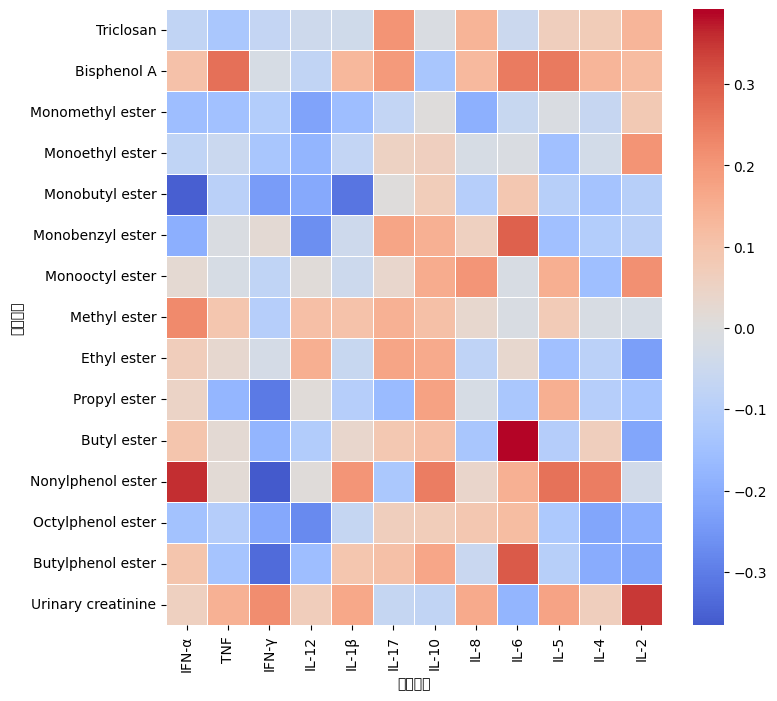

In [63]:
heatdf=alldata_pivot[gut+organic_acid+cytokine+oxidative+foodallergy+VD+Hormone].corr(method='spearman')
plt.figure(figsize=(8,8))
sns.heatmap(heatdf.loc[Hormone][cytokine],cmap='coolwarm',center=0,lw=.5)

plt.xticks([i+.5 for i in range(len(cytokine))],[eng_chi_dict[i] for i in cytokine])
plt.yticks([i+.5 for i in range(len(Hormone))],[eng_chi_dict[i] for i in Hormone])
plt.show()

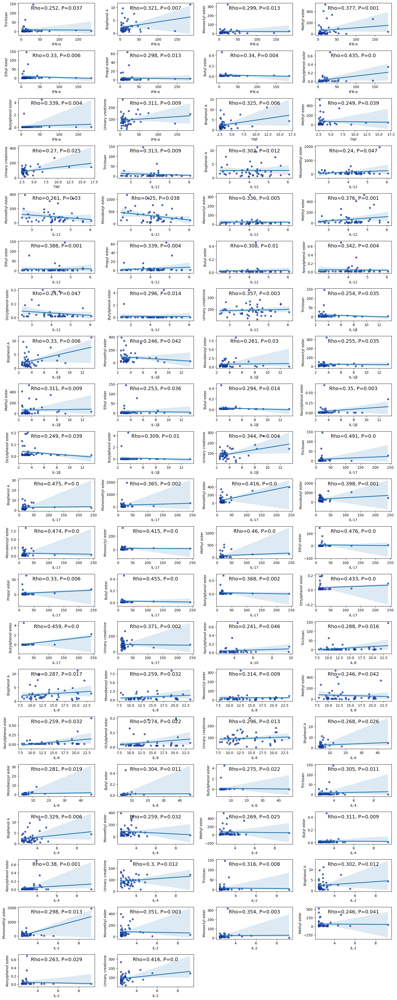

In [39]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns=Hormone
metabolites = cytokine
plt.figure(figsize=(16, 76))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(0),alldata_pivot[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(40,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=alldata_pivot,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])

            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

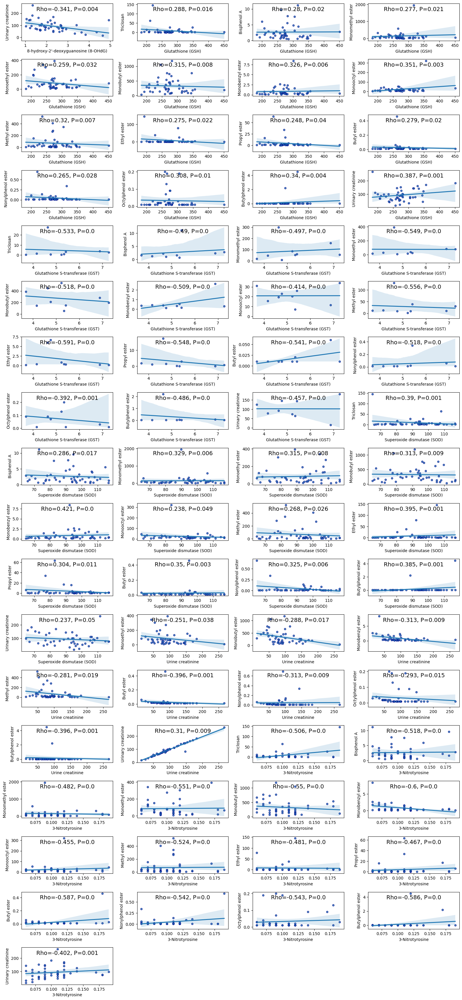

In [40]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns=Hormone
metabolites = oxidative
plt.figure(figsize=(16, 76))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(0),alldata_pivot[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(40,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=alldata_pivot,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])

            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns=Hormone
metabolites = oxidative
plt.figure(figsize=(16, 76))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(alldata_pivot[metabolite].fillna(0),alldata_pivot[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(40,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=alldata_pivot,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])

            plt.ylabel(eng_chi_dict[ados_col])
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

In [208]:
for i in tqdm(all_gene_set):
    mutls=list(dfall[dfall['combine']==i]['number'])
    alldata_pivot[i]='nonmutant'
    alldata_pivot.loc[  alldata_pivot[alldata_pivot['病历号'].isin(mutls)].index  , i] ='mut'
    

100%|██████████| 32/32 [00:00<00:00, 383.15it/s]


In [209]:
alldata_pivot

检测项目,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,chr1-16976193-16976193-C-T-MST1P2,chr2-85570186-85570186-G-A-RETSAT,chr1-145293269-145293269-G-A-NBPF25P,chr1-17008302-17008302-G-T-MIR3675,chr2-132292678-132292678-T-C-POTEKP,chr20-62959184-62959184-T-C-LINC00266-1,chr7-151882775-151882775-A-T-KMT2C,chr4-122997316-122997316-C-T-KIAA1109,chr1-148932713-148932713-C-T-LSP1P5,chr1-152188319-152188319-C-T-HRNR
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,TD_085,1.04,20.93,3.58,0.55,0.76,3.82,0.48,0.21,0.98,...,nonmutant,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
65,TD_086,1.42,7.87,1.79,0.26,0.51,4.25,0.31,0.28,0.93,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
66,TD_087,4.54,21.94,13.79,0.58,0.92,10.99,0.75,0.31,1.15,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant
67,TD_088,1.13,16.98,15.91,0.71,0.86,5.86,0.45,0.24,0.98,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant


In [210]:
alldata_pivot['type'] = alldata_pivot['病历号'].apply(lambda x: 'ASD' if 'ASD' in x else ('TD' if 'TD' in x else '其他'))

In [211]:
alldata_pivot

检测项目,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,chr2-85570186-85570186-G-A-RETSAT,chr1-145293269-145293269-G-A-NBPF25P,chr1-17008302-17008302-G-T-MIR3675,chr2-132292678-132292678-T-C-POTEKP,chr20-62959184-62959184-T-C-LINC00266-1,chr7-151882775-151882775-A-T-KMT2C,chr4-122997316-122997316-C-T-KIAA1109,chr1-148932713-148932713-C-T-LSP1P5,chr1-152188319-152188319-C-T-HRNR,type
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,TD_085,1.04,20.93,3.58,0.55,0.76,3.82,0.48,0.21,0.98,...,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD
65,TD_086,1.42,7.87,1.79,0.26,0.51,4.25,0.31,0.28,0.93,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD
66,TD_087,4.54,21.94,13.79,0.58,0.92,10.99,0.75,0.31,1.15,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD
67,TD_088,1.13,16.98,15.91,0.71,0.86,5.86,0.45,0.24,0.98,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD


In [212]:
path='/home2/zhenglijing/work/ADOS/true.csv'
dfados=pd.read_csv(path)
dfados

,index_column,Communication,social_interaction,stereotyped_behavior,ASD_total
0,ASD_051,5.0,3.0,0.0,13.0
1,ASD_052,3.0,5.0,0.0,14.0
2,ASD_053,3.0,13.0,4.0,45.0
3,ASD_055,2.0,10.0,0.0,19.0
4,ASD_056,23.0,14.0,5.0,84.0
5,ASD_057,15.0,12.0,1.0,64.0
6,ASD_058,7.0,10.0,2.0,35.0
7,ASD_060,13.0,15.0,5.0,70.0
8,ASD_063,14.0,5.0,5.0,46.0
9,ASD_064,22.0,14.0,3.0,77.0


In [215]:
dfados=dfados.rename({'index_column':'number'},axis=1)

In [216]:
alldata_pivot.columns = ['病历号'] + alldata_pivot.columns[1:].tolist()merged_df = pd.merge(alldata_pivot, dfados, left_on='病历号', right_on='number',)

merged_df = merged_df.drop(columns=['number'])

merged_df.head()

,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,chr20-62959184-62959184-T-C-LINC00266-1,chr7-151882775-151882775-A-T-KMT2C,chr4-122997316-122997316-C-T-KIAA1109,chr1-148932713-148932713-C-T-LSP1P5,chr1-152188319-152188319-C-T-HRNR,type,Communication,social_interaction,stereotyped_behavior,ASD_total
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD,5.0,3.0,0.0,13.0
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD,3.0,5.0,0.0,14.0
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD,3.0,13.0,4.0,45.0
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD,5.0,10.0,1.0,21.0
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD,2.0,10.0,0.0,19.0


In [50]:
merged_df=merged_df.drop(columns=['Unnamed: 0'])

In [51]:
merged_df

,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,chr2-132292678-132292678-T-C-POTEKP,chr20-62959184-62959184-T-C-LINC00266-1,chr7-151882775-151882775-A-T-KMT2C,chr4-122997316-122997316-C-T-KIAA1109,chr1-148932713-148932713-C-T-LSP1P5,chr1-152188319-152188319-C-T-HRNR,Communication,Interaction,Stereotype_Restrict,average_total
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,6.5,6.5,5.5,27.0
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,3.0,5.0,1.0,14.0
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,3.0,13.0,8.0,45.0
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,4.5,7.5,1.5,35.0
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,2.0,6.5,2.0,15.0
5,ASD_056,1.42,28.81,3.72,0.59,1.01,6.70,0.44,0.18,0.70,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,25.5,13.5,10.5,82.5
6,ASD_057,2.17,28.25,4.63,0.57,0.83,10.08,0.44,0.20,0.65,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,19.5,12.0,2.5,68.0
7,ASD_058,2.23,14.89,7.51,1.17,2.64,6.67,0.56,0.21,0.91,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,7.5,7.5,3.5,38.5
8,ASD_060,1.89,34.13,15.11,0.99,2.70,6.65,0.65,0.22,0.96,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,14.5,13.5,8.5,66.0
9,ASD_062,1.63,22.15,5.56,0.33,0.43,6.38,0.27,0.25,0.49,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,3.0,1.5,0.0,31.0


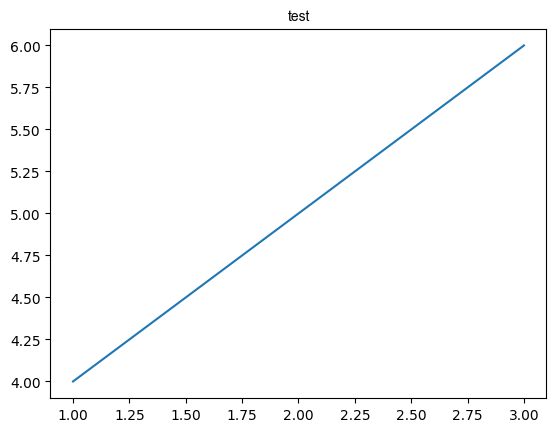

In [77]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

font_path = '/home2/zhenglijing/work/Arial.ttf'font = FontProperties(fname=font_path)

plt.plot([1, 2, 3], [4, 5, 6])
plt.title('test', fontproperties=font)
plt.show()

## LOC100133331

Cabbage


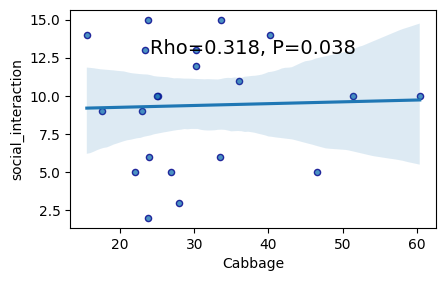

In [295]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['25. 犬尿喹啉酸',
  '包心菜',
  '竹笋' ]
plt.figure(figsize=(16,8))

count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])
            

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## MST1P2

Interferon-α
Interleukin-1β
Interleukin-4
Interleukin-4
Interleukin-4
Tissue transglutaminase antibody
Tissue transglutaminase antibody
Grape
Glutathione
Glutathione


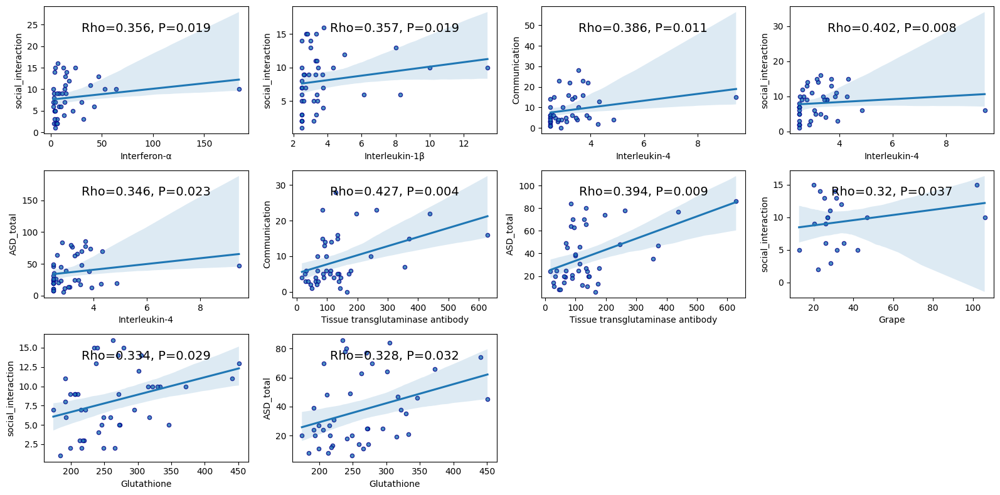

In [285]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['46. 阿拉伯糖醇', '6. β-羟基丁酸', '干扰素α', '白介素1β', 
               '白介素2', '白介素4', '白介素5', '白介素6', 
               '组织转麸胺酶抗体', '葡萄', '谷胱甘肽']
plt.figure(figsize=(16,8))

count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])
            

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

In [279]:
eng_chi_dict[metabolite]

'Glutathione'

## MIR509重复了

In [161]:
from scipy import stats

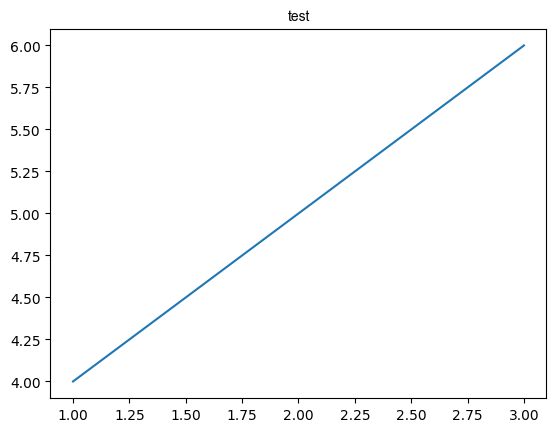

In [162]:
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

font_path = '/home2/zhenglijing/work/Arial.ttf'font = FontProperties(fname=font_path)

plt.plot([1, 2, 3], [4, 5, 6])
plt.title('test', fontproperties=font)
plt.show()

Citramalic acid
Citramalic acid
Citramalic acid
Citramalic acid
Butyl acetate


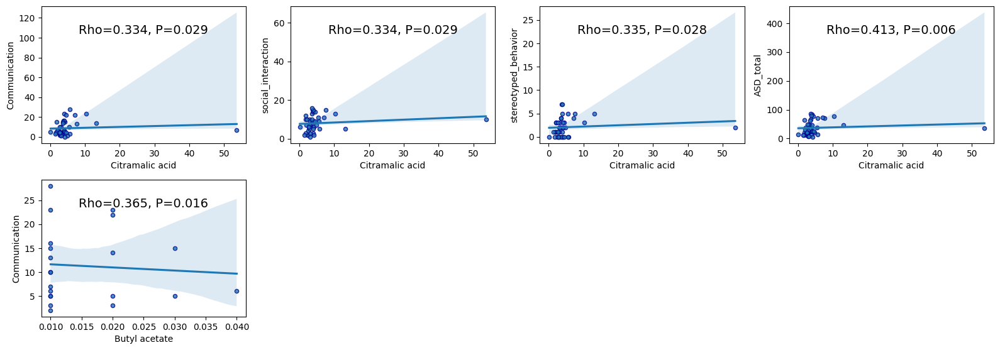

In [286]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['44. 柠苹酸', '丁酯','鱿鱼']
plt.figure(figsize=(16, 8))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## CEP120

In [110]:
from scipy import stats

Citramalic acid
Citramalic acid
Citramalic acid
Citramalic acid
Wheat
Wheat
Wheat
Glutathione
Glutathione


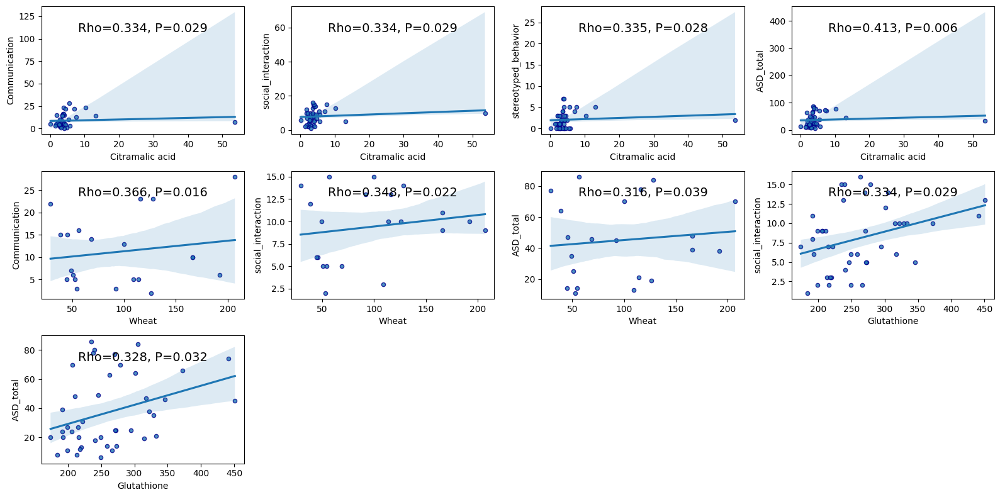

In [288]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['44. 柠苹酸','含硫化合物', '小麦', '谷胱甘肽']
plt.figure(figsize=(16, 8))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## NBPF25P

In [ ]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['29. 杏仁酸','30. 苯基乙醛酸']
plt.figure(figsize=(16, 6))
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):
        plt.subplot(2,4,i+4*j+1)
        sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
        plt.xlabel(eng_chi_dict[metabolite])
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
        plt.ylabel(ados_col)
plt.tight_layout()
plt.show()

## NBPF25P

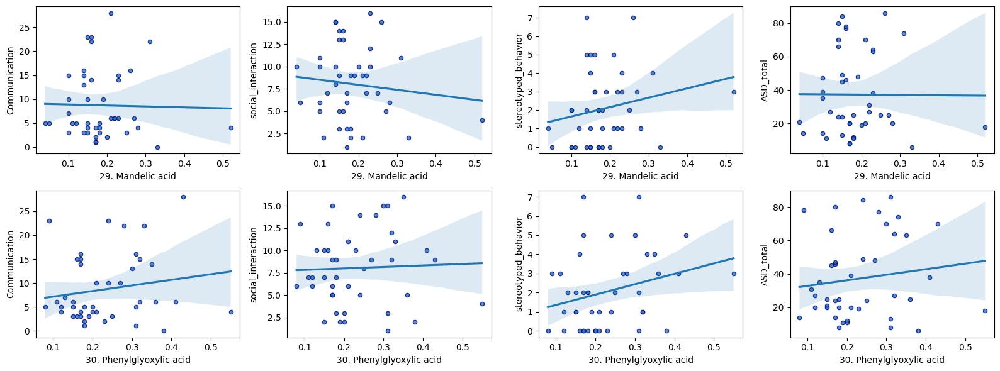

In [229]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['29. 杏仁酸','30. 苯基乙醛酸']
plt.figure(figsize=(16, 6))
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):
        plt.subplot(2,4,i+4*j+1)
        sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
        plt.xlabel(eng_chi_dict[metabolite])
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
        plt.ylabel(ados_col)
plt.tight_layout()
plt.show()

## LOC646652

Vanillylmandelic acid
Vanillylmandelic acid
2-Methylhippuric acid
Orotic acid
Orotic acid
Phenylacetic acid
Lactic acid
Lactic acid
Monobutyl ester
Monobutyl ester


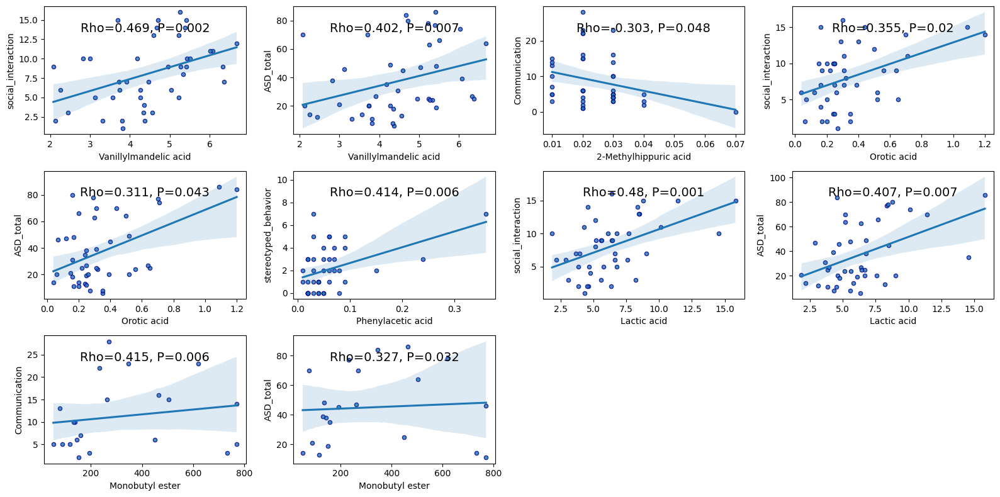

In [289]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['14. 羟甲基戊二酸', '23. 香草基扁桃酸', '28. 2-甲基马尿酸', '34. 乳清酸','37. 苯乙酸','5. 乳酸','单丁基酯','花生四烯酸过氧化物']
plt.figure(figsize=(16, 8))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## LOC646652

Vanillylmandelic acid
Vanillylmandelic acid
Glucaric acid
Glucaric acid
Orotic acid
Orotic acid
Monobutyl ester
Monobutyl ester
Monobenzyl ester
Monobenzyl ester
Monobenzyl ester
Honey
Salmon
Salmon


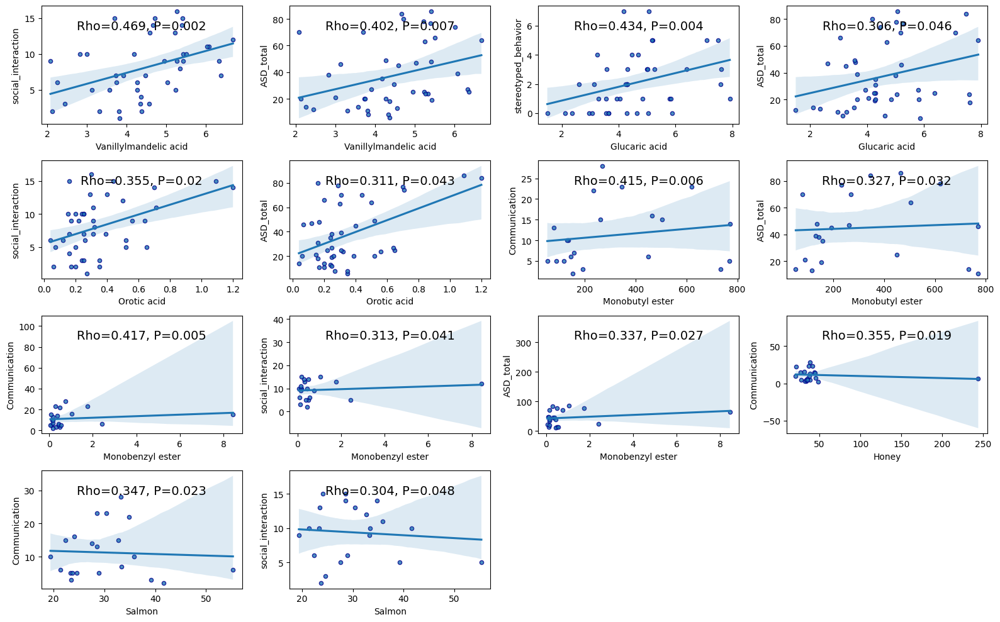

In [290]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['14. 羟甲基戊二酸',
  '23. 香草基扁桃酸',
  '31. 葡萄糖二酸',
  '33. 焦谷氨酸',
  '34. 乳清酸',
  '43. 丙三羧酸',
  '单丁基酯',
  '单苄基酯',
  '蜂蜜',
  '鲑鱼']
plt.figure(figsize=(16,10))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(4,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## MIR509

Citramalic acid
Citramalic acid
Citramalic acid
Citramalic acid
Butyl acetate


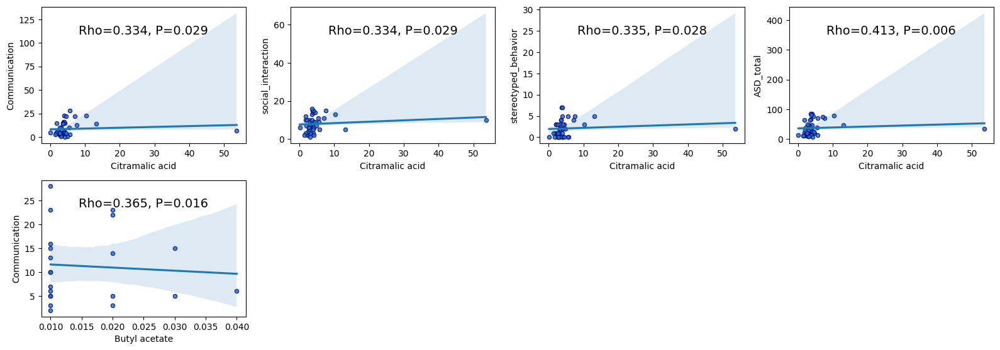

In [291]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['44. 柠苹酸','丁酯','鱿鱼']
plt.figure(figsize=(16, 8))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## LINC01138

2-Methylhippuric acid
Urine creatinine-1055


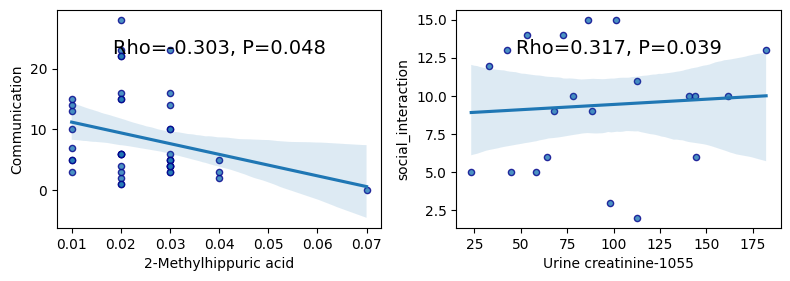

In [292]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['28. 2-甲基马尿酸','含硫化合物', '尿肌酐-1055','白介素8', '肿瘤坏死因子']
plt.figure(figsize=(16,8
                   ))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## FAM153CP

Interleukin-10
Interleukin-12
Interleukin-12
Interleukin-12


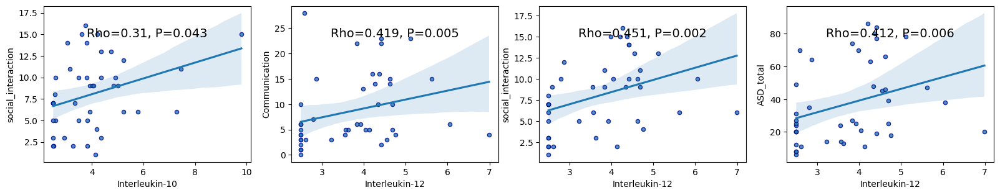

In [293]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['14. 羟甲基戊二酸',
  '26. 吡啶甲酸',
  '27. 喹啉酸',
  '39. 4-羟基苯甲酸',
  '8-羟基脱氧鸟苷',
  '分泌型免疫球蛋白',
  '白介素10',
  '白介素12',
  '谷胱甘肽过氧化物酶',
  '麦胶蛋白抗体' ]
plt.figure(figsize=(16,9))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## LNCRNA-ATB'

Monoethylhexyl ester
Interleukin-10
Superoxide dismutase
Superoxide dismutase
Salmon
Salmon


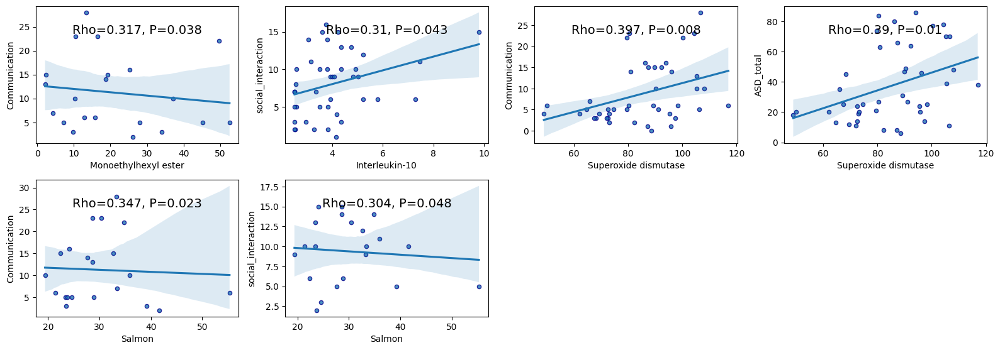

In [294]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['10. α-酮戊二酸',
  '4. 丙酮酸',
  '单乙基己基酯',
  '白介素10',
  '超氧化物歧化酶',
  '鲑鱼']
plt.figure(figsize=(16,8))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            print(eng_chi_dict[metabolite])

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## RETSAT

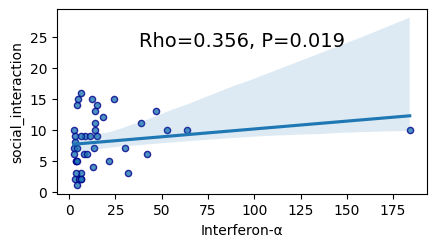

In [251]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['干扰素α',
  '胰弹性蛋白酶']
plt.figure(figsize=(16,7))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

## LNCRNA-ATB

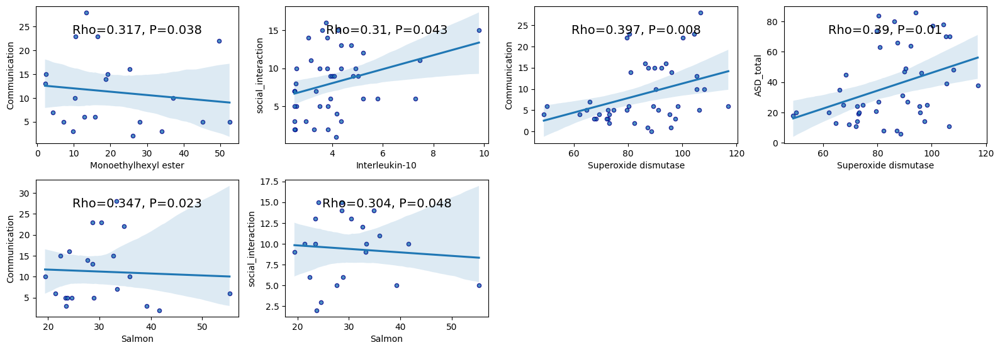

In [253]:
plt.rcParams['font.family'] = 'Arial'
ados_columns = ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']
metabolites = ['10. α-酮戊二酸','4. 丙酮酸','单乙基己基酯','白介素10', '超氧化物歧化酶','鲑鱼']
plt.figure(figsize=(16, 8))
count=1
for j,metabolite in enumerate(metabolites):
    for i,ados_col in enumerate(ados_columns):        
        r,p=stats.spearmanr(merged_df[metabolite].fillna(0),merged_df[ados_col].fillna(0))
        if p < 0.05:
            
            plt.subplot(3,4,count)
            count+=1
            
            sns.regplot(x=metabolite, y=ados_col, data=merged_df,scatter_kws={'s': 20,'edgecolor':'darkblue'})
            plt.xlabel(eng_chi_dict[metabolite])
            

            plt.ylabel(ados_col)
            plt.text(0.5, 0.8, f'Rho={round(r, 3)}, P={round(p, 3)}', 
                     fontsize=14, transform=plt.gca().transAxes, ha='center')
plt.tight_layout()
plt.show()

In [254]:
listA=[]
for i in merged_df.iloc[:,188:-4].columns:
    if len(merged_df[i].unique())>1:
        listA.append(i)

In [255]:
len(listA)

16

In [256]:
listA

['chrX-146341299-146341299-G-A-MIR509-3',
 'chr5-122737709-122737709-C-T-CEP120',
 'chr20-62959184-62959184-T-C-NONE',
 'chr1-143743325-143743325-C-A-LINC01138',
 'chr14-19807178-19807178-C-T-LINC01297-DUXAP10-NBEAP6',
 'chrX-146341299-146341299-G-A-MIR509-2',
 'chr5-177468720-177468720-C-G-FAM153CP',
 'chr5-34191582-34191582-G-A-LOC646652',
 'chr1-664468-664468-G-T-LOC100133331',
 'chrX-146341299-146341299-G-A-MIR509-1',
 'chr5-34190915-34190915-C-G-LOC646652',
 'chr14-19807178-19807178-C-T-LNCRNA-ATB',
 'chr1-16976193-16976193-C-T-MST1P2',
 'chr2-85570186-85570186-G-A-RETSAT',
 'chr20-62959184-62959184-T-C-LINC00266-1',
 'chr1-152188319-152188319-C-T-HRNR']

In [257]:
from statannotations.Annotator import Annotator

In [258]:
merged_df[gene]

0     nonmutant
1     nonmutant
2     nonmutant
3     nonmutant
4     nonmutant
5     nonmutant
6     nonmutant
7     nonmutant
8     nonmutant
9     nonmutant
10    nonmutant
11    nonmutant
12    nonmutant
13    nonmutant
14    nonmutant
15    nonmutant
16    nonmutant
17    nonmutant
18    nonmutant
19    nonmutant
20    nonmutant
21          mut
22    nonmutant
23    nonmutant
24    nonmutant
25    nonmutant
26    nonmutant
27    nonmutant
28    nonmutant
29    nonmutant
30    nonmutant
31    nonmutant
32    nonmutant
33    nonmutant
34    nonmutant
35    nonmutant
36    nonmutant
37    nonmutant
38    nonmutant
39    nonmutant
40    nonmutant
41    nonmutant
42    nonmutant
Name: chr1-152188319-152188319-C-T-HRNR, dtype: object

In [259]:
ls1

21    20.0
Name: average_total, dtype: float64

In [272]:
allpsls=[]
for gene in listA:
    for test in ['Communication', 'social_interaction', 'stereotyped_behavior', 'ASD_total']:
        ls1=merged_df[merged_df[gene]=='mut'][test].dropna()
        ls2=merged_df[merged_df[gene]!='mut'][test].dropna()
        _,p=stats.mannwhitneyu(ls1,ls2)
        allpsls.append([gene,test,_,p])

In [273]:
pd.DataFrame(allpsls)

,0,1,2,3
0,chrX-146341299-146341299-G-A-MIR509-3,Communication,103.5,0.805399
1,chrX-146341299-146341299-G-A-MIR509-3,social_interaction,88.5,0.439071
2,chrX-146341299-146341299-G-A-MIR509-3,stereotyped_behavior,68.5,0.133479
3,chrX-146341299-146341299-G-A-MIR509-3,ASD_total,76.0,0.226226
4,chr5-122737709-122737709-C-T-CEP120,Communication,137.0,0.728700
...,...,...,...,...
59,chr20-62959184-62959184-T-C-LINC00266-1,ASD_total,28.0,0.600153
60,chr1-152188319-152188319-C-T-HRNR,Communication,1.5,0.124195
61,chr1-152188319-152188319-C-T-HRNR,social_interaction,18.5,0.871525
62,chr1-152188319-152188319-C-T-HRNR,stereotyped_behavior,23.0,0.901943


In [274]:
pd.DataFrame(allpsls)[pd.DataFrame(allpsls)[3]<0.05]

,0,1,2,3


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

nonmutant vs. mut: Mann-Whitney-Wilcoxon test two-sided, P_val:7.287e-01 U_stat=1.150e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

nonmutant vs. mut: Mann-Whitney-Wilcoxon test two-sided, P_val:2.617e-01 U_stat=9.150e+01
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

nonmutant vs. mut: Mann-Whitney-Wilcoxon test two-sided, P_val:6.874e-01 U_stat=1.135e+02
p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p

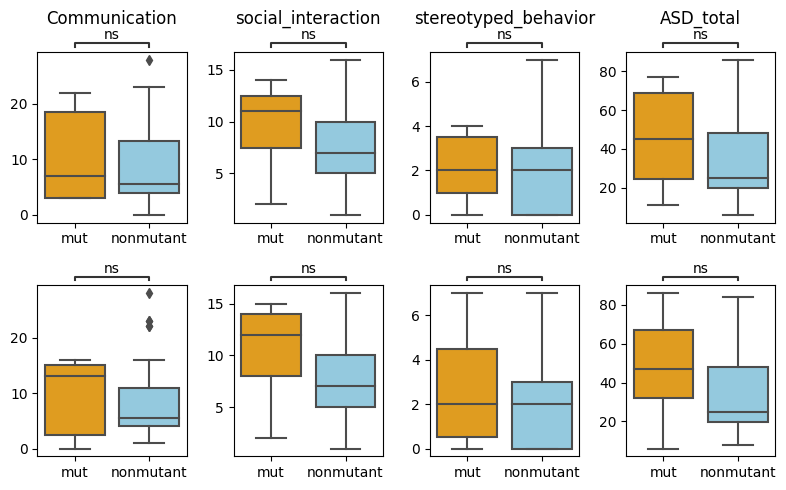

In [268]:
row_num=len([1,2])
plt.subplots(figsize=(8,5))
for j,i in enumerate(['chr5-122737709-122737709-C-T-CEP120', 'chr1-16976193-16976193-C-T-MST1P2',]):
    for count,test in enumerate(['Communication','social_interaction','stereotyped_behavior','ASD_total']):
        plt.subplot(row_num,4,4*j+count+1)
        ax=sns.boxplot(data=merged_df,x=i,y=test,palette=['orange','skyblue']
                      ,order=['mut','nonmutant'])
        plt.xlabel('')
        plt.ylabel('')
        if j<1:
            plt.title(test,pad=20)
        
        pairs=[('mut', 'nonmutant'),]
        annotator = Annotator(ax, pairs, data=merged_df, 
                              x=i, y=test,)
        annotator.configure(test='Mann-Whitney', text_format='star', loc='outside')
        annotator.apply_and_annotate()
plt.tight_layout()
plt.show()

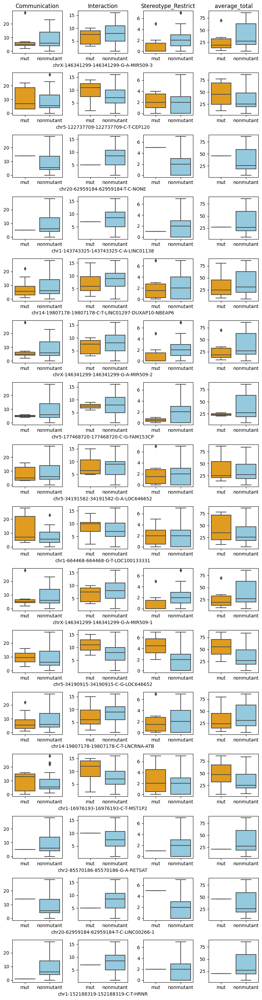

In [271]:
row_num=len(listA)
plt.subplots(figsize=(8,30))
for j,i in enumerate(listA):
    plt.subplot(row_num,4,4*j+1)
    ax=sns.boxplot(data=merged_df,x=i,y='Communication',palette=['orange','skyblue']
                  ,order=['mut','nonmutant'])
    plt.xlabel('')
    plt.ylabel('')
    if j<1:
        plt.title('Communication')
    plt.subplot(row_num,4,4*j+2)
    ax=sns.boxplot(data=merged_df,x=i,y='social_interaction',palette=['orange','skyblue']
                   ,order=['mut','nonmutant'])
    plt.ylabel('')
    if j<1:
        plt.title('Interaction')
    plt.subplot(row_num,4,4*j+3)
    ax=sns.boxplot(data=merged_df,x=i,y='stereotyped_behavior',palette=['orange','skyblue']
                   ,order=['mut','nonmutant'])
    plt.xlabel('')
    plt.ylabel('')
    if j<1:
        plt.title('Stereotype_Restrict')
    plt.subplot(row_num,4,4*j+4)
    ax=sns.boxplot(data=merged_df,x=i,y='ASD_total',palette=['orange','skyblue']
                   ,order=['mut','nonmutant'])
    plt.xlabel('')
    plt.ylabel('')
    if j<1:
        plt.title('average_total')
    
plt.tight_layout()

In [24]:
listgut=['麦胶蛋白抗体'
,'组织转麸胺酶抗体'
,'分泌型免疫球蛋白'
,'钙卫蛋白'
,'解连蛋白'
,'葡萄糖醛酸酶'
,'胰弹性蛋白酶']+list(alldata_pivot2.columns[187:220] )

NameError: name 'alldata_pivot2' is not defined

In [25]:
listimmune=['干扰素α',
'肿瘤坏死因子',
'干扰素γ',
'白介素12',
'白介素1β',
'白介素17',
'白介素10',
'白介素8',
'白介素6',
'白介素5',
'白介素4',
'白介素2']+list(alldata_pivot2.columns[187:220] )

NameError: name 'alldata_pivot2' is not defined

In [56]:
listacid=['尿肌酐-1073'
,'46. 阿拉伯糖醇'
,'45. 酒石酸'
,'44. 柠苹酸'
,'43. 丙三羧酸'
,'42. 二羟基苯丙酸'
,'41. 吲哚乙酸'
,'40. 4-羟基苯乙酸'
,'39. 4-羟基苯甲酸'
,'38. 苯丙酸'
,'37. 苯乙酸'
,'36. 马尿酸'
,'35. 苯甲酸'
,'34. 乳清酸'
,'33. 焦谷氨酸'
,'32. α-羟丁酸'
,'31. 葡萄糖二酸'
,'30. 苯基乙醛酸'
,'29. 杏仁酸'
,'28. 2-甲基马尿酸'
,'1. 己二酸'
,'2. 辛二酸'
,'3. 乙基丙二酸'
,'4. 丙酮酸'
,'5. 乳酸'
,'6. β-羟基丁酸'
,'7. 柠檬酸'
,'8. 顺式乌头酸'
,'9. 异柠檬酸'
,'10. α-酮戊二酸'
,'11. 琥珀酸'
,'12. 富马酸'
,'13. 苹果酸'
,'14. 羟甲基戊二酸'
,'15. α-酮异戊酸'
,'16. α-酮异己酸'
,'17. α-酮-β-甲基戊酸'
,'18. 黄尿酸'
,'19. β-羟基异戊酸'
,'20. 甲基丙二酸'
,'22. 高香草酸'
,'23. 香草基扁桃酸'
,'24. 5-羟吲哚乙酸'
,'25. 犬尿喹啉酸'
,'26. 吡啶甲酸'
,'27. 喹啉酸'
,'21. 亚胺甲基谷氨酸'
]+list(alldata_pivot2.columns[187:220] )

In [109]:
listoxi=[
    "8-羟基脱氧鸟苷",
    "丙二醛",
    "谷胱甘肽",
    "含硫化合物",
    "谷胱甘肽硫转移酶",
    "谷胱甘肽过氧化物酶",
    "超氧化物歧化酶",
    "尿肌酐-1131", 
    "花生四烯酸过氧化物",
    "硝化酪氨酸"
]+list(alldata_pivot2.columns[187:220] )

In [112]:
listenviro=[
    "三氯沙",
    "双酚A",
    "单甲基酯",
    "单乙基酯",
    "单丁基酯",
    "单苄基酯",
    "单乙基己基酯",
    "甲酯",
    "乙酯",
    "丙酯",
    "丁酯",
    "壬基苯酯",
    "辛基苯酯",
    "丁基苯酯",
    "尿肌酐-1055"]
+list(alldata_pivot2.columns[187:220] )

TypeError: bad operand type for unary +: 'list'

In [59]:
i

['chr5-34191582-G-A-LOC646652', '14. 羟甲基戊二酸', 0.003689594440782715]

In [18]:
alldata_pivot

检测项目,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,鲍鱼,鲑鱼,鳕鱼,鳗鱼,鸡肉,鸭肉,麦胶蛋白抗体,麸质,龙眼/桂圆,type
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,18.2,24.6,31.4,41.3,33.5,32.4,22.8,135.0,17.9,ASD
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,34.7,39.2,36.5,40.7,38.0,41.0,165.0,124.0,46.2,ASD
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,30.5,23.5,33.0,36.0,33.5,44.6,69.4,285.0,30.0,ASD
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,24.7,23.4,31.0,45.0,31.5,42.9,81.8,289.0,39.0,ASD
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,34.4,41.6,39.0,39.5,84.4,38.5,82.6,171.0,36.1,ASD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,TD_085,1.04,20.93,3.58,0.55,0.76,3.82,0.48,0.21,0.98,...,NaN,NaN,NaN,NaN,NaN,NaN,118.0,NaN,NaN,TD
65,TD_086,1.42,7.87,1.79,0.26,0.51,4.25,0.31,0.28,0.93,...,NaN,NaN,NaN,NaN,NaN,NaN,101.0,NaN,NaN,TD
66,TD_087,4.54,21.94,13.79,0.58,0.92,10.99,0.75,0.31,1.15,...,NaN,NaN,NaN,NaN,NaN,NaN,78.5,NaN,NaN,TD
67,TD_088,1.13,16.98,15.91,0.71,0.86,5.86,0.45,0.24,0.98,...,NaN,NaN,NaN,NaN,NaN,NaN,92.8,NaN,NaN,TD


In [63]:
i[0]

'chr5-34191582-G-A-LOC646652'

In [64]:
i[1]

'14. 羟甲基戊二酸'

In [78]:
alldata_pivot2[listgut]

,麦胶蛋白抗体,组织转麸胺酶抗体,分泌型免疫球蛋白,钙卫蛋白,解连蛋白,葡萄糖醛酸酶,胰弹性蛋白酶,chr5-34191582-G-A-LOC646652,chr1-16976193-C-T-MST1P2,chr14-19807178-C-T-LNCRNA-ATB,...,chrX-146341299-G-A-MIR509-3,chr5-122737709-C-T-CEP120,chrX-146341299-G-A-MIR509-1,chr1-664468-G-T-LOC100133331,chr3-39453515-A-G-RPSA,chr5-34190915-C-G-LOC646652,chr4-122997316-C-T-TRPC3,chr1-149287897-T-C-LOC644634,chr1-152188319-C-T-HRNR,type
0,22.8,173.0,1530.0,84.2,82.1,1597.0,171.0,nonmutant,nonmutant,mut,...,mut,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
1,165.0,62.1,626.0,91.9,84.4,1252.0,200.0,mut,nonmutant,mut,...,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
2,69.4,71.6,500.0,38.5,69.5,1379.0,125.0,nonmutant,mut,nonmutant,...,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
3,81.8,87.9,1403.0,34.9,171.0,1983.0,236.0,nonmutant,nonmutant,nonmutant,...,nonmutant,nonmutant,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
4,82.6,66.1,758.0,61.2,92.2,1415.0,218.0,nonmutant,mut,nonmutant,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,118.0,110.0,1284.0,130.0,105.0,1809.0,284.0,nonmutant,nonmutant,nonmutant,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD
65,101.0,163.0,1222.0,73.9,345.0,1098.0,261.0,nonmutant,nonmutant,nonmutant,...,nonmutant,nonmutant,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD
66,78.5,102.0,1048.0,113.0,126.0,6929.0,913.0,nonmutant,nonmutant,nonmutant,...,mut,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD
67,92.8,516.0,1089.0,131.0,191.0,1637.0,965.0,nonmutant,nonmutant,nonmutant,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,TD


In [79]:
listA

[['chr1-16976193-C-T-MST1P2', '组织转麸胺酶抗体', 0.01727431652980565],
 ['chr2-85570186-G-A-RETSAT', '胰弹性蛋白酶', 2.285328714509899e-06],
 ['chr5-177468720-C-G-FAM153CP', '分泌型免疫球蛋白', 0.024982326028262596],
 ['chr5-177468720-C-G-FAM153CP', '麦胶蛋白抗体', 5.608050049628168e-07]]

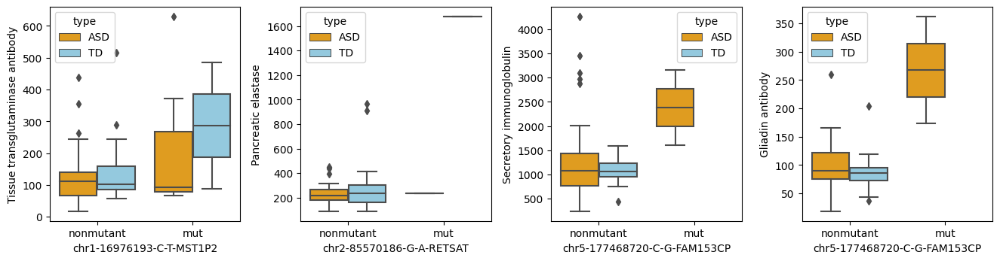

In [83]:
listA=[i for i in  modified_list if i[1] in listgut]
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[:18]):
    plt.subplot(3,6,j+1)
    ax=sns.boxplot(data=alldata_pivot2[listgut],x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(eng_chi_dict[ i[1] ])
    plt.tight_layout()

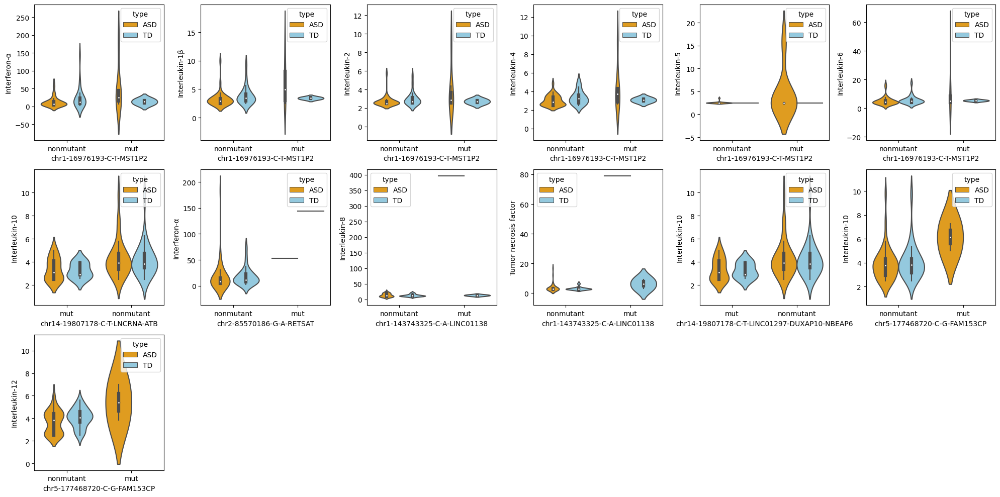

In [86]:
listA=[i for i in  modified_list if i[1] in listimmune]
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[:18]):
    plt.subplot(3,6,j+1)
    ax=sns.violinplot(data=alldata_pivot2[listimmune],x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(eng_chi_dict[ i[1] ])
    plt.tight_layout()

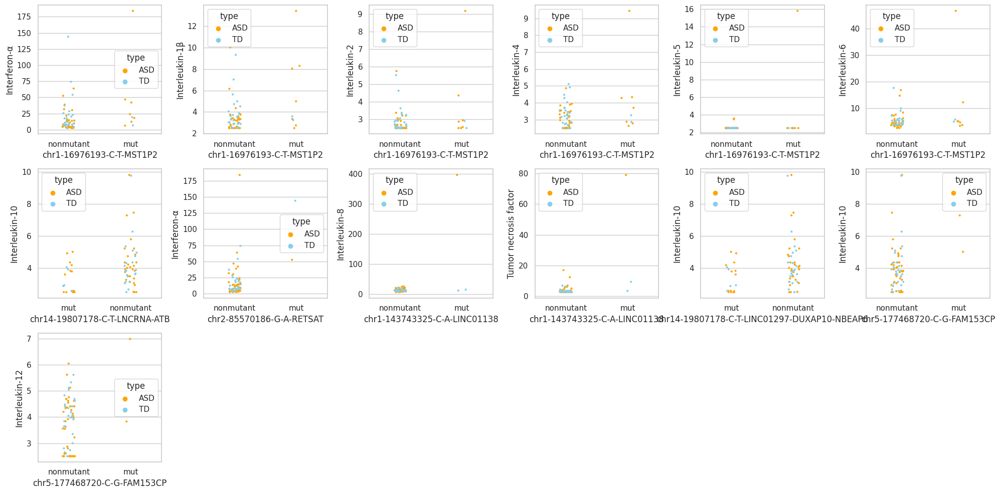

In [97]:
listA=[i for i in  modified_list if i[1] in listimmune]
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[:18]):
    plt.subplot(3,6,j+1)
    ax=sns.stripplot(data=alldata_pivot2[listimmune],x=i[0],y=i[1],hue='type',palette=['orange','skyblue'],size=3)
    plt.ylabel(eng_chi_dict[ i[1] ])
    plt.tight_layout()

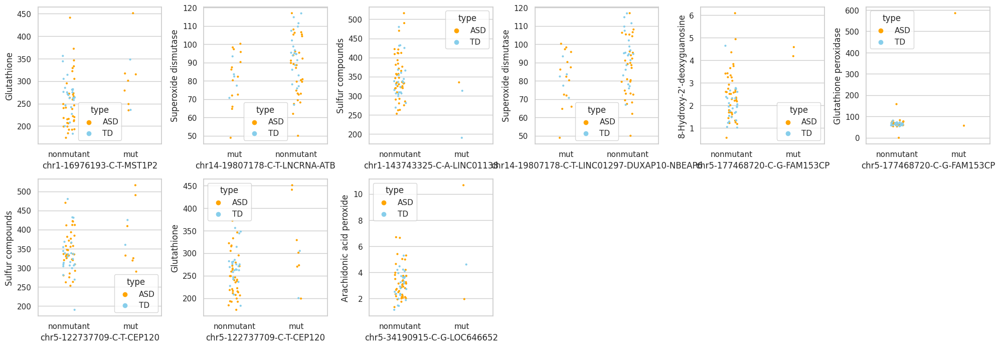

In [105]:
listA=[i for i in  modified_list if i[1] in listoxi]
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[:18]):
    plt.subplot(3,6,j+1)
    ax=sns.stripplot(data=alldata_pivot2[listoxi],x=i[0],y=i[1],hue='type',palette=['orange','skyblue'],size=3)
    plt.ylabel(eng_chi_dict[ i[1] ])
    plt.tight_layout()

In [99]:
listA

[['chr5-34191582-G-A-LOC646652', '14. 羟甲基戊二酸', 0.003689594440782715],
 ['chr5-34191582-G-A-LOC646652', '23. 香草基扁桃酸', 0.007985922771510829],
 ['chr5-34191582-G-A-LOC646652', '31. 葡萄糖二酸', 0.043890472371681595],
 ['chr5-34191582-G-A-LOC646652', '33. 焦谷氨酸', 0.04725408797730143],
 ['chr5-34191582-G-A-LOC646652', '34. 乳清酸', 0.006466559265108111],
 ['chr5-34191582-G-A-LOC646652', '43. 丙三羧酸', 2.995546099344879e-06],
 ['chr1-16976193-C-T-MST1P2', '46. 阿拉伯糖醇', 0.016871958040277996],
 ['chr1-16976193-C-T-MST1P2', '6. β-羟基丁酸', 0.016146897766476084],
 ['chr14-19807178-C-T-LNCRNA-ATB', '10. α-酮戊二酸', 0.0028641164885696733],
 ['chr14-19807178-C-T-LNCRNA-ATB', '4. 丙酮酸', 0.00018728288601598786],
 ['chr1-143743325-C-A-LINC01138', '28. 2-甲基马尿酸', 0.004715111943086544],
 ['chr14-19807178-C-T-LINC01297-DUXAP10-NBEAP6',
  '10. α-酮戊二酸',
  0.0028641164885696733],
 ['chr14-19807178-C-T-LINC01297-DUXAP10-NBEAP6',
  '4. 丙酮酸',
  0.00018728288601598786],
 ['chrX-146341299-G-A-MIR509-2', '44. 柠苹酸', 0.0295744938150792

In [100]:
len(listA)

30

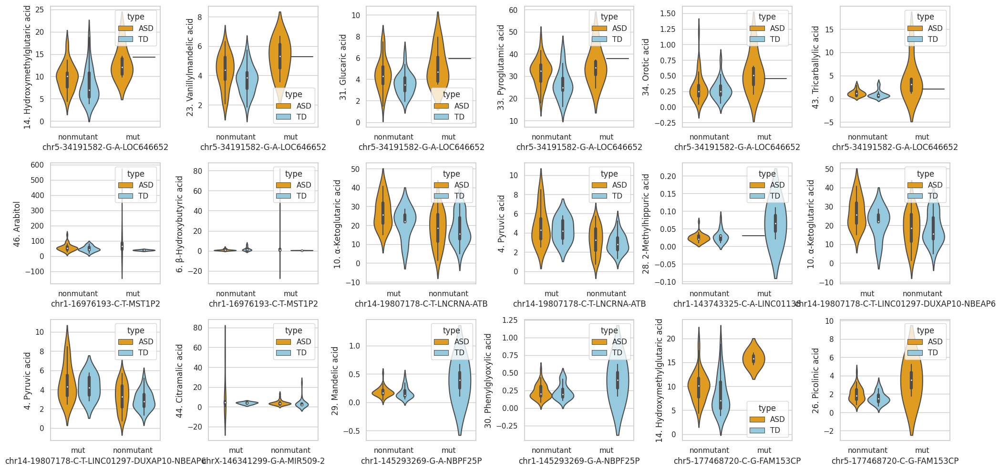

In [98]:
listA=[i for i in  modified_list if i[1] in listacid]
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[:18]):
    plt.subplot(3,6,j+1)
    ax=sns.violinplot(data=alldata_pivot2[listacid],x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(eng_chi_dict[ i[1] ])
    plt.tight_layout()

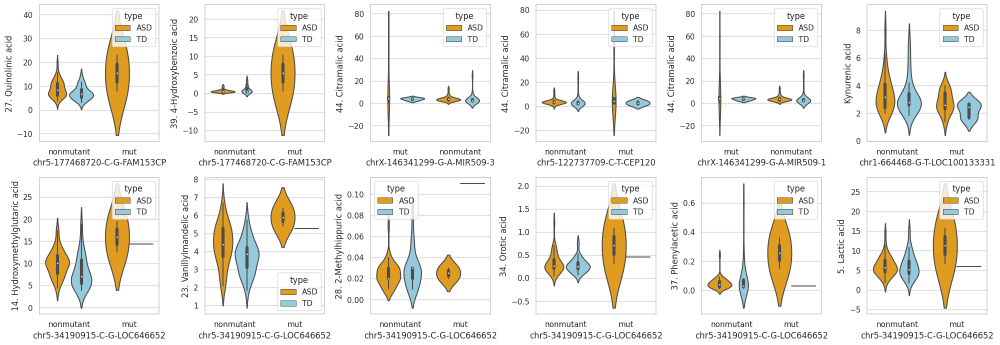

In [107]:
listA=[i for i in  modified_list if i[1] in listacid]
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[18:30]):
    plt.subplot(3,6,j+1)
    ax=sns.violinplot(data=alldata_pivot2[listacid],x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(eng_chi_dict[ i[1] ])
    plt.tight_layout()

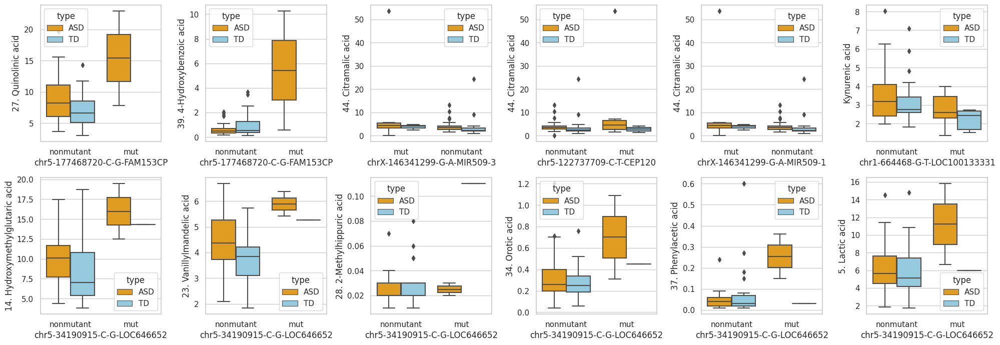

In [103]:
listA=[i for i in  modified_list if i[1] in listacid]
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[:18]):
    plt.subplot(3,6,j+1)
    ax=sns.boxplot(data=alldata_pivot2[listacid],x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(eng_chi_dict[ i[1] ])
    plt.tight_layout()

In [17]:
alldata_pivot.columns[1:187] 

Index(['1. 己二酸', '10. α-酮戊二酸', '11. 琥珀酸', '12. 富马酸', '13. 苹果酸', '14. 羟甲基戊二酸',
       '15. α-酮异戊酸', '16. α-酮异己酸', '17. α-酮-β-甲基戊酸', '18. 黄尿酸',
       ...
       '鱿鱼', '鲍鱼', '鲑鱼', '鳕鱼', '鳗鱼', '鸡肉', '鸭肉', '麦胶蛋白抗体', '麸质', '龙眼/桂圆'],
      dtype='object', name='检测项目', length=186)

In [18]:
alldata_pivot.columns[187:220] 

Index(['chr5-34191582-34191582-G-A-LOC646652',
       'chr1-16976193-16976193-C-T-MST1P2',
       'chr14-19807178-19807178-C-T-LNCRNA-ATB',
       'chr2-87866525-87866525-G-A-CYTOR', 'chr2-85570186-85570186-G-A-RETSAT',
       'chr2-87866525-87866525-G-A-MIR4435-1',
       'chr1-17008302-17008302-G-T-MIR3675',
       'chr1-148932713-148932713-C-T-NBPF25P',
       'chr1-143743325-143743325-C-A-LINC01138',
       'chr15-21936464-21936464-C-T-LOC646214',
       'chr14-19807178-19807178-C-T-LINC01297-DUXAP10-NBEAP6',
       'chr2-132292678-132292678-T-C-POTEKP',
       'chr20-62959184-62959184-T-C-NONE', 'chr5-824541-824541-A-C-ZDHHC11',
       'chr4-122997316-122997316-C-T-KIAA1109',
       'chr6-26866905-26866905-G-C-GUSBP2',
       'chrX-146341299-146341299-G-A-MIR509-2',
       'chr1-148932713-148932713-C-T-LSP1P5',
       'chr7-151882775-151882775-A-T-KMT2C',
       'chr1-145293269-145293269-G-A-NBPF25P',
       'chr20-62959184-62959184-T-C-LINC00266-1',
       'chr2-132292678-1322926

In [110]:
alldata_pivot2=alldata_pivot.copy()

In [50]:
columns[186]

'龙眼/桂圆'

In [111]:
columns = alldata_pivot2.columns.tolist()

for i in range(186, 220):                             
    new_column_name = '-'.join(columns[i].split('-')[:2] + columns[i].split('-')[3:])
    columns[i] = new_column_name

alldata_pivot2.columns = columns

alldata_pivot2.head()

,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,chrX-146341299-G-A-MIR509-3,chr5-122737709-C-T-CEP120,chrX-146341299-G-A-MIR509-1,chr1-664468-G-T-LOC100133331,chr3-39453515-A-G-RPSA,chr5-34190915-C-G-LOC646652,chr4-122997316-C-T-TRPC3,chr1-149287897-T-C-LOC644634,chr1-152188319-C-T-HRNR,type
0,ASD_051,1.87,33.93,6.95,0.37,0.63,10.62,0.47,0.24,0.68,...,mut,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
1,ASD_052,2.77,20.57,7.80,0.41,0.99,9.85,0.45,0.34,0.49,...,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
2,ASD_053,2.38,7.64,7.58,0.22,0.36,9.21,0.32,0.22,0.44,...,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
3,ASD_054,1.35,7.81,5.75,0.39,0.27,6.66,0.32,0.19,0.55,...,nonmutant,nonmutant,nonmutant,mut,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD
4,ASD_055,2.57,16.94,12.35,0.47,0.54,10.66,0.35,0.24,0.66,...,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,nonmutant,ASD


In [22]:
import pandas as pd
from scipy import stats


gene_sites = alldata_pivot.columns[187:220]indicators = alldata_pivot.columns[1:187]
df=alldata_pivot
t_test_results = {}

for gene_site in gene_sites:
    mutant_data = df[df[gene_site] == 'mut']#.drop(columns=gene_sites + ['type'])
    nonmutant_data = df[df[gene_site] == 'nonmutant']#.drop(columns=gene_sites + ['type'])
    
    gene_site_results = {}
    
    for indicator in indicators:
        mutant_indicator_data = mutant_data[indicator].dropna()
        nonmutant_indicator_data = nonmutant_data[indicator].dropna()
        
        if len(mutant_indicator_data) > 1 and len(nonmutant_indicator_data) > 1:
            t_stat, p_value = stats.ttest_ind(mutant_indicator_data, nonmutant_indicator_data)
            gene_site_results[indicator] = {'t_stat': t_stat, 'p_value': p_value}
        else:
            gene_site_results[indicator] = {'t_stat': None, 'p_value': None}
    
    t_test_results[gene_site] = gene_site_results

'''for gene_site, results in t_test_results.items():
    print(f"Gene Site: {gene_site}")
    for indicator, stats in results.items():
        print(f"  Indicator: {indicator}, t-stat: {stats['t_stat']}, p-value: {stats['p_value']}")'''

'# 打印t检验结果\nfor gene_site, results in t_test_results.items():\n    print(f"Gene Site: {gene_site}")\n    for indicator, stats in results.items():\n        print(f"  Indicator: {indicator}, t-stat: {stats[\'t_stat\']}, p-value: {stats[\'p_value\']}")'

In [23]:
df[df['chr4-122997316-122997316-C-T-KIAA1109']=='mut']

检测项目,病历号,1. 己二酸,10. α-酮戊二酸,11. 琥珀酸,12. 富马酸,13. 苹果酸,14. 羟甲基戊二酸,15. α-酮异戊酸,16. α-酮异己酸,17. α-酮-β-甲基戊酸,...,chrX-146341299-146341299-G-A-MIR509-3,chr5-122737709-122737709-C-T-CEP120,chrX-146341299-146341299-G-A-MIR509-1,chr1-664468-664468-G-T-LOC100133331,chr3-39453515-39453515-A-G-RPSA,chr5-34190915-34190915-C-G-LOC646652,chr4-122997316-122997316-C-T-TRPC3,chr1-149287897-149287897-T-C-LOC644634,chr1-152188319-152188319-C-T-HRNR,type


In [24]:
t_test_results

{'chr5-34191582-34191582-G-A-LOC646652': {'1. 己二酸': {'t_stat': 0.4573598622585101,
   'p_value': 0.6488920332050738},
  '10. α-酮戊二酸': {'t_stat': -0.2175674183168703, 'p_value': 0.8284274022889914},
  '11. 琥珀酸': {'t_stat': 0.345824099016992, 'p_value': 0.730558455948593},
  '12. 富马酸': {'t_stat': -0.5342818994992787, 'p_value': 0.5949149872350907},
  '13. 苹果酸': {'t_stat': -0.4845297602382788, 'p_value': 0.6295902128792535},
  '14. 羟甲基戊二酸': {'t_stat': 3.009128506004514, 'p_value': 0.003689594440782715},
  '15. α-酮异戊酸': {'t_stat': -0.6121946121570083, 'p_value': 0.5424811209861979},
  '16. α-酮异己酸': {'t_stat': -0.08965087038502631,
   'p_value': 0.9288321195317715},
  '17. α-酮-β-甲基戊酸': {'t_stat': -1.3249056699303525,
   'p_value': 0.1897034480419278},
  '18. 黄尿酸': {'t_stat': -1.0314998283178, 'p_value': 0.30601568641359267},
  '19. β-羟基异戊酸': {'t_stat': -0.11311572534801463,
   'p_value': 0.9102770584162425},
  '2. 辛二酸': {'t_stat': 0.3673627972359583, 'p_value': 0.7145062792777179},
  '20. 甲

In [25]:

significant_results = {}

for gene_site, indicator_results in t_test_results.items():
    significant_indicators = {}
    
    for indicator, stats in indicator_results.items():
        if str(stats['p_value']) !='None':
            if stats['p_value'] < 0.05:
                significant_indicators[indicator] = stats
    
    if significant_indicators:
        significant_results[gene_site] = significant_indicators

"""for gene_site, indicators in significant_results.items():
    print(f"Gene Site: {gene_site}")
    for indicator, stats in indicators.items():
        print(f"  Indicator: {indicator}, p-value: {stats['p_value']}")"""

'# 打印筛选后的显著结果\nfor gene_site, indicators in significant_results.items():\n    print(f"Gene Site: {gene_site}")\n    for indicator, stats in indicators.items():\n        print(f"  Indicator: {indicator}, p-value: {stats[\'p_value\']}")'

In [26]:
significant_results

{'chr5-34191582-34191582-G-A-LOC646652': {'14. 羟甲基戊二酸': {'t_stat': 3.009128506004514,
   'p_value': 0.003689594440782715},
  '23. 香草基扁桃酸': {'t_stat': 2.734495135003067, 'p_value': 0.007985922771510829},
  '31. 葡萄糖二酸': {'t_stat': 2.053901467723724, 'p_value': 0.043890472371681595},
  '33. 焦谷氨酸': {'t_stat': 2.0212291217026968, 'p_value': 0.04725408797730143},
  '34. 乳清酸': {'t_stat': 2.81120740691815, 'p_value': 0.006466559265108111},
  '43. 丙三羧酸': {'t_stat': 5.100186051939329, 'p_value': 2.995546099344879e-06},
  '单丁基酯': {'t_stat': 3.448955996619391, 'p_value': 0.0012328638803738268},
  '单苄基酯': {'t_stat': 4.49834490197051, 'p_value': 4.7856160822468085e-05},
  '蜂蜜': {'t_stat': 2.2743240854157074, 'p_value': 0.03472920026833136},
  '鲑鱼': {'t_stat': 2.2483164741905233, 'p_value': 0.03661843950738419}},
 'chr1-16976193-16976193-C-T-MST1P2': {'46. 阿拉伯糖醇': {'t_stat': 2.450762717458588,
   'p_value': 0.016871958040277996},
  '6. β-羟基丁酸': {'t_stat': 2.4679924768658927, 'p_value': 0.016146897766

In [27]:
result_list = []
 
for gene_site, indicators in significant_results.items():
    for indicator, stats in indicators.items():
        result_list.append([gene_site, indicator, stats['p_value']])
 
for item in result_list:
    print(item)

['chr5-34191582-34191582-G-A-LOC646652', '14. 羟甲基戊二酸', 0.003689594440782715]
['chr5-34191582-34191582-G-A-LOC646652', '23. 香草基扁桃酸', 0.007985922771510829]
['chr5-34191582-34191582-G-A-LOC646652', '31. 葡萄糖二酸', 0.043890472371681595]
['chr5-34191582-34191582-G-A-LOC646652', '33. 焦谷氨酸', 0.04725408797730143]
['chr5-34191582-34191582-G-A-LOC646652', '34. 乳清酸', 0.006466559265108111]
['chr5-34191582-34191582-G-A-LOC646652', '43. 丙三羧酸', 2.995546099344879e-06]
['chr5-34191582-34191582-G-A-LOC646652', '单丁基酯', 0.0012328638803738268]
['chr5-34191582-34191582-G-A-LOC646652', '单苄基酯', 4.7856160822468085e-05]
['chr5-34191582-34191582-G-A-LOC646652', '蜂蜜', 0.03472920026833136]
['chr5-34191582-34191582-G-A-LOC646652', '鲑鱼', 0.03661843950738419]
['chr1-16976193-16976193-C-T-MST1P2', '46. 阿拉伯糖醇', 0.016871958040277996]
['chr1-16976193-16976193-C-T-MST1P2', '6. β-羟基丁酸', 0.016146897766476084]
['chr1-16976193-16976193-C-T-MST1P2', '干扰素α', 0.029013268245950925]
['chr1-16976193-16976193-C-T-MST1P2', '白介素1β', 0.00

In [28]:
modified_list = [
    [
        '-'.join(part.split('-')[:2] + part.split('-')[3:]),        desc,
        value
    ]
    for part, desc, value in result_list
]

modified_list

[['chr5-34191582-G-A-LOC646652', '14. 羟甲基戊二酸', 0.003689594440782715],
 ['chr5-34191582-G-A-LOC646652', '23. 香草基扁桃酸', 0.007985922771510829],
 ['chr5-34191582-G-A-LOC646652', '31. 葡萄糖二酸', 0.043890472371681595],
 ['chr5-34191582-G-A-LOC646652', '33. 焦谷氨酸', 0.04725408797730143],
 ['chr5-34191582-G-A-LOC646652', '34. 乳清酸', 0.006466559265108111],
 ['chr5-34191582-G-A-LOC646652', '43. 丙三羧酸', 2.995546099344879e-06],
 ['chr5-34191582-G-A-LOC646652', '单丁基酯', 0.0012328638803738268],
 ['chr5-34191582-G-A-LOC646652', '单苄基酯', 4.7856160822468085e-05],
 ['chr5-34191582-G-A-LOC646652', '蜂蜜', 0.03472920026833136],
 ['chr5-34191582-G-A-LOC646652', '鲑鱼', 0.03661843950738419],
 ['chr1-16976193-C-T-MST1P2', '46. 阿拉伯糖醇', 0.016871958040277996],
 ['chr1-16976193-C-T-MST1P2', '6. β-羟基丁酸', 0.016146897766476084],
 ['chr1-16976193-C-T-MST1P2', '干扰素α', 0.029013268245950925],
 ['chr1-16976193-C-T-MST1P2', '白介素1β', 0.0030851940199071457],
 ['chr1-16976193-C-T-MST1P2', '白介素2', 0.030696710735637275],
 ['chr1-16976193-C

In [29]:
df=pd.DataFrame(result_list)

In [30]:
df.to_csv('/home2/zhenglijing/work/SNP_bcf/dele_AD/t_testgene_deleend.csv',encoding="GBK")

In [31]:
path='/home2/zhenglijing/work/SNP_bcf/dele_AD/t_testgene_deleend.csv'
df=pd.read_csv(path,encoding="GBK")
df = df.drop(columns=['Unnamed: 0'])
df

,0,1,2
0,chr5-34191582-34191582-G-A-LOC646652,14. 羟甲基戊二酸,0.003690
1,chr5-34191582-34191582-G-A-LOC646652,23. 香草基扁桃酸,0.007986
2,chr5-34191582-34191582-G-A-LOC646652,31. 葡萄糖二酸,0.043890
3,chr5-34191582-34191582-G-A-LOC646652,33. 焦谷氨酸,0.047254
4,chr5-34191582-34191582-G-A-LOC646652,34. 乳清酸,0.006467
...,...,...,...
71,chr5-34190915-34190915-C-G-LOC646652,34. 乳清酸,0.015385
72,chr5-34190915-34190915-C-G-LOC646652,37. 苯乙酸,0.020989
73,chr5-34190915-34190915-C-G-LOC646652,5. 乳酸,0.046757
74,chr5-34190915-34190915-C-G-LOC646652,单丁基酯,0.004338


In [32]:
path='/home2/zhenglijing/work/SNP_bcf/dele_AD/t_testgene.csv'
df=pd.read_csv(path,encoding="GBK")
df = df.drop(columns=['Unnamed: 0'])
df = df.drop(columns=['Unnamed: 0.1'])
df

,0,1,2
0,chr1-664468-664468-G-T-LOC100133331,25. 犬尿喹啉酸,0.031196
1,chr1-664468-664468-G-T-LOC100133331,包心菜,0.039145
2,chr1-664468-664468-G-T-LOC100133331,竹笋,0.042495
3,chrX-146341299-146341299-G-A-MIR509-1,44. 柠苹酸,0.029574
4,chrX-146341299-146341299-G-A-MIR509-1,丁酯,0.017271
...,...,...,...
71,chr14-19807178-19807178-C-T-LINC01297-DUXAP10-...,白介素10,0.017874
72,chr14-19807178-19807178-C-T-LINC01297-DUXAP10-...,超氧化物歧化酶,0.046592
73,chr14-19807178-19807178-C-T-LINC01297-DUXAP10-...,鲑鱼,0.020050
74,chr2-85570186-85570186-G-A-RETSAT,干扰素α,0.000069


In [33]:
import pandas as pd

def remove_third_part(s):
    parts = s.split('-')
    if len(parts) > 2:
        del parts[2]
    return '-'.join(parts)

df['0'] = df['0'].apply(remove_third_part)

df

,0,1,2
0,chr1-664468-G-T-LOC100133331,25. 犬尿喹啉酸,0.031196
1,chr1-664468-G-T-LOC100133331,包心菜,0.039145
2,chr1-664468-G-T-LOC100133331,竹笋,0.042495
3,chrX-146341299-G-A-MIR509-1,44. 柠苹酸,0.029574
4,chrX-146341299-G-A-MIR509-1,丁酯,0.017271
...,...,...,...
71,chr14-19807178-C-T-LINC01297-DUXAP10-NBEAP6,白介素10,0.017874
72,chr14-19807178-C-T-LINC01297-DUXAP10-NBEAP6,超氧化物歧化酶,0.046592
73,chr14-19807178-C-T-LINC01297-DUXAP10-NBEAP6,鲑鱼,0.020050
74,chr2-85570186-G-A-RETSAT,干扰素α,0.000069


In [34]:
[i[1] for i in result_list]

['14. 羟甲基戊二酸',
 '23. 香草基扁桃酸',
 '31. 葡萄糖二酸',
 '33. 焦谷氨酸',
 '34. 乳清酸',
 '43. 丙三羧酸',
 '单丁基酯',
 '单苄基酯',
 '蜂蜜',
 '鲑鱼',
 '46. 阿拉伯糖醇',
 '6. β-羟基丁酸',
 '干扰素α',
 '白介素1β',
 '白介素2',
 '白介素4',
 '白介素5',
 '白介素6',
 '组织转麸胺酶抗体',
 '葡萄',
 '谷胱甘肽',
 '10. α-酮戊二酸',
 '4. 丙酮酸',
 '单乙基己基酯',
 '白介素10',
 '超氧化物歧化酶',
 '鲑鱼',
 '干扰素α',
 '胰弹性蛋白酶',
 '28. 2-甲基马尿酸',
 '含硫化合物',
 '尿肌酐-1055',
 '白介素8',
 '肿瘤坏死因子',
 '10. α-酮戊二酸',
 '4. 丙酮酸',
 '单乙基己基酯',
 '白介素10',
 '超氧化物歧化酶',
 '鲑鱼',
 '44. 柠苹酸',
 '丁酯',
 '鱿鱼',
 '29. 杏仁酸',
 '30. 苯基乙醛酸',
 '14. 羟甲基戊二酸',
 '26. 吡啶甲酸',
 '27. 喹啉酸',
 '39. 4-羟基苯甲酸',
 '8-羟基脱氧鸟苷',
 '分泌型免疫球蛋白',
 '白介素10',
 '白介素12',
 '谷胱甘肽过氧化物酶',
 '麦胶蛋白抗体',
 '44. 柠苹酸',
 '丁酯',
 '鱿鱼',
 '44. 柠苹酸',
 '含硫化合物',
 '小麦',
 '谷胱甘肽',
 '44. 柠苹酸',
 '丁酯',
 '鱿鱼',
 '25. 犬尿喹啉酸',
 '包心菜',
 '竹笋',
 '14. 羟甲基戊二酸',
 '23. 香草基扁桃酸',
 '28. 2-甲基马尿酸',
 '34. 乳清酸',
 '37. 苯乙酸',
 '5. 乳酸',
 '单丁基酯',
 '花生四烯酸过氧化物']

In [35]:
len(listeng)

NameError: name 'listeng' is not defined

In [283]:
listeng=['Kynurenic acid',
    'Cabbage',
    'Bamboo shoots',
    'Citramalic acid',
    'Butyl acetate',
    'Squid',
    'Citramalic acid',  # Note: This item is repeated
    'Sulfur compounds',
    'Wheat',
    'Glutathione',
    'Citramalic acid',  # Repeated again
    'Butyl acetate',
    'Squid',
    'Mandelic acid',
    'Phenylglyoxylic acid',
    'α-Ketoglutaric acid',
    'Pyruvic acid',
    'Monoethylhexyl ester',
    'Interleukin-10',
    'Superoxide dismutase',
    'Salmon',
    'Hydroxymethylglutaric acid',
    'Vanillylmandelic acid',
    '2-Methylhippuric acid',
    'Orotic acid',
    'Phenylacetic acid',
    'Lactic acid',
    'Monobutyl ester',
    'Arachidonic acid peroxide',
    'Hydroxymethylglutaric acid',  # Repeated
    'Vanillylmandelic acid',  # Repeated
    'Glucaric acid',
    'Pyroglutamic acid',
    'Orotic acid',  # Repeated
    'Tricarballylic acid',
    'Monobutyl ester',
    'Monobenzyl ester',
    'Honey',
    'Salmon',
    'Citramalic acid',  # Repeated again
    'Butyl acetate',
    'Squid',
    '2-Methylhippuric acid',  # Repeated
    'Sulfur compounds',
    'Urine creatinine-1055',
    'Interleukin-8',
    'Tumor necrosis factor',
    'Arabitol',
    'β-Hydroxybutyric acid',
    'Interferon-α',
    'Interleukin-1β',
    'Interleukin-2',
    'Interleukin-4',
    'Interleukin-5',
    'Interleukin-6',
    'Tissue transglutaminase antibody',
    'Grape',
    'Glutathione',  # Repeated
    'Hydroxymethylglutaric acid',  # Repeated again
    'Picolinic acid',
    'Quinolinic acid',
    '4-Hydroxybenzoic acid',
    '8-Hydroxy-2\'-deoxyguanosine',
    'Secretory immunoglobulin',
    'Interleukin-10',  # Repeated
    'Interleukin-12',
    'Glutathione peroxidase',
    'Gliadin antibody',
    'α-Ketoglutaric acid',  # Repeated
    'Pyruvic acid',  # Repeated
    'Monoethylhexyl ester',  # Repeated
    'Interleukin-10',  # Repeated again (fourth time)
    'Superoxide dismutase',  # Repeated
    'Salmon',  # Repeated
    'Interferon-α',  # Repeated
    'Pancreatic elastase'
]

In [101]:
listchin=[
 '25. 犬尿喹啉酸',
 '包心菜',
 '竹笋',
 '44. 柠苹酸',
 '丁酯',
 '鱿鱼',
 '44. 柠苹酸',
 '含硫化合物',
 '小麦',
 '谷胱甘肽',
 '44. 柠苹酸',
 '丁酯',
 '鱿鱼',
 '29. 杏仁酸',
 '30. 苯基乙醛酸',
 '10. α-酮戊二酸',
 '4. 丙酮酸',
 '单乙基己基酯',
 '白介素10',
 '超氧化物歧化酶',
 '鲑鱼',
 '14. 羟甲基戊二酸',
 '23. 香草基扁桃酸',
 '28. 2-甲基马尿酸',
 '34. 乳清酸',
 '37. 苯乙酸',
 '5. 乳酸',
 '单丁基酯',
 '花生四烯酸过氧化物',
 '14. 羟甲基戊二酸',
 '23. 香草基扁桃酸',
 '31. 葡萄糖二酸',
 '33. 焦谷氨酸',
 '34. 乳清酸',
 '43. 丙三羧酸',
 '单丁基酯',
 '单苄基酯',
 '蜂蜜',
 '鲑鱼',
 '44. 柠苹酸',
 '丁酯',
 '鱿鱼',
 '28. 2-甲基马尿酸',
 '含硫化合物',
 '尿肌酐-1055',
 '白介素8',
 '肿瘤坏死因子',
 '46. 阿拉伯糖醇',
 '6. β-羟基丁酸',
 '干扰素α',
 '白介素1β',
 '白介素2',
 '白介素4',
 '白介素5',
 '白介素6',
 '组织转麸胺酶抗体',
 '葡萄',
 '谷胱甘肽',
 '14. 羟甲基戊二酸',
 '26. 吡啶甲酸',
 '27. 喹啉酸',
 '39. 4-羟基苯甲酸',
 '8-羟基脱氧鸟苷',
 '分泌型免疫球蛋白',
 '白介素10',
 '白介素12',
 '谷胱甘肽过氧化物酶',
 '麦胶蛋白抗体',
 '10. α-酮戊二酸',
 '4. 丙酮酸',
 '单乙基己基酯',
 '白介素10',
 '超氧化物歧化酶',
 '鲑鱼',
 '干扰素α',
 '胰弹性蛋白酶']

In [284]:
eng_chi_dict=dict(zip(listchin,listeng,))

In [38]:
alldata_pivot
def remove_third_part(s):
    parts = s.split('-')
    if len(parts) > 2:
        del parts[2]
    return '-'.join(parts)

df['0'] = df['0'].apply(remove_third_part)

df

,0,1,2
0,chr1-664468-T-LOC100133331,25. 犬尿喹啉酸,0.031196
1,chr1-664468-T-LOC100133331,包心菜,0.039145
2,chr1-664468-T-LOC100133331,竹笋,0.042495
3,chrX-146341299-A-MIR509-1,44. 柠苹酸,0.029574
4,chrX-146341299-A-MIR509-1,丁酯,0.017271
...,...,...,...
71,chr14-19807178-T-LINC01297-DUXAP10-NBEAP6,白介素10,0.017874
72,chr14-19807178-T-LINC01297-DUXAP10-NBEAP6,超氧化物歧化酶,0.046592
73,chr14-19807178-T-LINC01297-DUXAP10-NBEAP6,鲑鱼,0.020050
74,chr2-85570186-A-RETSAT,干扰素α,0.000069


In [125]:
sns.color_palette('tab20',20)

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

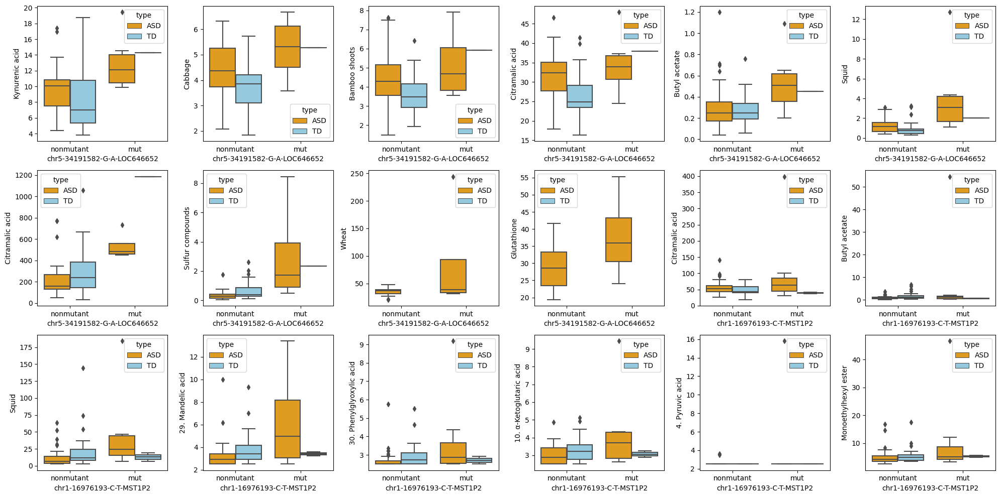

In [39]:
listA=modified_list
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[:18]):
    plt.subplot(3,6,j+1)
    ax=sns.boxplot(data=alldata_pivot2,x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(listeng[j])
    plt.tight_layout()

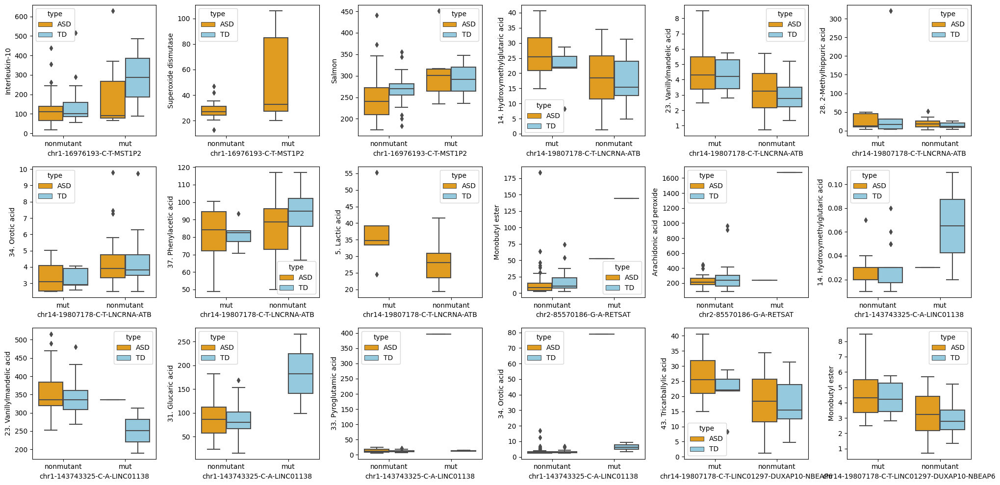

In [40]:
listA=modified_list
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[18:36]):
    plt.subplot(3,6,j+1)
    ax=sns.boxplot(data=alldata_pivot2,x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(listeng[18:36][j])
    plt.tight_layout()

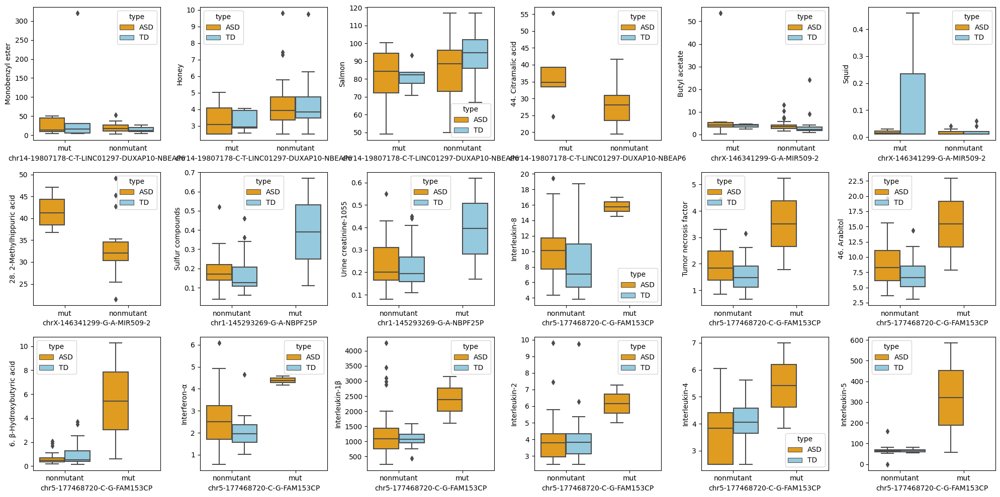

In [41]:
listA=modified_list
plt.subplots(figsize=(20,10))
for j,i in enumerate(listA[36:54]):
    plt.subplot(3,6,j+1)
    ax=sns.boxplot(data=alldata_pivot2,x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(listeng[36:54][j])
    plt.tight_layout()

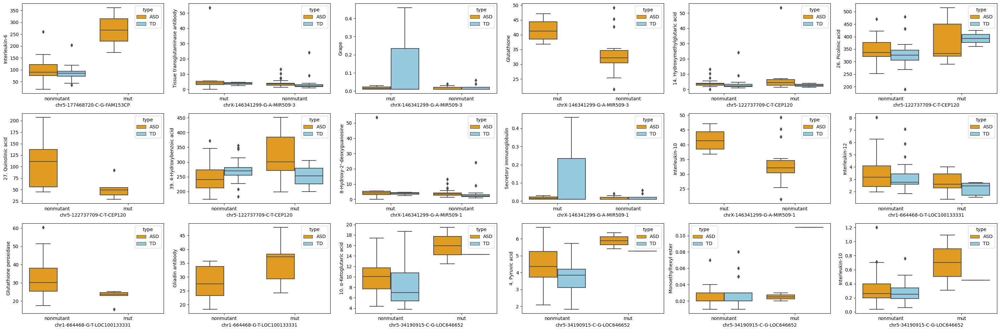

In [42]:
listA=modified_list
plt.subplots(figsize=(30,10))
for j,i in enumerate(listA[54:72]):
    plt.subplot(3,6,j+1)
    ax=sns.boxplot(data=alldata_pivot2,x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(listeng[54:72][j])
    plt.tight_layout()

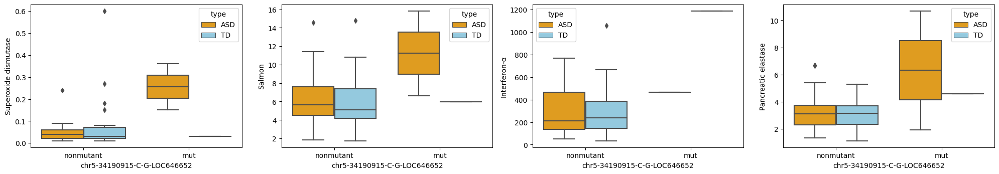

In [44]:
listA=modified_list
plt.subplots(figsize=(30,10))
for j,i in enumerate(listA[72:76]):
    plt.subplot(3,6,j+1)
    ax=sns.boxplot(data=alldata_pivot2,x=i[0],y=i[1],hue='type',palette=['orange','skyblue'])
    plt.ylabel(listeng[72:76][j])
    plt.tight_layout()